*Initially created at 13.03.2018 by Petteri Nevavuori (<petteri.nevavuori@mtech.fi>)*

---

# ML III. CNN Optimization

In this notebook we'll train several CNNs with Drone datasets and research if the drone images are valid with just themselves as inputs in predicting the yield outputs. We will perform training by the datasets generated at the previous notebook. We will use the images as inputs and use area-wise means as training targets.

The CNN will effectively comprise of a multilayer CNN connected to several linear layers for yield prediction. Some research questions:

- How many layers is optimal?
- What optimizer is optimal?
- What hyperparameters are optimal?
- Which input image size yields best results?

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#1.-Optimizer-Comparison" data-toc-modified-id="1.-Optimizer-Comparison-1">1. Optimizer Comparison</a></span><ul class="toc-item"><li><span><a href="#1.1-Batch-Size-Limits" data-toc-modified-id="1.1-Batch-Size-Limits-1.1">1.1 Batch Size Limits</a></span><ul class="toc-item"><li><span><a href="#1.1.1-SGD" data-toc-modified-id="1.1.1-SGD-1.1.1">1.1.1 SGD</a></span></li><li><span><a href="#1.1.2-RMSProp" data-toc-modified-id="1.1.2-RMSProp-1.1.2">1.1.2 RMSProp</a></span></li><li><span><a href="#1.1.3-Adadelta" data-toc-modified-id="1.1.3-Adadelta-1.1.3">1.1.3 Adadelta</a></span></li><li><span><a href="#1.1.4-Conclusions" data-toc-modified-id="1.1.4-Conclusions-1.1.4">1.1.4 Conclusions</a></span></li></ul></li><li><span><a href="#1.2-Comparing-with-Distinct-Datasets" data-toc-modified-id="1.2-Comparing-with-Distinct-Datasets-1.2">1.2 Comparing with Distinct Datasets</a></span><ul class="toc-item"><li><span><a href="#1.2.1-NDVI-Earlier-Dataset" data-toc-modified-id="1.2.1-NDVI-Earlier-Dataset-1.2.1">1.2.1 NDVI Earlier Dataset</a></span></li><li><span><a href="#1.2.2-NDVI-Later-Dataset" data-toc-modified-id="1.2.2-NDVI-Later-Dataset-1.2.2">1.2.2 NDVI Later Dataset</a></span></li><li><span><a href="#1.2.3-RGB-Earlier-Dataset" data-toc-modified-id="1.2.3-RGB-Earlier-Dataset-1.2.3">1.2.3 RGB Earlier Dataset</a></span></li><li><span><a href="#1.2.4-RGB-Later-Dataset" data-toc-modified-id="1.2.4-RGB-Later-Dataset-1.2.4">1.2.4 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#1.4-Conclusion-for-the-Optimizer" data-toc-modified-id="1.4-Conclusion-for-the-Optimizer-1.3">1.4 Conclusion for the Optimizer</a></span><ul class="toc-item"><li><span><a href="#1.4.1-NDVI-Datasets" data-toc-modified-id="1.4.1-NDVI-Datasets-1.3.1">1.4.1 NDVI Datasets</a></span></li><li><span><a href="#1.4.2-RGB-Datasets" data-toc-modified-id="1.4.2-RGB-Datasets-1.3.2">1.4.2 RGB Datasets</a></span></li><li><span><a href="#1.4.3-Final-Optimizer-Conclusions" data-toc-modified-id="1.4.3-Final-Optimizer-Conclusions-1.3.3">1.4.3 Final Optimizer Conclusions</a></span></li></ul></li></ul></li><li><span><a href="#2.-Optimal-Depth" data-toc-modified-id="2.-Optimal-Depth-2">2. Optimal Depth</a></span><ul class="toc-item"><li><span><a href="#2.1-Depth-Comparisons" data-toc-modified-id="2.1-Depth-Comparisons-2.1">2.1 Depth Comparisons</a></span><ul class="toc-item"><li><span><a href="#2.1.1-NDVI-Earlier-Dataset" data-toc-modified-id="2.1.1-NDVI-Earlier-Dataset-2.1.1">2.1.1 NDVI Earlier Dataset</a></span></li><li><span><a href="#2.1.2-NDVI-Later-Dataset" data-toc-modified-id="2.1.2-NDVI-Later-Dataset-2.1.2">2.1.2 NDVI Later Dataset</a></span></li><li><span><a href="#2.1.3-RGB-Earlier-Dataset" data-toc-modified-id="2.1.3-RGB-Earlier-Dataset-2.1.3">2.1.3 RGB Earlier Dataset</a></span></li><li><span><a href="#2.1.4-RGB-Later-Dataset" data-toc-modified-id="2.1.4-RGB-Later-Dataset-2.1.4">2.1.4 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#2.2-Re-training-poorly-initialized-models" data-toc-modified-id="2.2-Re-training-poorly-initialized-models-2.2">2.2 Re-training poorly initialized models</a></span></li><li><span><a href="#2.3-Conclusion-for-the-Depth" data-toc-modified-id="2.3-Conclusion-for-the-Depth-2.3">2.3 Conclusion for the Depth</a></span></li></ul></li><li><span><a href="#3.-Initializing-Baseline-Networks" data-toc-modified-id="3.-Initializing-Baseline-Networks-3">3. Initializing Baseline Networks</a></span><ul class="toc-item"><li><span><a href="#3.1-RGB-Earlier-Dataset" data-toc-modified-id="3.1-RGB-Earlier-Dataset-3.1">3.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2-RGB-Later-Dataset" data-toc-modified-id="3.2-RGB-Later-Dataset-3.2">3.2 RGB Later Dataset</a></span></li><li><span><a href="#3.3-Benchmark-Trainings" data-toc-modified-id="3.3-Benchmark-Trainings-3.3">3.3 Benchmark Trainings</a></span><ul class="toc-item"><li><span><a href="#3.3.1-RGB-Earlier-Dataset" data-toc-modified-id="3.3.1-RGB-Earlier-Dataset-3.3.1">3.3.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.3.2-RGB-Later-Dataset" data-toc-modified-id="3.3.2-RGB-Later-Dataset-3.3.2">3.3.2 RGB Later Dataset</a></span></li></ul></li></ul></li><li><span><a href="#4.-Optimizer-Tuning" data-toc-modified-id="4.-Optimizer-Tuning-4">4. Optimizer Tuning</a></span><ul class="toc-item"><li><span><a href="#4.1-Grid-Search" data-toc-modified-id="4.1-Grid-Search-4.1">4.1 Grid Search</a></span><ul class="toc-item"><li><span><a href="#4.1.1-RGB-Earlier-Dataset" data-toc-modified-id="4.1.1-RGB-Earlier-Dataset-4.1.1">4.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.1.2-RGB-Later-Dataset" data-toc-modified-id="4.1.2-RGB-Later-Dataset-4.1.2">4.1.2 RGB Later Dataset</a></span></li><li><span><a href="#4.1.3-Conclusions" data-toc-modified-id="4.1.3-Conclusions-4.1.3">4.1.3 Conclusions</a></span></li></ul></li><li><span><a href="#4.2-Random-Search" data-toc-modified-id="4.2-Random-Search-4.2">4.2 Random Search</a></span><ul class="toc-item"><li><span><a href="#4.2.1-RGB-Earlier-Dataset" data-toc-modified-id="4.2.1-RGB-Earlier-Dataset-4.2.1">4.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.2.2-RGB-Later-Dataset" data-toc-modified-id="4.2.2-RGB-Later-Dataset-4.2.2">4.2.2 RGB Later Dataset</a></span></li><li><span><a href="#4.2.3-Conclusions" data-toc-modified-id="4.2.3-Conclusions-4.2.3">4.2.3 Conclusions</a></span></li></ul></li></ul></li><li><span><a href="#5.-Regularization" data-toc-modified-id="5.-Regularization-5">5. Regularization</a></span><ul class="toc-item"><li><span><a href="#5.1-Weight-decay" data-toc-modified-id="5.1-Weight-decay-5.1">5.1 Weight decay</a></span><ul class="toc-item"><li><span><a href="#5.1.1-Grid-Search-with-Both-RGB-Datasets" data-toc-modified-id="5.1.1-Grid-Search-with-Both-RGB-Datasets-5.1.1">5.1.1 Grid Search with Both RGB Datasets</a></span><ul class="toc-item"><li><span><a href="#5.1.1.1-RGB-Earlier-Dataset" data-toc-modified-id="5.1.1.1-RGB-Earlier-Dataset-5.1.1.1">5.1.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#5.1.1.2-RGB-Later-Dataset" data-toc-modified-id="5.1.1.2-RGB-Later-Dataset-5.1.1.2">5.1.1.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#5.1.2-Random-Search-with-Both-Datasets" data-toc-modified-id="5.1.2-Random-Search-with-Both-Datasets-5.1.2">5.1.2 Random Search with Both Datasets</a></span><ul class="toc-item"><li><span><a href="#5.1.2.1-RGB-Earlier-Dataset" data-toc-modified-id="5.1.2.1-RGB-Earlier-Dataset-5.1.2.1">5.1.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#5.1.2.2-RGB-Later-Dataset" data-toc-modified-id="5.1.2.2-RGB-Later-Dataset-5.1.2.2">5.1.2.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#5.1.3-Conclusions" data-toc-modified-id="5.1.3-Conclusions-5.1.3">5.1.3 Conclusions</a></span></li></ul></li><li><span><a href="#5.2.-Early-Stopping" data-toc-modified-id="5.2.-Early-Stopping-5.2">5.2. Early Stopping</a></span><ul class="toc-item"><li><span><a href="#5.2.1-RGB-Earlier-Dataset" data-toc-modified-id="5.2.1-RGB-Earlier-Dataset-5.2.1">5.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#5.2.2-RGB-Later-Dataset" data-toc-modified-id="5.2.2-RGB-Later-Dataset-5.2.2">5.2.2 RGB Later Dataset</a></span></li><li><span><a href="#5.2.3-Conclusions" data-toc-modified-id="5.2.3-Conclusions-5.2.3">5.2.3 Conclusions</a></span></li></ul></li></ul></li></ul></div>

## 1. Optimizer Comparison

The first comparison point is the optimizer. While some hints were already provided in the CNN building phase, we'll asses the differences more distinctly here. We will compare vanilla implementations of `PyTorch`'s SGD with momentum, RMSProp and Adadelta. The CNN will by default use SGD with momentum, so we'll introduce explicitly only the RMSProp and Adadelta. We won't use early stopping yet, as we want to see how the training progresses.


### 1.1 Batch Size Limits

During the course of training the models with varying optimzier it was noticed that sometimes a batch size too large would result in the optimizer failing to reduce the objective loss. Thus we will explore the optimizer limits. The initial intuition is that there exists a dual limit to batch size. The first is the GPU memory and the second is a level above which the optimizer switches from functional to detrimental.

We will test every batch size with triple initialization. This is to see whether random initialization of model's parameters has a noticeable role.

In [1]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np
from torch import optim

from field_analysis.model.dataset.dataperiod import DroneNDVIEarlier, DroneRGBEarlier
from field_analysis.model.nets.cnn import DroneYieldMeanCNN

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]


def test_optimizer_batch_size(optimizer):
    plt.rcParams['figure.figsize'] = 10, 3
    batch_sizes = [32*2**x for x in range(6)]
    for i, source_dim in enumerate([32, 64, 128]):
        for j, dataset in enumerate([DroneNDVIEarlier, DroneRGBEarlier]):
            ds_name = "NDVI"
            if j == 1:
                ds_name = "RGB"
            for batch_size in batch_sizes:
                losses = []
                losses_deltas = []
                try:
                    for k in range(3):
                        cnn = DroneYieldMeanCNN(
                            source_bands=max(1, 3*j),
                            source_dim=source_dim,
                            optimizer=optimizer)
                        cnn.train(
                            epochs=3,
                            training_data=dataset(dbs[i]),
                            k_cv_folds=3,
                            visualize=False,
                            suppress_output=True,
                            save_model=False)
                        test_errors = cnn.produce_test_errors(dataset(dbs[i],test=True))
                        losses.append(test_errors['mean_error'])
                except Exception as ex:
                    print(ex)
                if len(losses) > 0:
                    losses = np.array(losses)
                    plt.scatter([batch_size]*len(losses), losses, alpha=0.5)
                    plt.errorbar(batch_size, losses.mean(), losses.std(),
                                 linestyle='--', capsize=6, marker='x')
            plt.title('Mean Test Losses for {} {}x{} with three initializations'.format(ds_name, source_dim, source_dim))
            plt.xlabel('Batch Size')
            plt.ylabel('$\mu_{Loss}$')
            plt.xticks(batch_sizes)
            plt.ylim(bottom=0)
            plt.xlim(16, 1040)
            plt.grid()
            plt.tight_layout()
            plt.show()

#### 1.1.1 SGD

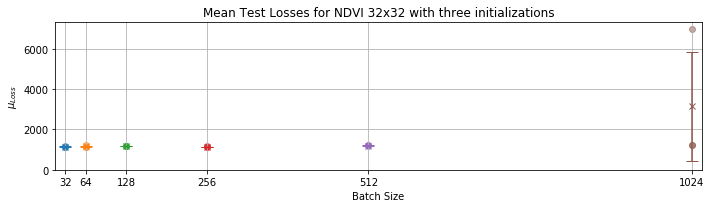

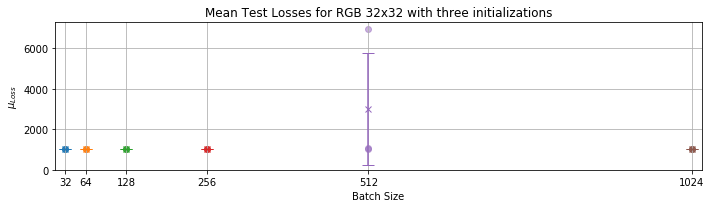

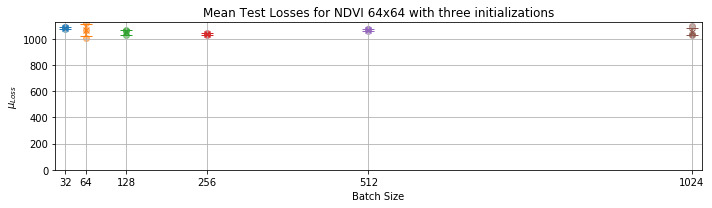

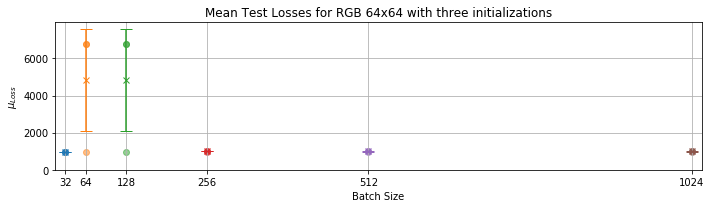

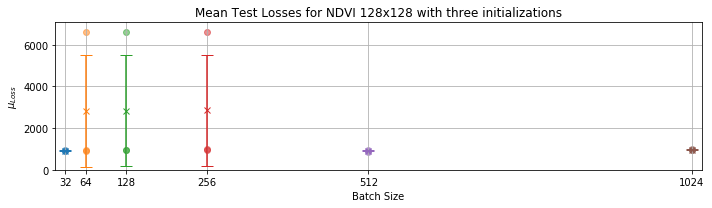

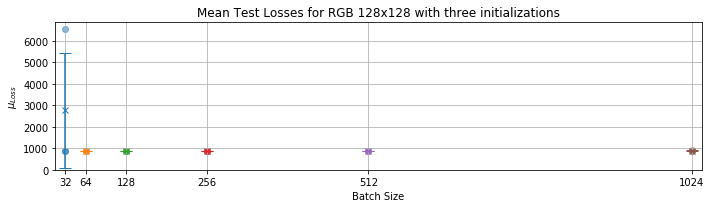

In [2]:
test_optimizer_batch_size(optimizer=None)

#### 1.1.2 RMSProp

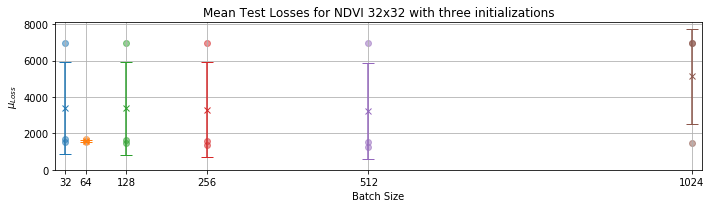

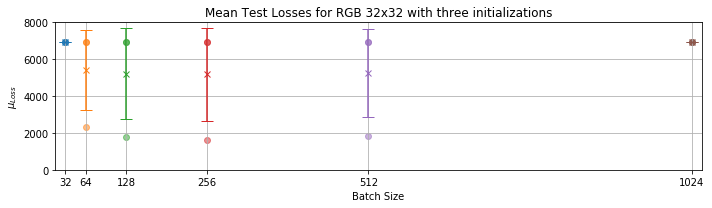

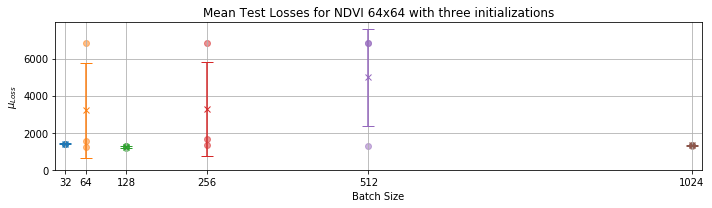

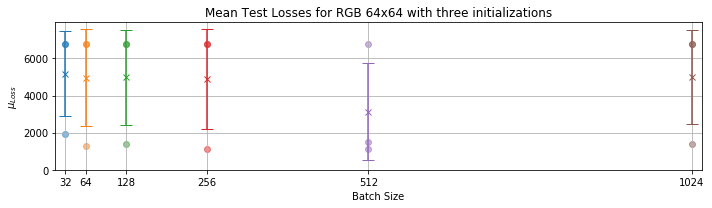

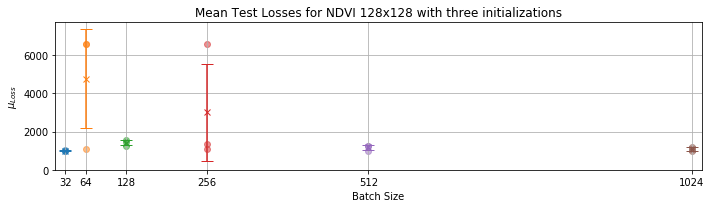

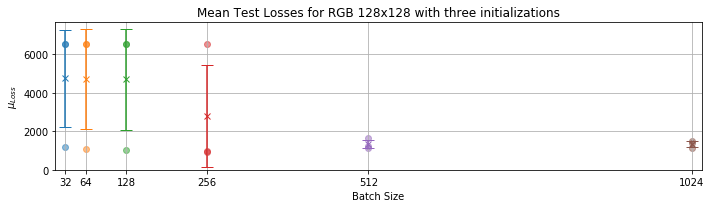

In [3]:
test_optimizer_batch_size(optimizer=optim.RMSprop)

#### 1.1.3 Adadelta

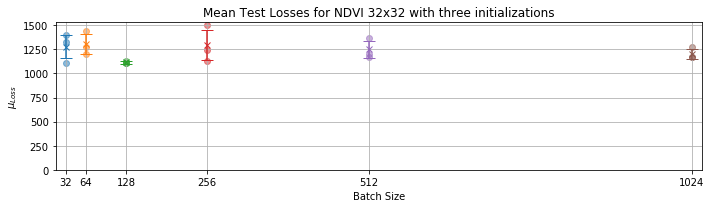

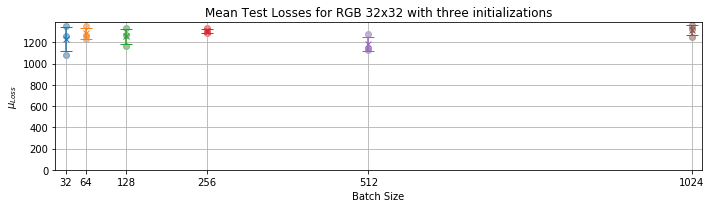

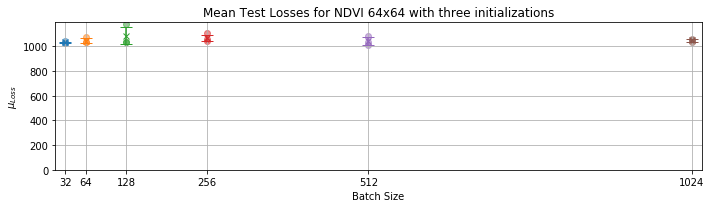

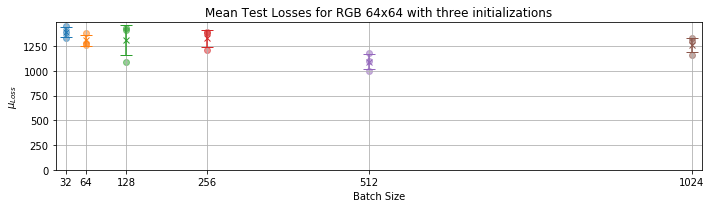

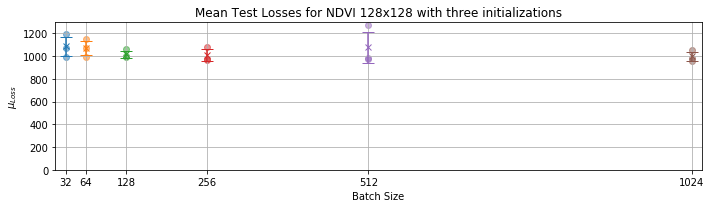

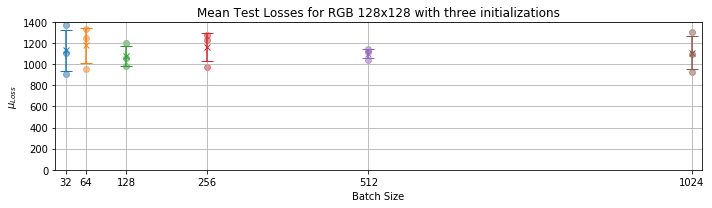

In [4]:
test_optimizer_batch_size(optimizer=optim.Adadelta)

#### 1.1.4 Conclusions

Here are the results from trying out multiple batch size in range $[2^5, 2^{10}]$. The results are given for each optimizer and dataset and presented in table below. The columns represent the batch sizes and the rows the batch-wise feasibilities for each optimizer and dataset. The possible outcomes are **feasible** (Y), **not feasible** (N) and **over the GPU memory limit** (-). 

The feasibility is determined by whether the optimizer was able to start minimizing the test error during three epochs. A telltale sign of the inability to minimize is when the values stay around the level of the median of the target values. This essentially means that the network produces values close to zero while the absolute target values are around 6500. As each dataset-optimizer-pair is initialized and trained three times, **a pair is feasible when majority of initializations provide sufficient minimization**. With three initialization this means that one non-minimizing initialization is within the threshold.

| *SGD*    | 32 | 64 | 128 | 256 | 512 | 1024 |
|----------|----|----|-----|-----|-----|------|
| NDVI 32  | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 32   | Y  | Y  | Y   | Y   | Y   | Y    |
| NDVI 64  | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 64   | Y  | N  | N   | Y   | Y   | Y    |
| NDVI 128 | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 128  | Y  | Y  | Y   | Y   | Y   | Y    |

| *RMSprop* | 32 | 64 | 128 | 256 | 512 | 1024 |
|-----------|----|----|-----|-----|-----|------|
| NDVI 32   | Y  | Y  | Y   | Y   | Y   | N    |
| RGB 32    | N  | N  | N   | N   | N   | N    |
| NDVI 64   | Y  | Y  | Y   | Y   | N   | Y    |
| RGB 64    | N  | N  | N   | N   | Y   | N    |
| NDVI 128  | Y  | N  | Y   | Y   | Y   | Y    |
| RGB 128   | N  | N  | N   | Y   | Y   | Y    |

| *Adadelta* | 32 | 64 | 128 | 256 | 512 | 1024 |
|------------|----|----|-----|-----|-----|------|
| NDVI 32    | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 32     | Y  | Y  | Y   | Y   | Y   | Y    |
| NDVI 64    | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 64     | Y  | Y  | Y   | Y   | Y   | Y    |
| NDVI 128   | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 128    | Y  | Y  | Y   | Y   | Y   | Y    |

Adadelta seems to be the most robust while the RMSprop is the pickiest one. Also the way the RMSprop behaves induces mistrust towards it as it seems quite unreliable. **The comparison will thus continue with SGD and Adadelta only and with a fixed batch size of 128.** This is because they are reliable and do not seemingly randomly tend to fail to start initializing. This is the case with RMSprop, as there is no clear distinction in the setting that causes the optimization to fail. While SGD fails at times, it is clearly with higher batch sizes. RMSprop fails from the smallest to the largest  batch sizes.

### 1.2 Comparing with Distinct Datasets

We'll begin by looking at the NDVI datasets first. Initially we'll use a tad deeper topology, as it proved to have a large enough capacity to show distinction between training and test losses. This is a good thing as the model is able to fit better. This also makes the use of regularization viable in driving the test losses down. **Each model is trained for 50 epochs**.

Then we'll do the same comparison with RGB images. We will train each dataset with each of the optimizers and see how they manage.

In [1]:
import os
import pandas as pd
import numpy as np
from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]
optimizer_models_dir = os.path.join(model_settings.MODELS_DIR,'optimizer')
os.makedirs(optimizer_models_dir,exist_ok=True)

optimizers = [None, optim.Adadelta]

def test_optimizer(dataloader):
    losses = pd.DataFrame()
    for i, db in enumerate(dbs):
        dataset = dataloader(db_name=db)
        dataset_name = dataset.__class__.__name__
        source_bands = 1  # NDVI
        if 'RGB' in dataset_name:
            source_bands = 3
        for optimizer in optimizers:
            source_dim = 32*(2**i)
            if optimizer is not None:
                optim_name = 'Adadelta'
            else:
                optim_name = 'SGD'
            cnn = DroneYieldMeanCNN(
                source_bands=source_bands,
                source_dim=source_dim,
                cnn_layers=6,
                fc_layers=2,
                optimizer=optimizer)
            cnn.model_path = os.path.join(optimizer_models_dir,cnn.model_filename)
            print(cnn.model_path)
            cnn.train(
                epochs=50,
                training_data=dataset,
                k_cv_folds=3,
                suppress_output=True)
            test_errors = cnn.produce_test_errors(dataloader(db,test=True))
            print(f"Test MAE: {test_errors['mean_error']}")
            print()
            losses.loc[source_dim,optim_name] = test_errors['mean_error']
            
    return losses

#### 1.2.1 NDVI Earlier Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_185320156_SGD_1x32x32_6cnn_2fc.pkl
Best Validation Loss: 1139.53


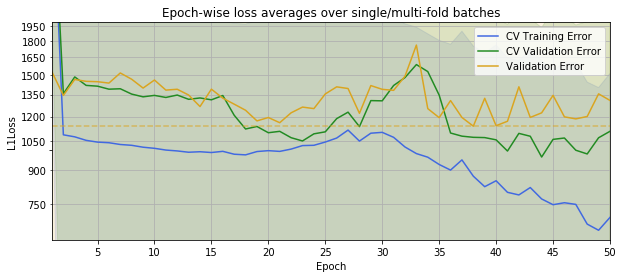

Test MAE: 1175.875179971231

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_185913768_Adadelta_1x32x32_6cnn_2fc.pkl
Best Validation Loss: 1057.91


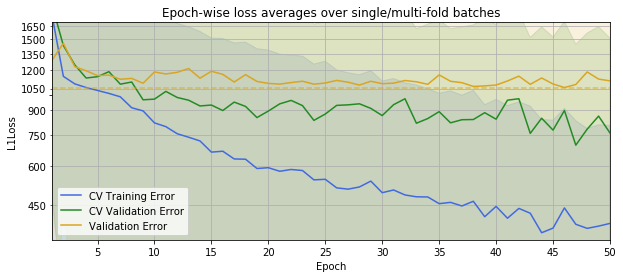

Test MAE: 895.2216986578863

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_190516901_SGD_1x64x64_6cnn_2fc.pkl
Best Validation Loss: 879.80


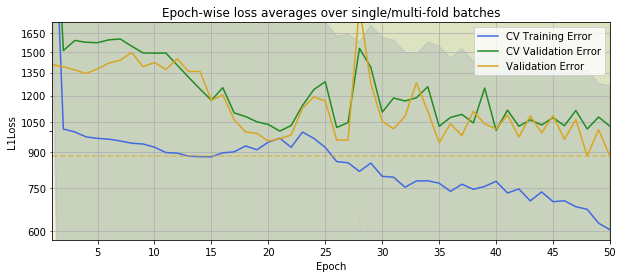

Test MAE: 1311.521271366401

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_191336192_Adadelta_1x64x64_6cnn_2fc.pkl
Best Validation Loss: 820.91


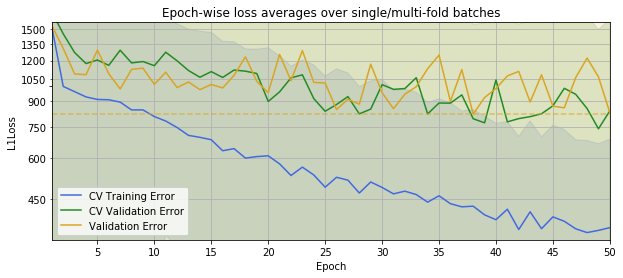

Test MAE: 1138.6060107749581

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_192201851_SGD_1x128x128_6cnn_2fc.pkl
Best Validation Loss: 678.18


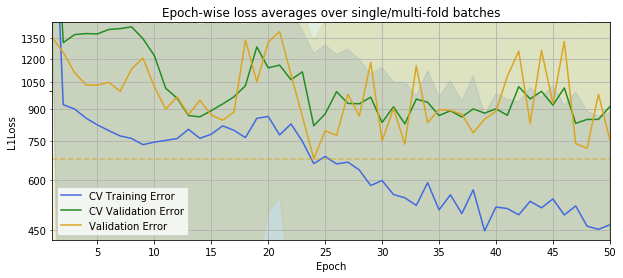

Test MAE: 1751.1687115608377

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_193924883_Adadelta_1x128x128_6cnn_2fc.pkl
Best Validation Loss: 571.85


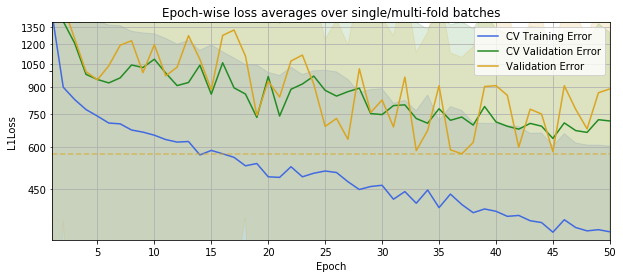

Test MAE: 842.7688683043135



In [2]:
result_earlier_ndvi = test_optimizer(dataloader=dp.DroneNDVIEarlier)

#### 1.2.2 NDVI Later Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_195648054_SGD_1x32x32_6cnn_2fc.pkl
Best Validation Loss: 1377.24


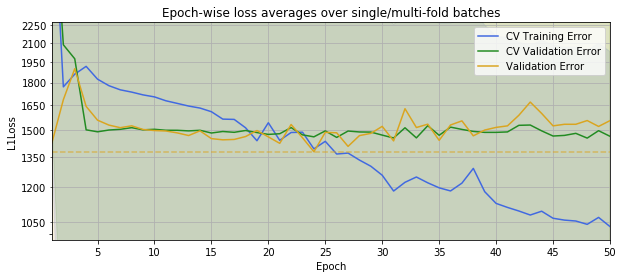

Test MAE: 1794.0976653376445

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_200333707_Adadelta_1x32x32_6cnn_2fc.pkl
Best Validation Loss: 1319.01


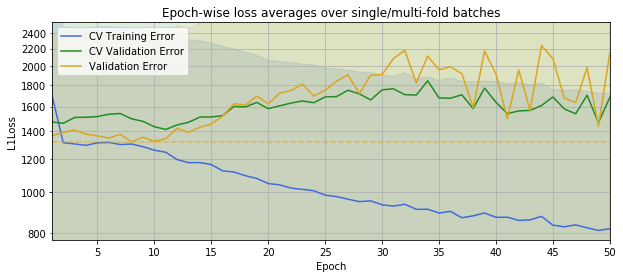

Test MAE: 1461.4619792821995

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_201031464_SGD_1x64x64_6cnn_2fc.pkl
Best Validation Loss: 1332.38


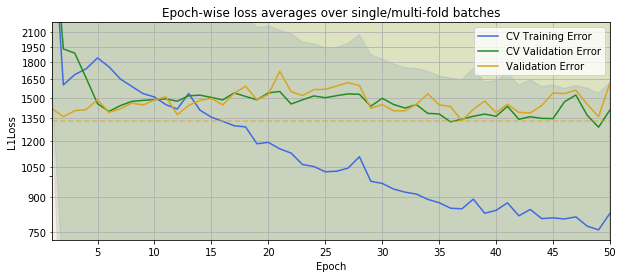

Test MAE: 1272.6184250172175

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_201938300_Adadelta_1x64x64_6cnn_2fc.pkl
Best Validation Loss: 1167.56


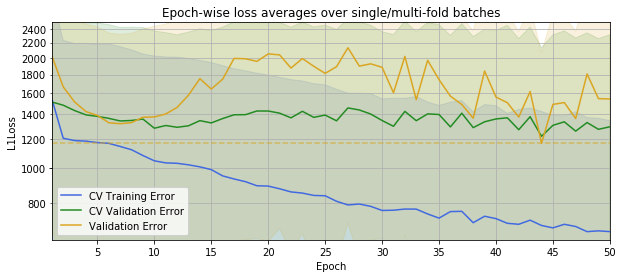

Test MAE: 1104.009270281831

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_202852145_SGD_1x128x128_6cnn_2fc.pkl
Best Validation Loss: 1183.00


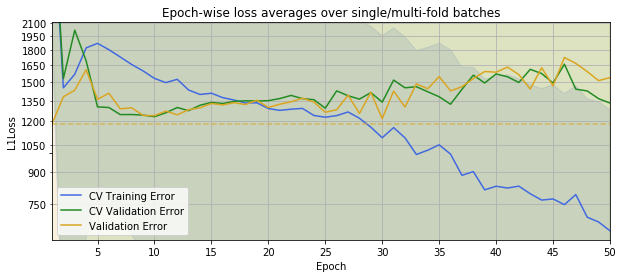

Test MAE: 1183.6572550455728

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_204559132_Adadelta_1x128x128_6cnn_2fc.pkl
Best Validation Loss: 876.76


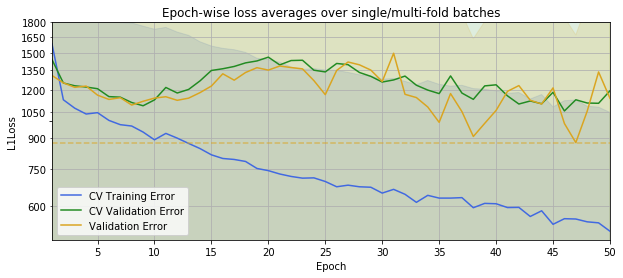

Test MAE: 1165.1029839409723



In [3]:
result_later_ndvi = test_optimizer(dataloader=dp.DroneNDVILater)

#### 1.2.3 RGB Earlier Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_210302084_SGD_3x32x32_6cnn_2fc.pkl
Best Validation Loss: 964.40


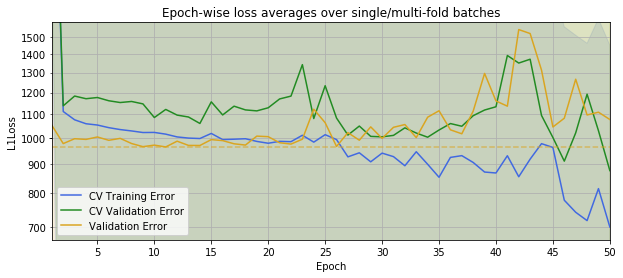

Test MAE: 1495.558234448703

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_211020639_Adadelta_3x32x32_6cnn_2fc.pkl
Best Validation Loss: 1051.44


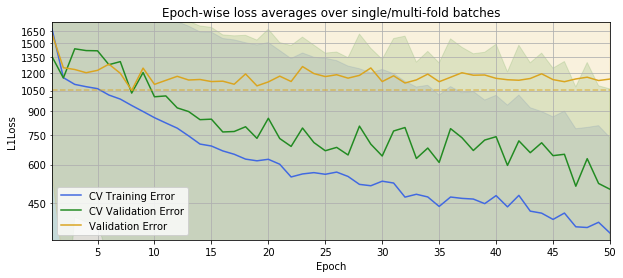

Test MAE: 796.1074073976583

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_211744622_SGD_3x64x64_6cnn_2fc.pkl
Best Validation Loss: 913.73


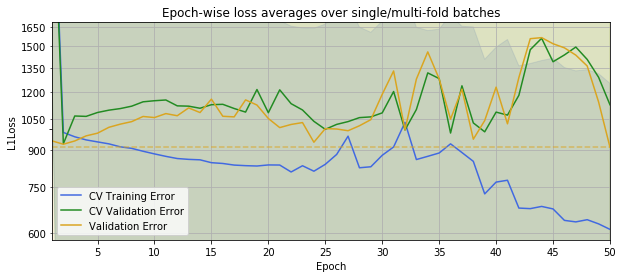

Test MAE: 1149.4344775322902

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_212812440_Adadelta_3x64x64_6cnn_2fc.pkl
Best Validation Loss: 768.72


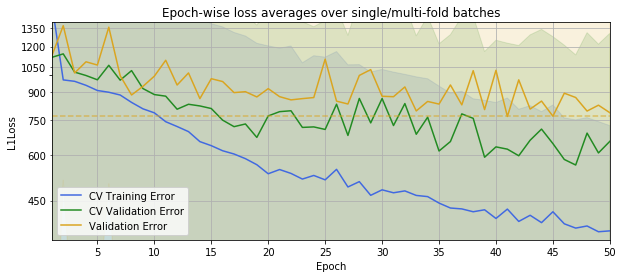

Test MAE: 1042.9515179384102

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_213841801_SGD_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 768.92


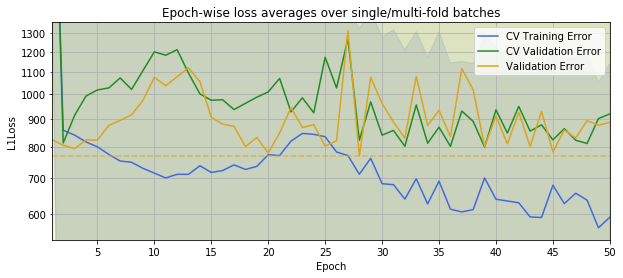

Test MAE: 1231.5254287202129

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_220148710_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 482.05


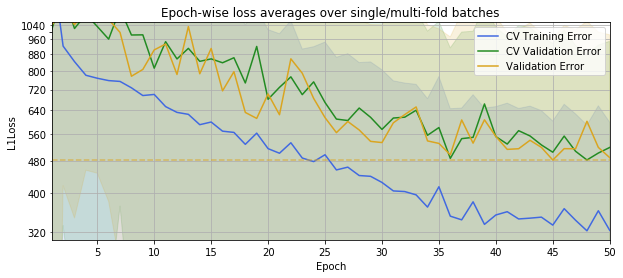

Test MAE: 836.1544721129792



In [4]:
result_earlier_rgb = test_optimizer(dataloader=dp.DroneRGBEarlier)

#### 1.2.4 RGB Later Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_222457680_SGD_3x32x32_6cnn_2fc.pkl
Best Validation Loss: 1066.56


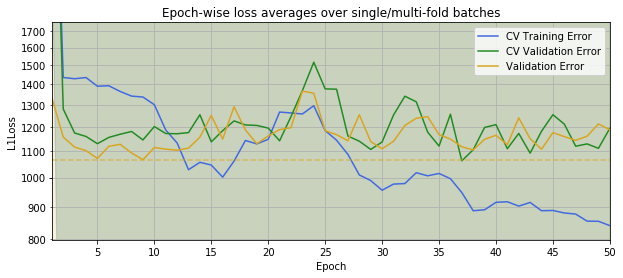

Test MAE: 1492.7940201722602

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_223151722_Adadelta_3x32x32_6cnn_2fc.pkl
Best Validation Loss: 1049.07


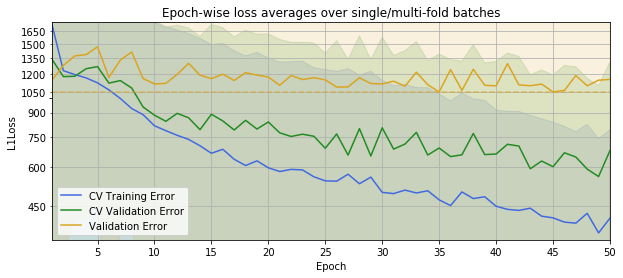

Test MAE: 998.0701473571119

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_223851488_SGD_3x64x64_6cnn_2fc.pkl
Best Validation Loss: 879.52


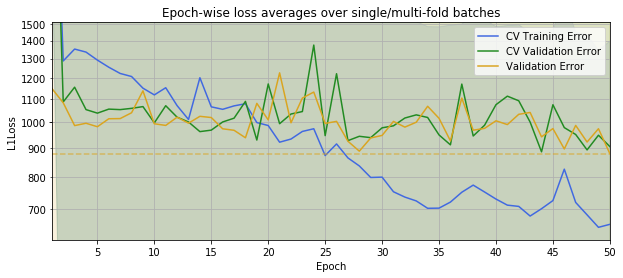

Test MAE: 1487.6902936790973

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_224842848_Adadelta_3x64x64_6cnn_2fc.pkl
Best Validation Loss: 705.24


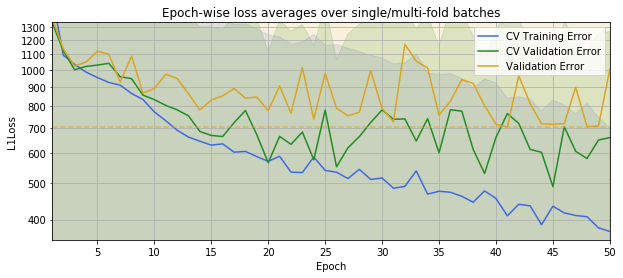

Test MAE: 1045.1641370487362

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_225839001_SGD_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 630.36


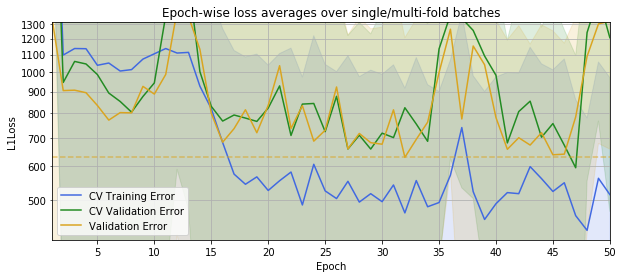

Test MAE: 985.0151090013851

/home/nevavuor/crop-field-cnn/models/optimizer/20190112_232007314_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 384.44


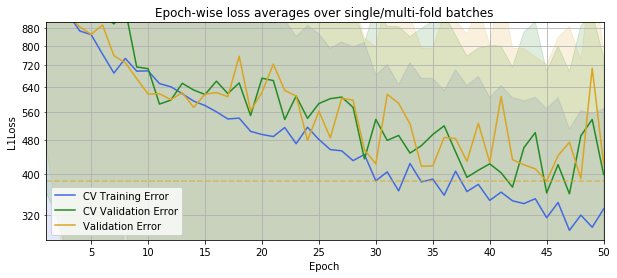

Test MAE: 989.450802436698



In [5]:
result_later_rgb = test_optimizer(dataloader=dp.DroneRGBLater)

### 1.4 Conclusion for the Optimizer

First we'll take a look at the test losses produced with distinct datasets for each optimizer.

In [6]:
pd.options.display.float_format = '{:.2f}'.format

#### 1.4.1 NDVI Datasets

The following tables show the best test L1-losses with distinct datasets and optimizers. The first table is for the earlier dataset with pre-July Drone NDVI images:

In [7]:
result_earlier_ndvi

,SGD,Adadelta
32,1175.88,895.22
64,1311.52,1138.61
128,1751.17,842.77


In [8]:
result_later_ndvi

,SGD,Adadelta
32,1794.10,1461.46
64,1272.62,1104.01
128,1183.66,1165.10


#### 1.4.2 RGB Datasets

Let's pull up the tables for period-wise lowest L1-losses with only 50 epochs and no tuning. First one is the table for pre-July RGB datasets:

In [9]:
result_earlier_rgb

,SGD,Adadelta
32,1495.56,796.11
64,1149.43,1042.95
128,1231.53,836.15


In [10]:
result_later_rgb

,SGD,Adadelta
32,1492.79,998.07
64,1487.69,1045.16
128,985.02,989.45


#### 1.4.3 Final Optimizer Conclusions

After ruling out the RMSprop in the optimal batch size exploration stage already the comparison was conducted between the SGD with momentum and Adadelta. Adadelta produced the best results out every training configuration. This means that it succeeded better in utilizing the capacity of the model. **We will thus use Adadelta as the optimizer.**

## 2. Optimal Depth

Next up is comparing several depths for the CNN component of the network. We will attempt at keeping the FC layers at two to really isolate the CNN performance. A good result is achieved when the network is able to even overfit. That means the capacity is sufficient and allows for the utilization of regularization to drive the test error down.

Even though the number of total trainings is high (48 distinct trainings), we will still go through them. In the later stages of the optimization we will use only some of the datasets if similar results are produced to the comparison of optimizers. We will also increase the number of epochs to see where the deeper models would progress.

In [11]:
import os
import pandas as pd
import numpy as np
from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]
depth_models_dir = os.path.join(model_settings.MODELS_DIR,'depth')
results_dir = os.path.join(os.getcwd(),'results')
os.makedirs(depth_models_dir,exist_ok=True)
os.makedirs(results_dir,exist_ok=True)

def test_depth(dataloader, bands):
    depths = list(range(4, 14, 2))
    multi_index = pd.MultiIndex.from_product([[32,64,128],depths])
    losses = pd.DataFrame(index=['test','train'],columns=multi_index)
    for i, db in enumerate(dbs):
        dataset = dataloader(db_name=db)
        dataset_name = dataset.__class__.__name__
        source_bands = 1  # NDVI
        if 'RGB' in dataset_name:
            source_bands = 3
        for depth in depths:
            source_dim = 32*(2**i)
            cnn = DroneYieldMeanCNN(
                source_bands=bands,
                source_dim=source_dim,
                cnn_layers=depth,
                fc_layers=2,
                optimizer=optim.Adadelta)
            cnn.model_path = os.path.join(depth_models_dir,cnn.model_filename)
            print(cnn.model_path)
            losses_dict= cnn.train(
                epochs=50,
                training_data=dataset,
                k_cv_folds=3,
                suppress_output=True)
            test_errors = cnn.produce_test_errors(dataloader(db,test=True))
            print(f"Test MAE: {test_errors['mean_error']}")
            print()
            best_train_loss = np.array(losses_dict['training_losses_mean_std'])[:, 0].min()
            losses.loc['test',(source_dim,depth)] = test_errors['mean_error']
            losses.loc['train',(source_dim,depth)] = best_train_loss
    return losses

In [12]:
def test_depth_single(dataloader, bands, db, depth, dim):
    depths = list(range(4, 14, 2))
    multi_index = pd.MultiIndex.from_product([[32,64,128],depths])
    losses = pd.DataFrame(index=['test','train'],columns=multi_index)
    dataset = dataloader(db_name=db)
    dataset_name = dataset.__class__.__name__
    source_bands = 1  # NDVI
    if 'RGB' in dataset_name:
        source_bands = 3
    source_dim = dim
    cnn = DroneYieldMeanCNN(
        source_bands=bands,
        source_dim=source_dim,
        cnn_layers=depth,
        fc_layers=2,
        optimizer=optim.Adadelta)
    cnn.model_path = os.path.join(depth_models_dir,cnn.model_filename)
    print(cnn.model_path)
    losses_dict= cnn.train(
        epochs=50,
        training_data=dataset,
        k_cv_folds=3,
        suppress_output=True)
    test_errors = cnn.produce_test_errors(dataloader(db,test=True))
    print(f"Test MAE: {test_errors['mean_error']}")
    print()
    
    best_train_loss = np.array(losses_dict['training_losses_mean_std'])[:, 0].min()
    losses.loc['test',(source_dim,depth)] = test_errors['mean_error']
    losses.loc['train',(source_dim,depth)] = best_train_loss
    return losses

### 2.1 Depth Comparisons

First, as with the optimizer, we'll go through the NDVI datasets. Then the RGB ones.

#### 2.1.1 NDVI Earlier Dataset

/home/nevavuor/crop-field-cnn/models/depth/20190113_083207664_Adadelta_1x32x32_4cnn_2fc.pkl
Best Validation Loss: 1068.11


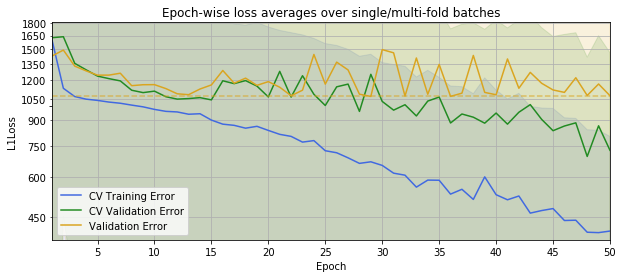

Test MAE: 852.44469868428

/home/nevavuor/crop-field-cnn/models/depth/20190113_083837097_Adadelta_1x32x32_6cnn_2fc.pkl
Best Validation Loss: 1110.77


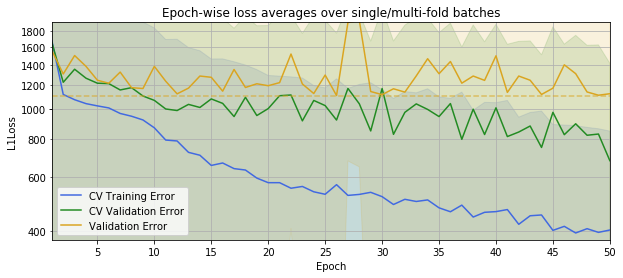

Test MAE: 1039.3905654494827

/home/nevavuor/crop-field-cnn/models/depth/20190113_084535441_Adadelta_1x32x32_8cnn_2fc.pkl
Best Validation Loss: 1068.24


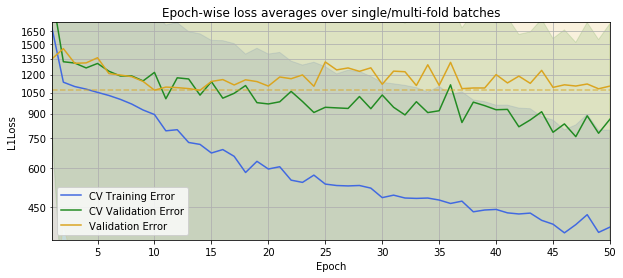

Test MAE: 920.8869449099979

/home/nevavuor/crop-field-cnn/models/depth/20190113_085304353_Adadelta_1x32x32_10cnn_2fc.pkl
Best Validation Loss: 1097.56


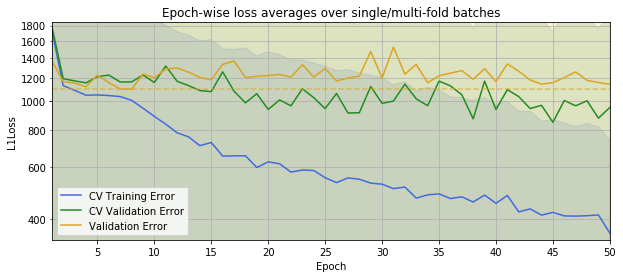

Test MAE: 933.1214268040013

/home/nevavuor/crop-field-cnn/models/depth/20190113_090100979_Adadelta_1x32x32_12cnn_2fc.pkl
Best Validation Loss: 1015.66


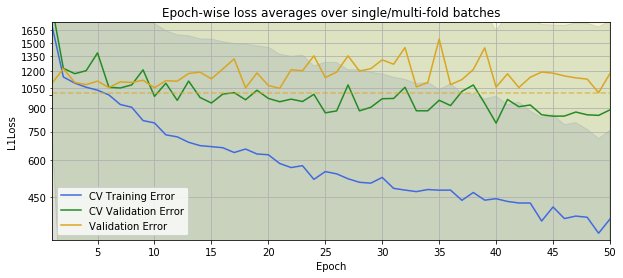

Test MAE: 822.0808394148543

/home/nevavuor/crop-field-cnn/models/depth/20190113_090929208_Adadelta_1x64x64_4cnn_2fc.pkl
Best Validation Loss: 862.30


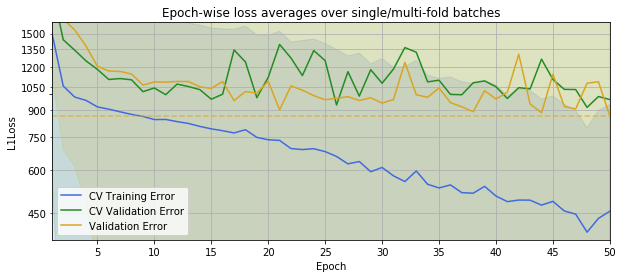

Test MAE: 1120.0617672504195

/home/nevavuor/crop-field-cnn/models/depth/20190113_091812182_Adadelta_1x64x64_6cnn_2fc.pkl
Best Validation Loss: 830.71


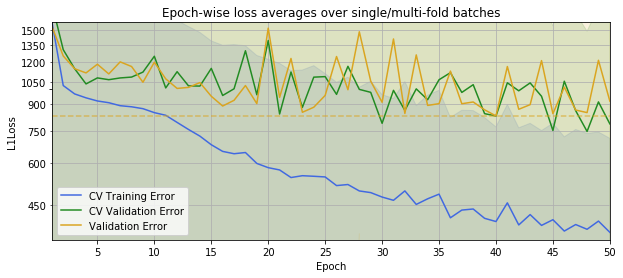

Test MAE: 1123.9021195994128

/home/nevavuor/crop-field-cnn/models/depth/20190113_092724586_Adadelta_1x64x64_8cnn_2fc.pkl
Best Validation Loss: 844.46


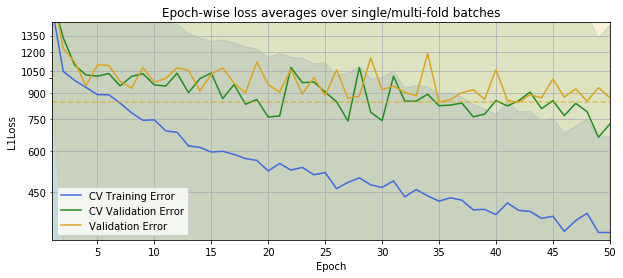

Test MAE: 840.2740247483222

/home/nevavuor/crop-field-cnn/models/depth/20190113_093704070_Adadelta_1x64x64_10cnn_2fc.pkl
Best Validation Loss: 866.82


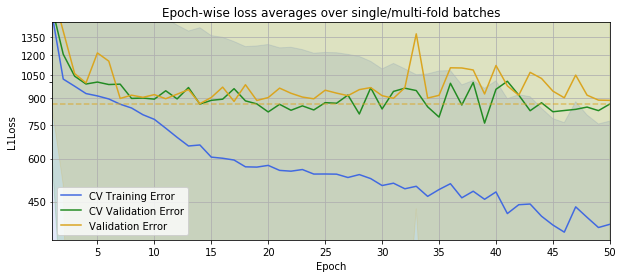

Test MAE: 1138.5949559563758

/home/nevavuor/crop-field-cnn/models/depth/20190113_094711873_Adadelta_1x64x64_12cnn_2fc.pkl
Best Validation Loss: 821.44


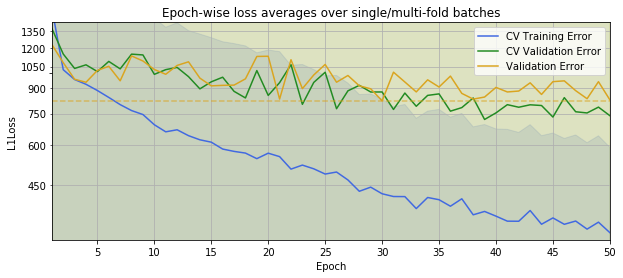

Test MAE: 1054.5066432466442

/home/nevavuor/crop-field-cnn/models/depth/20190113_095752415_Adadelta_1x128x128_4cnn_2fc.pkl
Best Validation Loss: 727.91


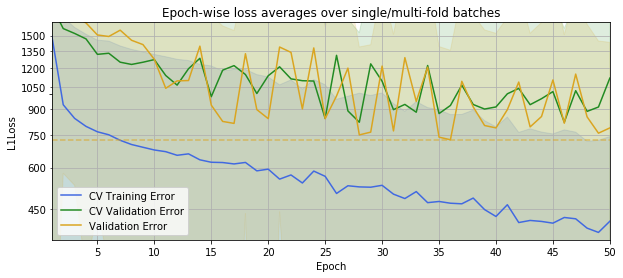

Test MAE: 1184.3981790745513

/home/nevavuor/crop-field-cnn/models/depth/20190113_101501141_Adadelta_1x128x128_6cnn_2fc.pkl
Best Validation Loss: 547.19


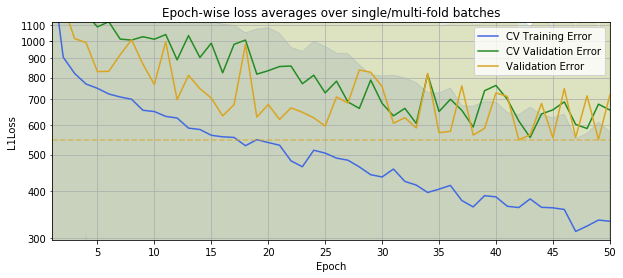

Test MAE: 831.5514825049867

/home/nevavuor/crop-field-cnn/models/depth/20190113_103227981_Adadelta_1x128x128_8cnn_2fc.pkl
Best Validation Loss: 596.54


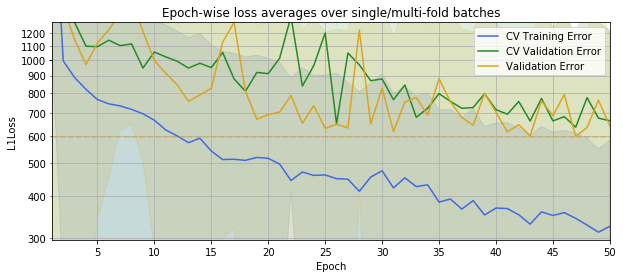

Test MAE: 800.8504229606466

/home/nevavuor/crop-field-cnn/models/depth/20190113_105022707_Adadelta_1x128x128_10cnn_2fc.pkl
Best Validation Loss: 592.91


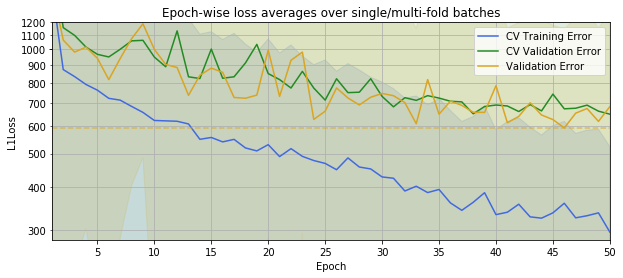

Test MAE: 882.0938519416972

/home/nevavuor/crop-field-cnn/models/depth/20190113_110848349_Adadelta_1x128x128_12cnn_2fc.pkl
Best Validation Loss: 618.84


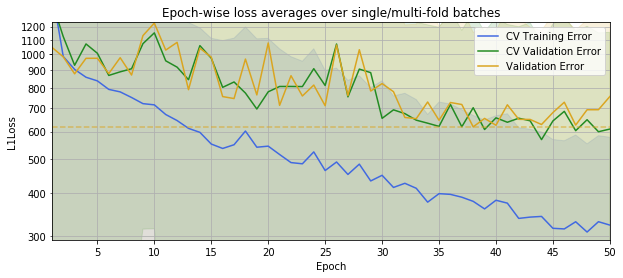

Test MAE: 988.530416285738



In [13]:
depth_ndvi_earlier = test_depth(dp.DroneNDVIEarlier, 1)
depth_ndvi_earlier.to_csv(os.path.join(results_dir,'depth_ndvi_earlier.csv'))

In [14]:
print("NDVI Earlier")
depth_ndvi_earlier

NDVI Earlier


32                                   64                          \
          4       6      8      10     12      4       6      8       10   
test  852.44 1039.39 920.89 933.12 822.08 1120.06 1123.90 840.27 1138.59   
train 403.44  395.14 373.24 359.01 339.07  395.89  372.95 338.38  366.75   

                  128                              
           12      4      6      8      10     12  
test  1054.51 1184.40 831.55 800.85 882.09 988.53  
train  319.47  382.73 312.75 312.86 296.45 308.95

#### 2.1.2 NDVI Later Dataset

/home/nevavuor/crop-field-cnn/models/depth/20190113_112741433_Adadelta_1x32x32_4cnn_2fc.pkl
Best Validation Loss: 1363.17


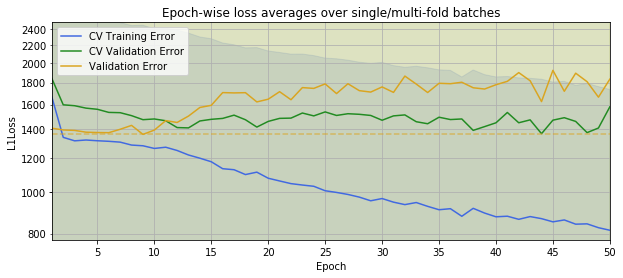

Test MAE: 1344.5616113129086

/home/nevavuor/crop-field-cnn/models/depth/20190113_113407466_Adadelta_1x32x32_6cnn_2fc.pkl
Best Validation Loss: 6330.50


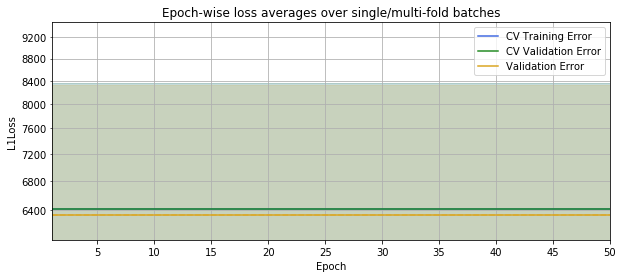

Test MAE: 6373.62383819518

/home/nevavuor/crop-field-cnn/models/depth/20190113_114101584_Adadelta_1x32x32_8cnn_2fc.pkl
Best Validation Loss: 1348.58


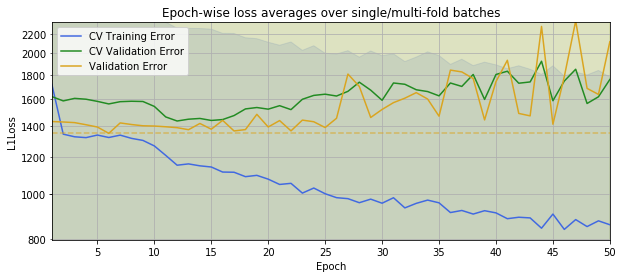

Test MAE: 1743.836701158011

/home/nevavuor/crop-field-cnn/models/depth/20190113_114824969_Adadelta_1x32x32_10cnn_2fc.pkl
Best Validation Loss: 1444.76


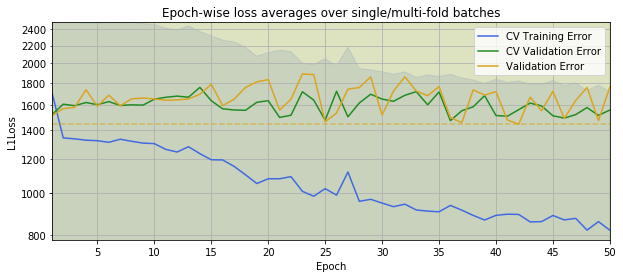

Test MAE: 2002.0619342412974

/home/nevavuor/crop-field-cnn/models/depth/20190113_115617649_Adadelta_1x32x32_12cnn_2fc.pkl
Best Validation Loss: 1295.51


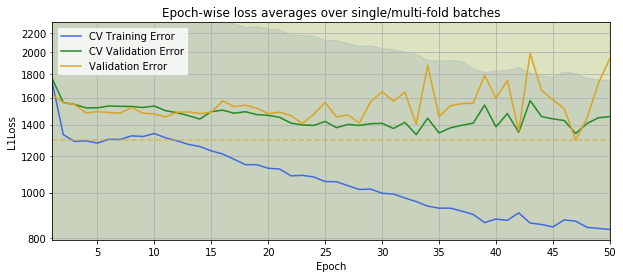

Test MAE: 1467.2196981160594

/home/nevavuor/crop-field-cnn/models/depth/20190113_120438904_Adadelta_1x64x64_4cnn_2fc.pkl
Best Validation Loss: 1299.10


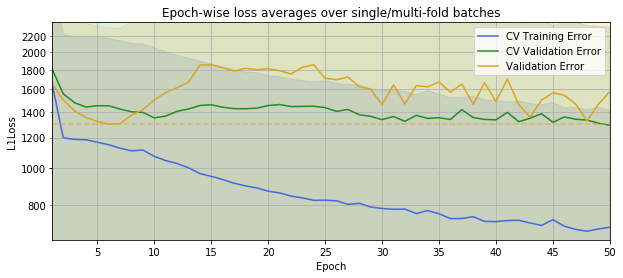

Test MAE: 1198.251065887367

/home/nevavuor/crop-field-cnn/models/depth/20190113_121329204_Adadelta_1x64x64_6cnn_2fc.pkl
Best Validation Loss: 1210.65


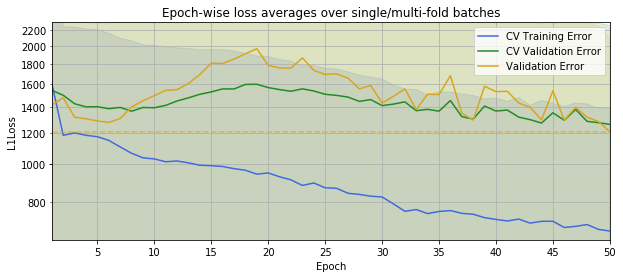

Test MAE: 1410.6110870109117

/home/nevavuor/crop-field-cnn/models/depth/20190113_122242920_Adadelta_1x64x64_8cnn_2fc.pkl
Best Validation Loss: 1252.28


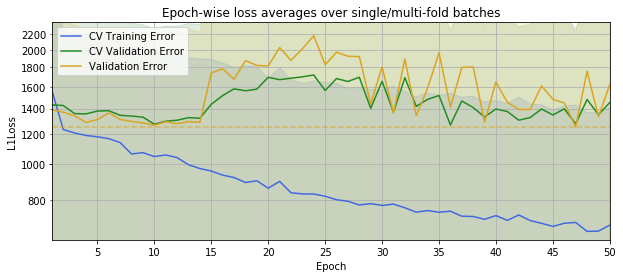

Test MAE: 1327.1304869428482

/home/nevavuor/crop-field-cnn/models/depth/20190113_123225412_Adadelta_1x64x64_10cnn_2fc.pkl
Best Validation Loss: 1116.50


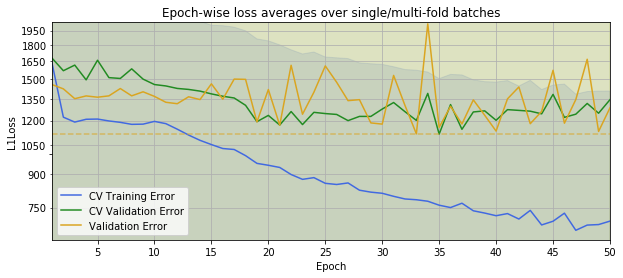

Test MAE: 1238.8117756488894

/home/nevavuor/crop-field-cnn/models/depth/20190113_124235981_Adadelta_1x64x64_12cnn_2fc.pkl
Best Validation Loss: 1294.30


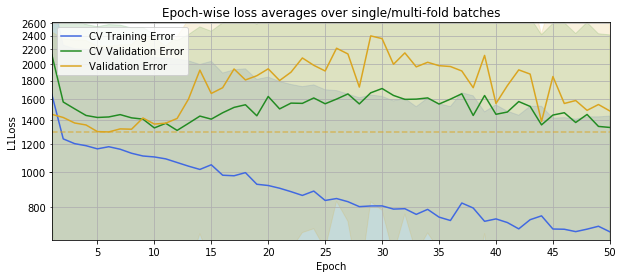

Test MAE: 1507.2479702027376

/home/nevavuor/crop-field-cnn/models/depth/20190113_125318783_Adadelta_1x128x128_4cnn_2fc.pkl
Best Validation Loss: 707.44


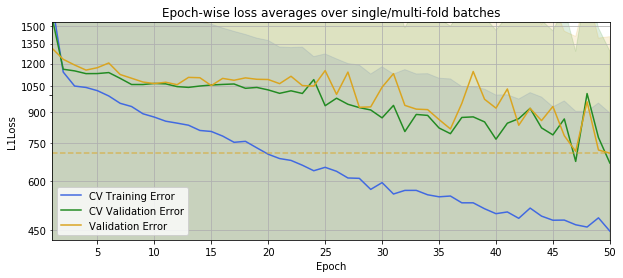

Test MAE: 1049.7497144911024

/home/nevavuor/crop-field-cnn/models/depth/20190113_131003069_Adadelta_1x128x128_6cnn_2fc.pkl
Best Validation Loss: 707.25


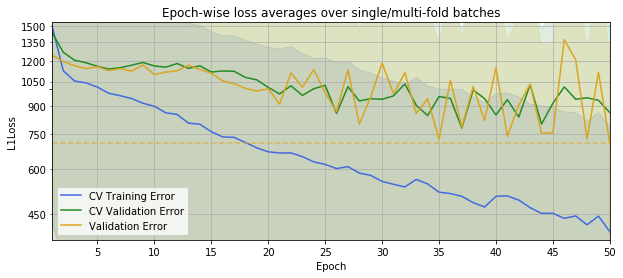

Test MAE: 1218.6181816948786

/home/nevavuor/crop-field-cnn/models/depth/20190113_132707944_Adadelta_1x128x128_8cnn_2fc.pkl
Best Validation Loss: 894.98


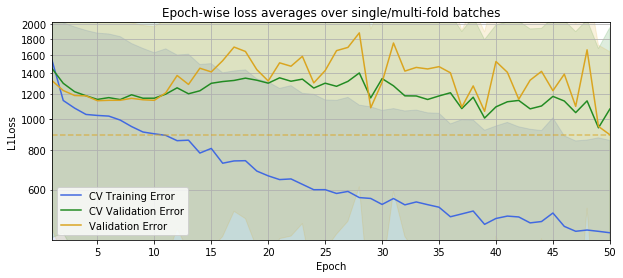

Test MAE: 1560.8746731228298

/home/nevavuor/crop-field-cnn/models/depth/20190113_134440630_Adadelta_1x128x128_10cnn_2fc.pkl
Best Validation Loss: 1128.70


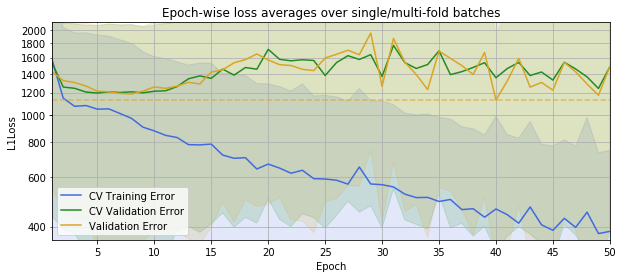

Test MAE: 1346.7487352159287

/home/nevavuor/crop-field-cnn/models/depth/20190113_140241440_Adadelta_1x128x128_12cnn_2fc.pkl
Best Validation Loss: 1199.82


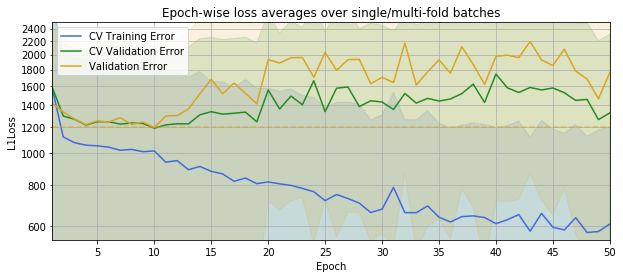

Test MAE: 1618.0862664116753



In [15]:
depth_ndvi_later = test_depth(dp.DroneNDVILater, 1)
depth_ndvi_later.to_csv(os.path.join(results_dir,'depth_ndvi_later.csv'))

In [16]:
print("NDVI Later")
depth_ndvi_later

NDVI Later


32                                      64                           \
           4       6       8       10      12      4       6       8       10   
test  1344.56 6373.62 1743.84 2002.06 1467.22 1198.25 1410.61 1327.13 1238.81   
train  814.54 6415.41  839.93  819.82  833.35  685.28  676.56  662.75  663.57   

                  128                                  
           12      4       6       8       10      12  
test  1507.25 1049.75 1218.62 1560.87 1346.75 1618.09  
train  682.07  446.59  401.80  438.26  377.53  573.73

#### 2.1.3 RGB Earlier Dataset

/home/nevavuor/crop-field-cnn/models/depth/20190113_142115944_Adadelta_3x32x32_4cnn_2fc.pkl
Best Validation Loss: 1124.57


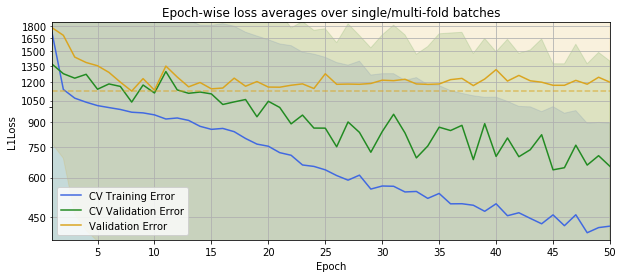

Test MAE: 963.9631656944913

/home/nevavuor/crop-field-cnn/models/depth/20190113_142813387_Adadelta_3x32x32_6cnn_2fc.pkl
Best Validation Loss: 1045.52


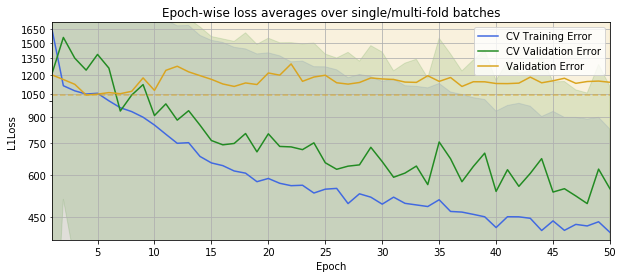

Test MAE: 873.5569551781502

/home/nevavuor/crop-field-cnn/models/depth/20190113_143538571_Adadelta_3x32x32_8cnn_2fc.pkl
Best Validation Loss: 1071.75


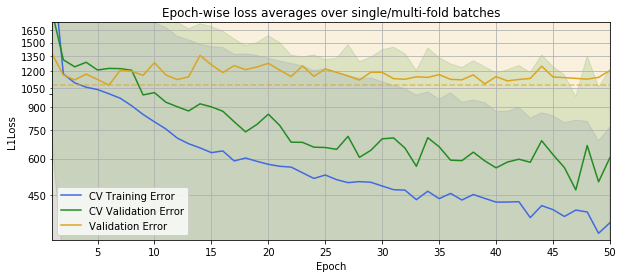

Test MAE: 929.3906401354026

/home/nevavuor/crop-field-cnn/models/depth/20190113_144333957_Adadelta_3x32x32_10cnn_2fc.pkl
Best Validation Loss: 1066.05


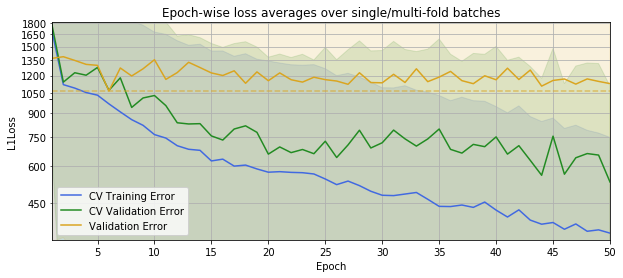

Test MAE: 767.7872508581115

/home/nevavuor/crop-field-cnn/models/depth/20190113_145158234_Adadelta_3x32x32_12cnn_2fc.pkl
Best Validation Loss: 1085.57


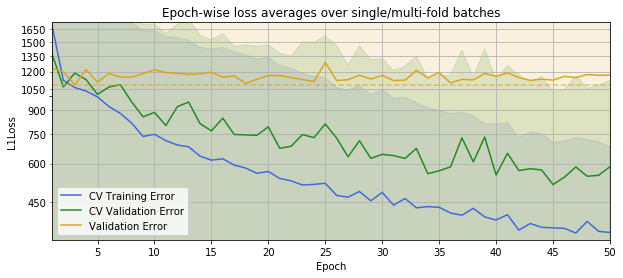

Test MAE: 819.6007984911978

/home/nevavuor/crop-field-cnn/models/depth/20190113_150051944_Adadelta_3x64x64_4cnn_2fc.pkl
Best Validation Loss: 752.84


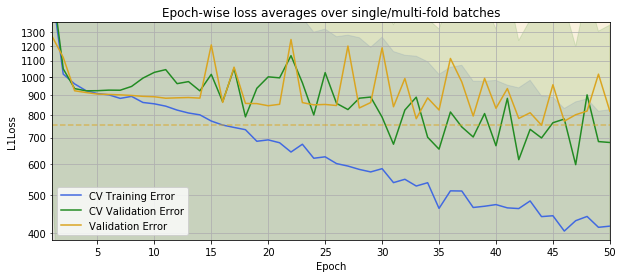

Test MAE: 899.1942519612518

/home/nevavuor/crop-field-cnn/models/depth/20190113_151101222_Adadelta_3x64x64_6cnn_2fc.pkl
Best Validation Loss: 775.31


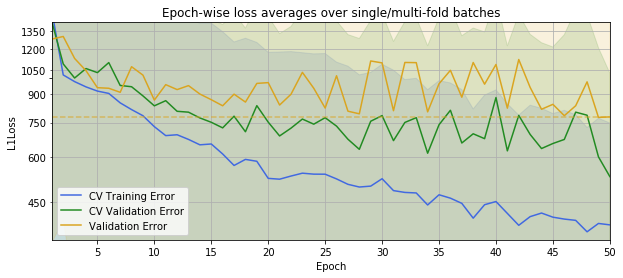

Test MAE: 1013.2866678224688

/home/nevavuor/crop-field-cnn/models/depth/20190113_152134727_Adadelta_3x64x64_8cnn_2fc.pkl
Best Validation Loss: 809.47


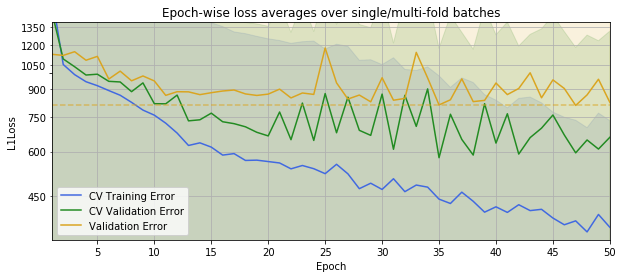

Test MAE: 979.8978930088418

/home/nevavuor/crop-field-cnn/models/depth/20190113_153233974_Adadelta_3x64x64_10cnn_2fc.pkl
Best Validation Loss: 854.27


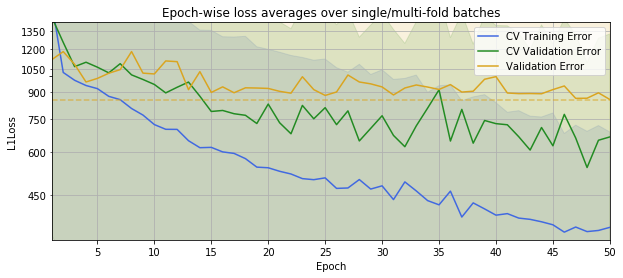

Test MAE: 821.7545888956311

/home/nevavuor/crop-field-cnn/models/depth/20190113_154401518_Adadelta_3x64x64_12cnn_2fc.pkl
Best Validation Loss: 788.96


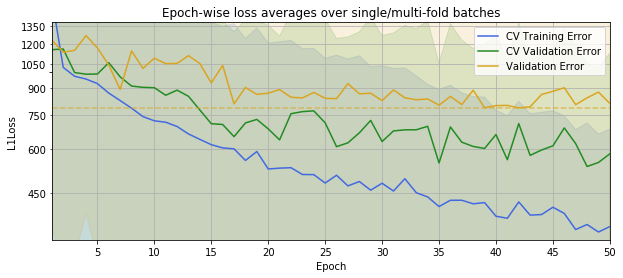

Test MAE: 907.9829677206137

/home/nevavuor/crop-field-cnn/models/depth/20190113_155600902_Adadelta_3x128x128_4cnn_2fc.pkl
Best Validation Loss: 511.25


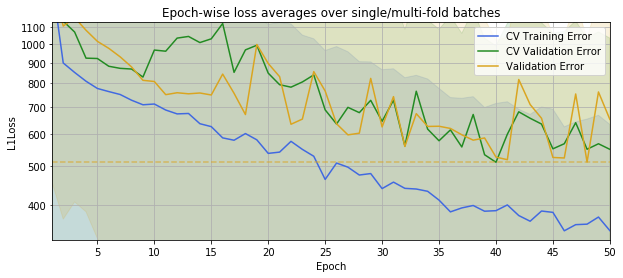

Test MAE: 628.5930278472694

/home/nevavuor/crop-field-cnn/models/depth/20190113_161853644_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 425.03


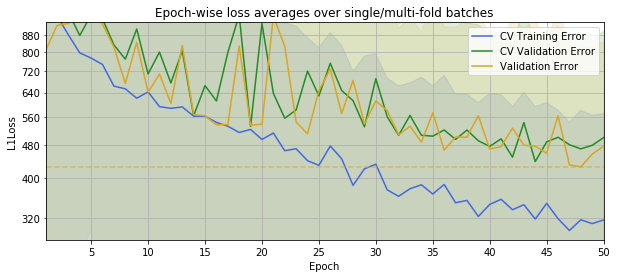

Test MAE: 510.7551382160575

/home/nevavuor/crop-field-cnn/models/depth/20190113_164159038_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 455.16


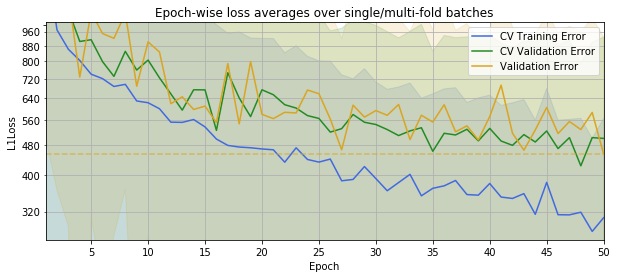

Test MAE: 637.4483942370887

/home/nevavuor/crop-field-cnn/models/depth/20190113_170530380_Adadelta_3x128x128_10cnn_2fc.pkl
Best Validation Loss: 535.22


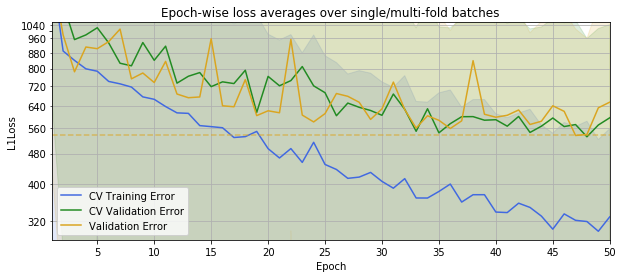

Test MAE: 688.0040404114018

/home/nevavuor/crop-field-cnn/models/depth/20190113_172930452_Adadelta_3x128x128_12cnn_2fc.pkl
Best Validation Loss: 554.21


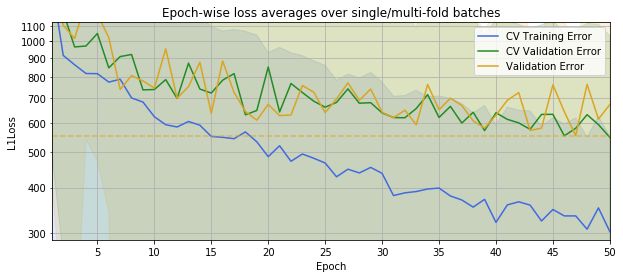

Test MAE: 980.3242899714849



In [17]:
depth_rgb_earlier = test_depth(dp.DroneRGBEarlier, 3)
depth_rgb_earlier.to_csv(os.path.join(results_dir,'depth_rgb_earlier.csv'))

In [18]:
print("RGB Earlier")
depth_rgb_earlier

RGB Earlier


32                                 64                                \
          4      6      8      10     12     4       6      8      10     12   
test  963.96 873.56 929.39 767.79 819.60 899.19 1013.29 979.90 821.75 907.98   
train 402.18 403.89 332.51 357.61 355.85 404.68  372.28 355.85 351.52 348.23   

         128                              
          4      6      8      10     12  
test  628.59 510.76 637.45 688.00 980.32  
train 345.63 299.49 283.61 301.03 303.47

#### 2.1.4 RGB Later Dataset

/home/nevavuor/crop-field-cnn/models/depth/20190113_175403477_Adadelta_3x32x32_4cnn_2fc.pkl
Best Validation Loss: 1075.27


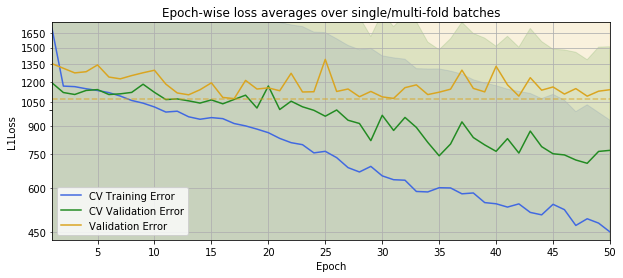

Test MAE: 1267.93555928893

/home/nevavuor/crop-field-cnn/models/depth/20190113_180038122_Adadelta_3x32x32_6cnn_2fc.pkl
Best Validation Loss: 1158.95


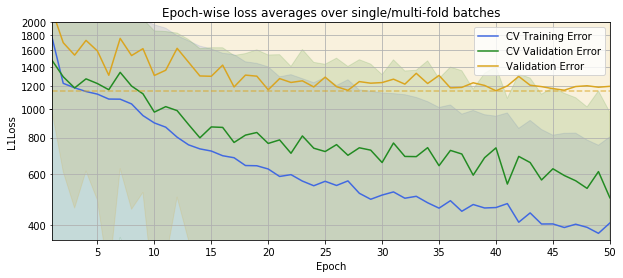

Test MAE: 910.958099224167

/home/nevavuor/crop-field-cnn/models/depth/20190113_180742681_Adadelta_3x32x32_8cnn_2fc.pkl
Best Validation Loss: 1101.27


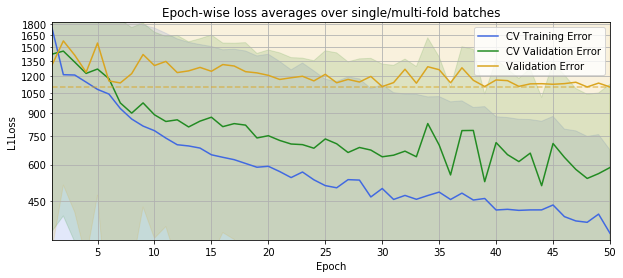

Test MAE: 922.4680303682347

/home/nevavuor/crop-field-cnn/models/depth/20190113_181508659_Adadelta_3x32x32_10cnn_2fc.pkl
Best Validation Loss: 1155.34


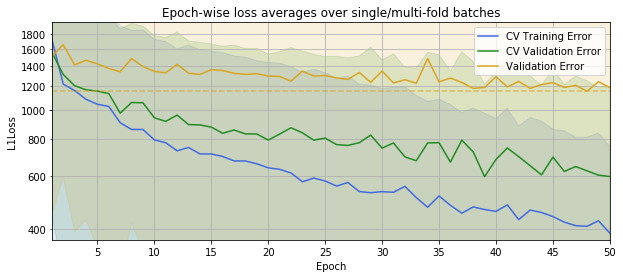

Test MAE: 934.3284744709408

/home/nevavuor/crop-field-cnn/models/depth/20190113_182259611_Adadelta_3x32x32_12cnn_2fc.pkl
Best Validation Loss: 1108.16


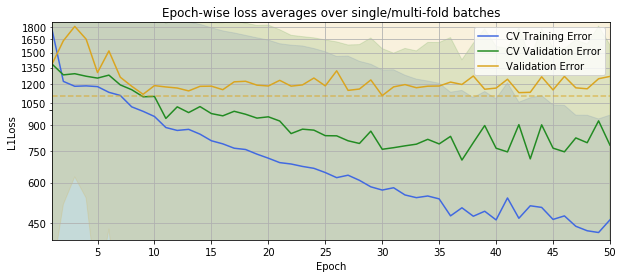

Test MAE: 1150.9113476111083

/home/nevavuor/crop-field-cnn/models/depth/20190113_183117148_Adadelta_3x64x64_4cnn_2fc.pkl
Best Validation Loss: 636.99


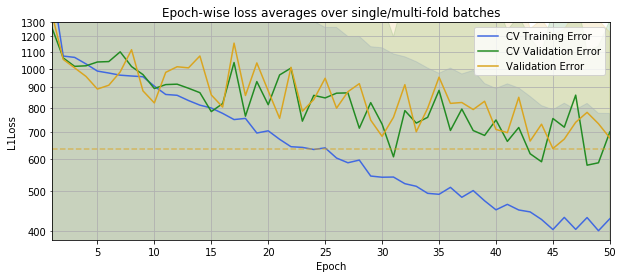

Test MAE: 1272.1277091543677

/home/nevavuor/crop-field-cnn/models/depth/20190113_184051240_Adadelta_3x64x64_6cnn_2fc.pkl
Best Validation Loss: 734.86


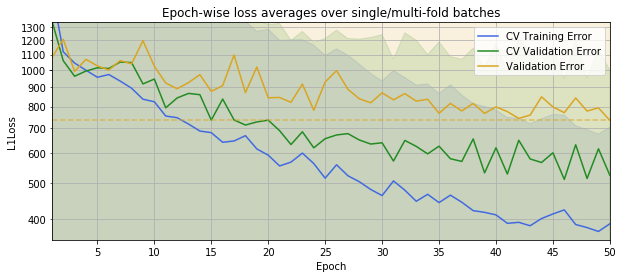

Test MAE: 1339.1444993881391

/home/nevavuor/crop-field-cnn/models/depth/20190113_185050117_Adadelta_3x64x64_8cnn_2fc.pkl
Best Validation Loss: 755.23


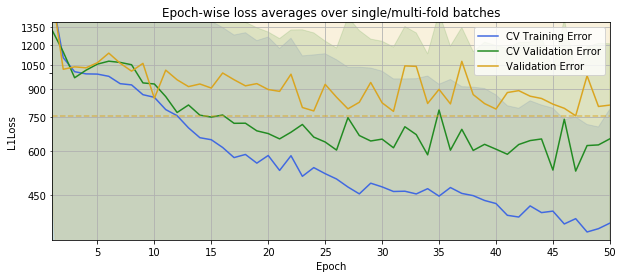

Test MAE: 1249.0056516715142

/home/nevavuor/crop-field-cnn/models/depth/20190113_190114054_Adadelta_3x64x64_10cnn_2fc.pkl
Best Validation Loss: 781.89


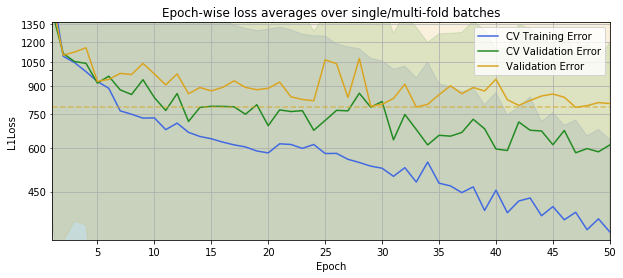

Test MAE: 1199.7678443637476

/home/nevavuor/crop-field-cnn/models/depth/20190113_191202514_Adadelta_3x64x64_12cnn_2fc.pkl
Best Validation Loss: 853.14


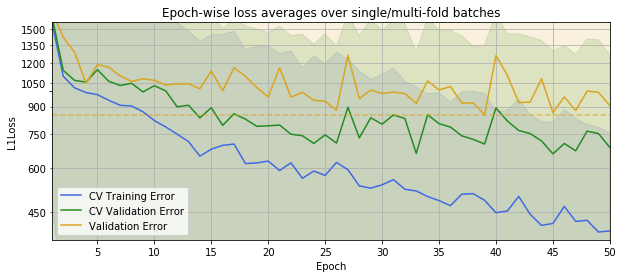

Test MAE: 1515.0763120813385

/home/nevavuor/crop-field-cnn/models/depth/20190113_192317441_Adadelta_3x128x128_4cnn_2fc.pkl
Best Validation Loss: 412.00


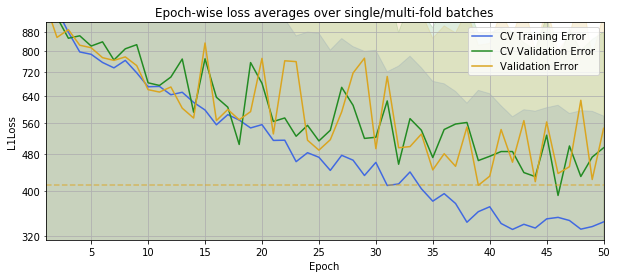

Test MAE: 813.1338080469965

/home/nevavuor/crop-field-cnn/models/depth/20190113_194434920_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 354.35


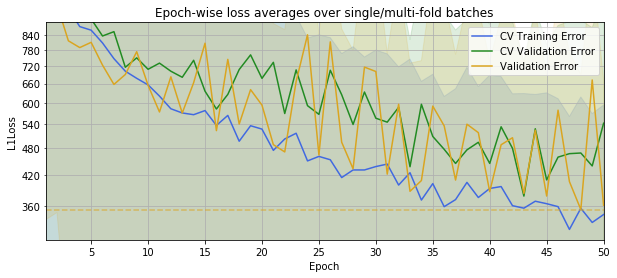

Test MAE: 1132.7339440519295

/home/nevavuor/crop-field-cnn/models/depth/20190113_200604956_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 493.48


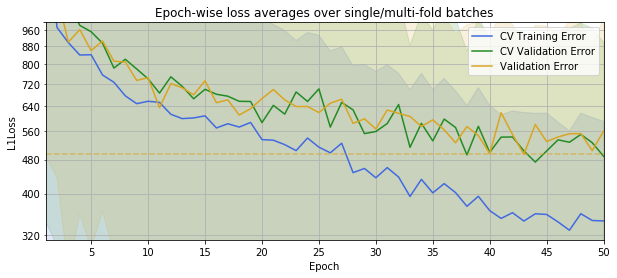

Test MAE: 856.913552576424

/home/nevavuor/crop-field-cnn/models/depth/20190113_202804431_Adadelta_3x128x128_10cnn_2fc.pkl
Best Validation Loss: 472.34


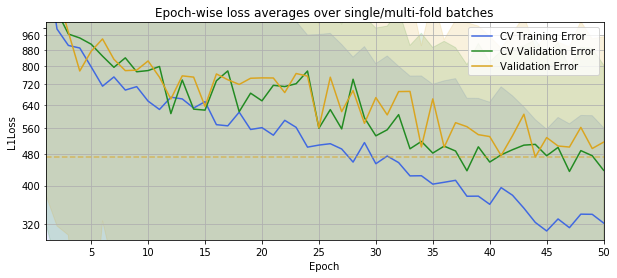

Test MAE: 1037.2203974746064

/home/nevavuor/crop-field-cnn/models/depth/20190113_205023601_Adadelta_3x128x128_12cnn_2fc.pkl
Best Validation Loss: 471.46


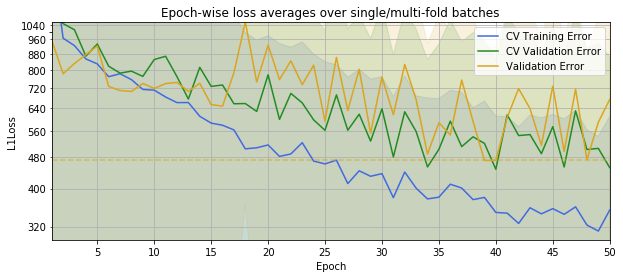

Test MAE: 728.2195477285429



In [19]:
depth_rgb_later = test_depth(dp.DroneRGBLater, 3)
depth_rgb_later.to_csv(os.path.join(results_dir,'depth_rgb_later.csv'))

In [20]:
print("RGB Later")
depth_rgb_later

RGB Later


32                                   64                           \
           4      6      8      10      12      4       6       8       10   
test  1267.94 910.96 922.47 934.33 1150.91 1272.13 1339.14 1249.01 1199.77   
train  450.91 374.44 351.03 387.61  422.19  400.39  371.70  352.70  344.98   

                 128                                
           12     4       6      8       10     12  
test  1515.08 813.13 1132.73 856.91 1037.22 728.22  
train  393.91 331.17  321.17 328.92  307.46 311.78

### 2.2 Re-training poorly initialized models

/home/nevavuor/crop-field-cnn/models/depth/20190113_211507268_Adadelta_1x32x32_6cnn_2fc.pkl
Best Validation Loss: 1401.51


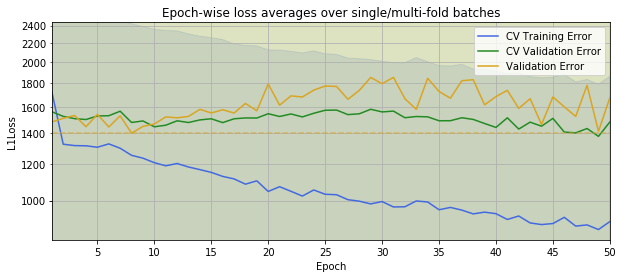

Test MAE: 1595.9580003310439



In [26]:
depth_ndvi_later_single = test_depth_single(dp.DroneNDVILater, 1, db_32, 6, 32)
depth_ndvi_later.loc[:,('32','6')] = depth_ndvi_later_single.loc[:,(32,6)]
depth_ndvi_later.to_csv(os.path.join(results_dir,'depth_ndvi_later.csv'))

In [22]:
#depth_rgb_later_single = test_depth_single(dp.DroneRGBLater, 3, db_32, 8, 32)
#depth_rgb_later.loc[:,('32','8')] =  depth_rgb_later_single.loc[:,(32,8)]
#depth_rgb_later.to_csv(os.path.join(results_dir,'depth_rgb_later.csv'))

### 2.3 Conclusion for the Depth

With so many numbers it is actually starting to get a bit hard to grasp the progression. We therefore take these numbers and plot them  out. The error values for the unfitted will be handled as `NaN`s to ensure proper scaling of the plots. The plotted areas use the training error as the upper bound and the test error as the lower bound.

In [27]:
import pandas as pd
import numpy as np
import os

depth_ndvi_earlier=pd.read_csv(os.path.join(results_dir,'depth_ndvi_earlier.csv'),index_col=0,header=[0,1])
depth_ndvi_later=pd.read_csv(os.path.join(results_dir,'depth_ndvi_later.csv'),index_col=0,header=[0,1])
depth_rgb_earlier=pd.read_csv(os.path.join(results_dir,'depth_rgb_earlier.csv'),index_col=0,header=[0,1])
depth_rgb_later=pd.read_csv(os.path.join(results_dir,'depth_rgb_later.csv'),index_col=0,header=[0,1])

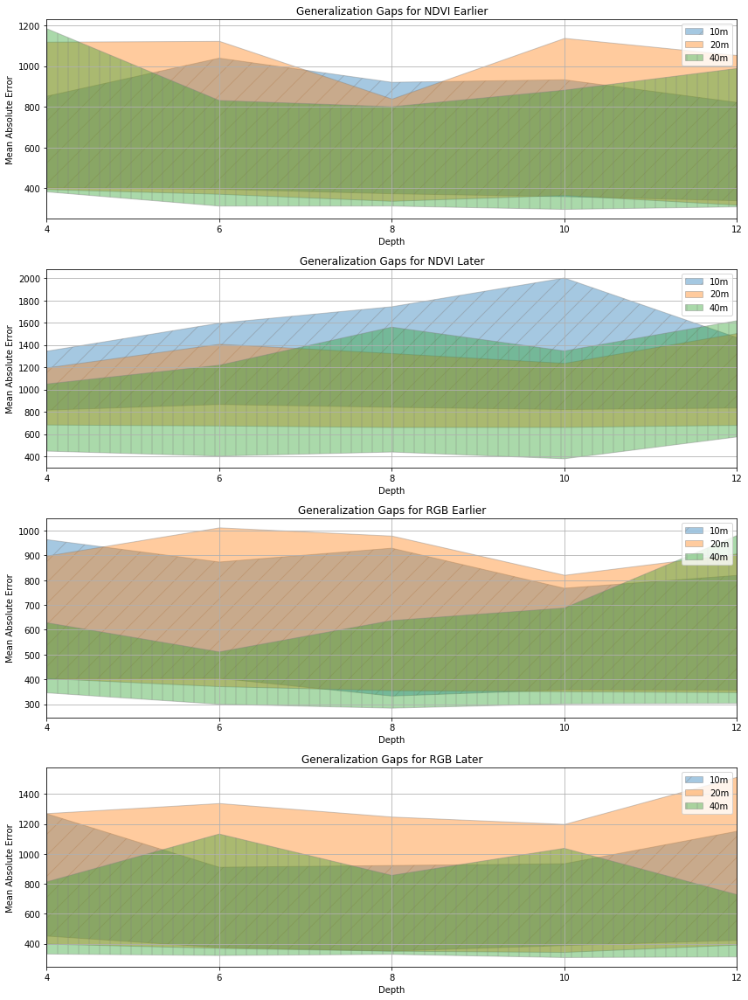

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os 

plt.rcParams['figure.figsize'] = 12, 16
hatches = ['/', None, '|']
x = list(range(4, 14, 2))
result_sets = [depth_ndvi_earlier, depth_ndvi_later, depth_rgb_earlier ,depth_rgb_later]
result_set_names = ['NDVI Earlier','NDVI Later','RGB Earlier','RGB Later']
for i, label in enumerate(['10m', '20m', '40m']):
    window_px = str(32*2**i)
    for j, result_set in enumerate(result_sets):
        plt.subplot(411+j)
        plt.fill_between(
            x, 
            list(result_set.loc['train',window_px].values), 
            list(result_set.loc['test',window_px].values),
            label=label, 
            hatch=hatches[i], 
            edgecolor='gray', 
            alpha=0.4)
        plt.xticks(x)
        plt.xlim([4, 12])
        plt.legend()
        plt.grid()
        plt.xlabel("Depth")
        plt.ylabel("Mean Absolute Error")
        plt.title(f"Generalization Gaps for {result_set_names[j]}")
plt.tight_layout()
plt.savefig(os.path.join(os.getcwd(),'results','cnn-depth.png'),
            dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

The optimal result is achieved with **depth of 6 layers and the 128px/40m image dataset**. The test losses are however notably lower for the RGB images than for the NDVI images.

## 3. Initializing Baseline Networks

Before we delve deeper in to comparing the performance metrics with varying hyperparametervalues, we will initialize a network with no further training. This is to ensure that all the runs are performed with equally initialized model and.

In [8]:
import os
import shutil

import numpy as np
import pandas as pd
import torch
from torch import optim

from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']
EPOCHS = 50

def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."
    cnn.model_path = os.path.join(model_settings.MODELS_DIR,cnn.model_filename)
    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "initial_model_{}.{}".format(
        DATASET_NAMES[is_later], suffix)
    if save:
        cnn.save_model()
        from_path = cnn.model_path
        to_path = os.path.join(model_folder, model_name)
    else:
        from_path = os.path.join(model_folder, model_name)
        to_path = cnn.model_path
    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))

### 3.1 RGB Earlier Dataset

First we train the initial model for earlier dataset.

In [36]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=6,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=False, save=True)

Saving the model to /home/nevavuor/crop-field-cnn/models/20190113_214914685_Adadelta_3x128x128_6cnn_2fc.pkl
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/20190113_214914685_Adadelta_3x128x128_6cnn_2fc.pkl 
	To: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl


### 3.2 RGB Later Dataset

Then we train the later dataset initial model.

In [9]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=8,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=True, save=True)

Saving the model to /home/nevavuor/crop-field-cnn/models/20190118_064300988_Adadelta_3x128x128_8cnn_2fc.pkl
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/20190118_064300988_Adadelta_3x128x128_8cnn_2fc.pkl 
	To: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl


### 3.3 Benchmark Trainings

We will first perform benchmark trainings with no regularization. This is to see where the training would progress. We will then compare the regularized trainings to these to see the level of improvement attained.

#### 3.3.1 RGB Earlier Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/20190113_214922828_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/20190113_214922828_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[   3/  50] (1m 55s) 	Mean Loss:	Train=849.31 +-736.34	Test=744.02 +-704.67
[   6/  50] (3m 22s) 	Mean Loss:	Train=755.87 +-710.21	Test=939.25 +-682.10
[   9/  50] (4m 49s) 	Mean Loss:	Train=634.54 +-644.80	Test=768.54 +-600.31
[  12/  50] (6m 16s) 	Mean Loss:	Train=591.98 +-624.86	Test=623.06 +-554.80
[  15/  50] (7m 43s) 	Mean Loss:	Train=565.67 +-593.96	Test=597.65 +-575.08
[  18/  50] (9m 11s) 	Mean Loss:	Train=515.55 +-541.08	Test=614.97 +-540.04
[  21/  50] (10m 38s) 	Mean Loss:	Train=477.32 +-501.74	Test=599.66 +-510.27
[  24/  50] (12m  5s) 	Mean Loss:	Train=424.68 +-389.06	Test=600.74 +-485.80
[  27/  50] (13m 36s) 	Mean Loss:	Train=475.85 +-448.07	Tes

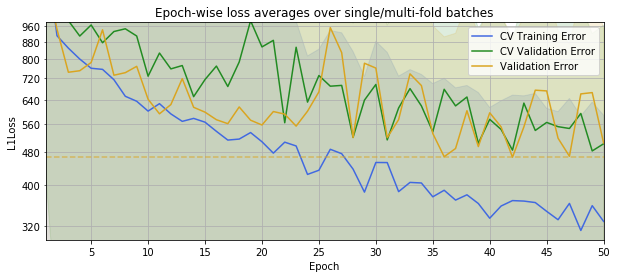

Test MAE: 997.7640690590018


In [38]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=6,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=False, save=False)
cnn.load_model()
cnn.train(
    epochs=EPOCHS,
    training_data=dp.DroneRGBEarlier(DB_128),
    k_cv_folds=3)
test_errors = cnn.produce_test_errors(dp.DroneRGBEarlier(DB_128,test=True))
print(f"Test MAE: {test_errors['mean_error']}")    

#### 3.3.2 RGB Later Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/20190118_064304502_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/20190118_064304502_Adadelta_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[   3/  50] (2m  9s) 	Mean Loss:	Train=979.06 +-786.95	Test=942.82 +-661.92
[   6/  50] (3m 51s) 	Mean Loss:	Train=754.92 +-704.78	Test=780.62 +-574.88
[   9/  50] (5m 33s) 	Mean Loss:	Train=684.07 +-644.40	Test=655.17 +-548.24
[  12/  50] (7m 15s) 	Mean Loss:	Train=561.32 +-547.05	Test=603.80 +-506.91
[  15/  50] (8m 57s) 	Mean Loss:	Train=529.95 +-506.60	Test=556.35 +-462.36
[  18/  50] (10m 39s) 	Mean Loss:	Train=476.88 +-438.27	Test=861.61 +-662.68
[  21/  50] (12m 20s) 	Mean Loss:	Train=469.55 +-390.19	Test=538.50 +-468.63
[  24/  50] (14m  2s) 	Mean Loss:	Train=466.72 +-381.28	Test=873.65 +-647.16
[  27/  50] (15m 44s) 	Mean Loss:	Train=404.74 +-319.58	Test

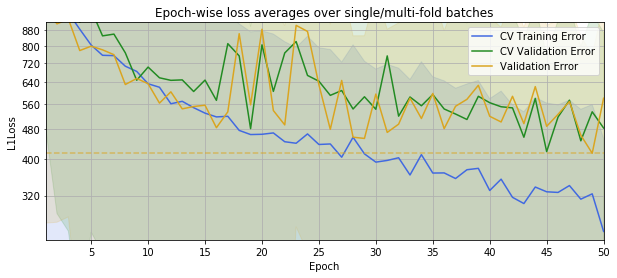

Test MAE: 1021.4852304414123


In [10]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=8,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=True, save=False)
cnn.load_model()
_ = cnn.train(
    epochs=EPOCHS,
    training_data=dp.DroneRGBLater(DB_128),
    k_cv_folds=3)
test_errors = cnn.produce_test_errors(dp.DroneRGBLater(DB_128,test=True))
print(f"Test MAE: {test_errors['mean_error']}")    

## 4. Optimizer Tuning

The last step is to tune the hyperparameters of the optimizer. Adadelta has effectively two parameters that can be tuned. These are the initial learning rate ``lr`` that will be dynamically changed by the optimizer and the coefficient for running average of squared gradients ``rho`` used to determinate the changing of the learning rate. 

In the original Adadelta paper they performed hyperparameter tuning with just 6 epochs on the digit classification task. We will be a bit more generous to our network and use 25 epochs to determine the optimal settings. This means that we wont be utilizing early stopping here, but we will incorporate weight decay.

We will first conduct coarse grid search and random searh after that if necessary. We will use same initialized models as in the regularization testing phase.

In [11]:
import os
import shutil
import numpy as np
import pandas as pd
import seaborn as sns

from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings

%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']
optimized_models_dir = os.path.join(model_settings.MODELS_DIR,'optimization')
os.makedirs(optimized_models_dir,exist_ok=True)

def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."
    cnn.model_path = os.path.join(optimized_models_dir,cnn.model_filename)
    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "initial_model_{}.{}".format(
        DATASET_NAMES[is_later], suffix)
    if save:
        cnn.save_model()
        from_path = cnn.model_path
        to_path = os.path.join(model_settings.MODELS_DIR, model_name)
    else:
        from_path = os.path.join(model_settings.MODELS_DIR, model_name)
        to_path = cnn.model_path
    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))

def test_optimizer(dataset, lrs, rhos):
    is_later = dataset == dp.DroneRGBLater
    best_losses = pd.DataFrame(
        columns=['lr', 'rho', 'loss_mean'])
    for lr in lrs:
        for rho in rhos:
            print("lr={}, rho={}".format(lr, rho))
            cnn = DroneYieldMeanCNN(
                source_bands=3,
                source_dim=128,
                cnn_layers=8 if is_later else 6,
                optimizer=optim.Adadelta,
                optimizer_parameters={
                    'weight_decay': 0,
                    'lr': lr,
                    'rho': rho})
            copy_model(
                cnn=cnn,
                is_later=is_later,
                save=False)
            cnn.load_model()
            cnn.train(
                epochs=50,
                training_data=dataset(DB_128),
                k_cv_folds=3,
                suppress_output=True)
            test_errors = cnn.produce_test_errors(dataset(DB_128,test=True))
            print(f"Test MAE: {test_errors['mean_error']}")  
            print()
            best_losses = best_losses.append(
                {'lr': lr,
                 'rho': rho,
                 'loss_mean': test_errors['mean_error']},
                ignore_index=True)
    return best_losses.sort_values(by='loss_mean').reset_index(drop=True)

# (lr, rho, loss)
best_optimizer_earlier = (None, None, None)
best_optmizer_later = (None, None, None)

### 4.1 Grid Search

For the initial values we will use learning rates of ``1e-4``,``1e-3``,``1e-2``,``1e-1`` and ``1e0``. For the running average coefficient we will use ``0.0``,``0.3``,``0.6`` and ``0.9``. This totals to 20 trainings per dataset.

#### 4.1.1 RGB Earlier Dataset

lr=0.0001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_063220762_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_063220762_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 485.79


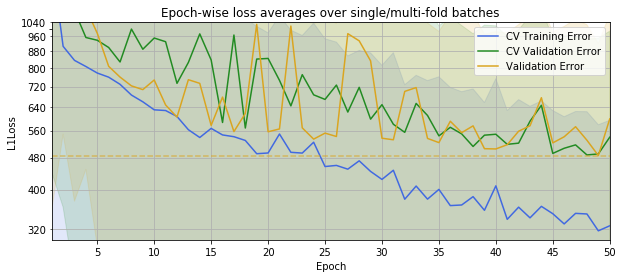

Test MAE: 672.8202376346252

lr=0.0001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_070249386_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_070249386_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 519.40


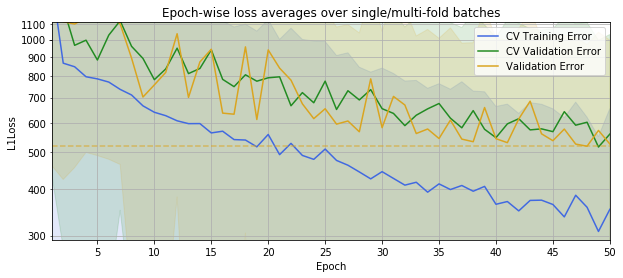

Test MAE: 748.7388526781929

lr=0.0001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_073325365_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_073325365_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 465.97


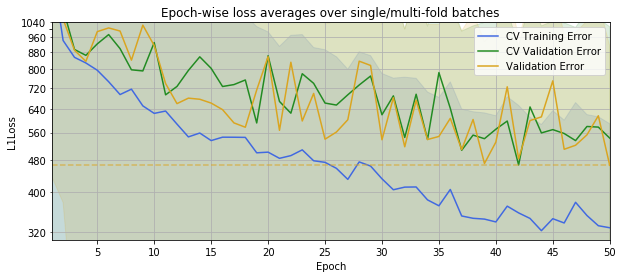

Test MAE: 868.4472931198057

lr=0.0001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_080425756_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_080425756_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 480.84


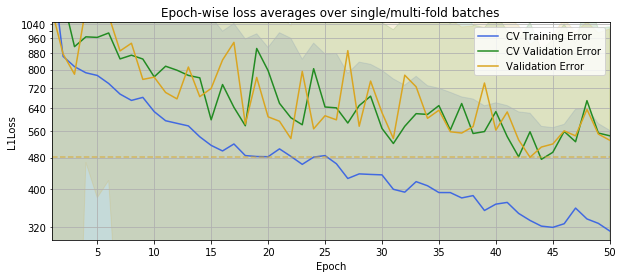

Test MAE: 677.8008094073313

lr=0.001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_083506852_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_083506852_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 475.67


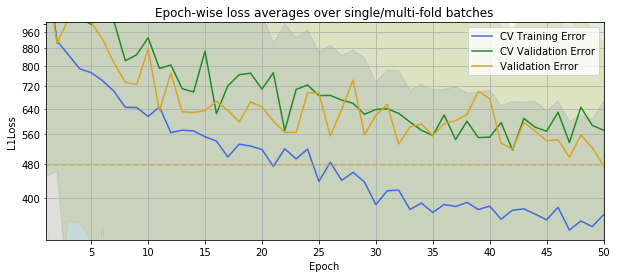

Test MAE: 672.8648034022007

lr=0.001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_090649497_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_090649497_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 491.61


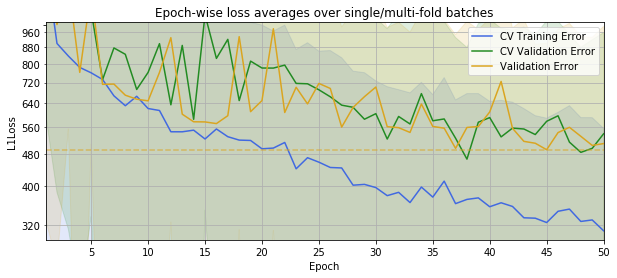

Test MAE: 607.7113413092562

lr=0.001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_093841371_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_093841371_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 448.29


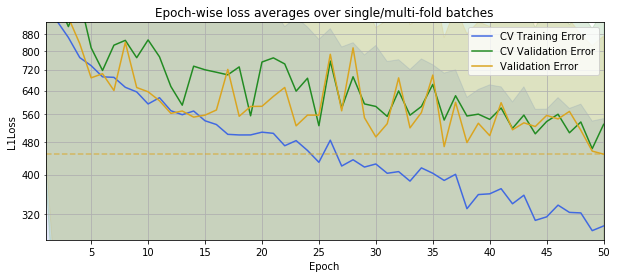

Test MAE: 652.0012558169734

lr=0.001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_101048557_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_101048557_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 439.85


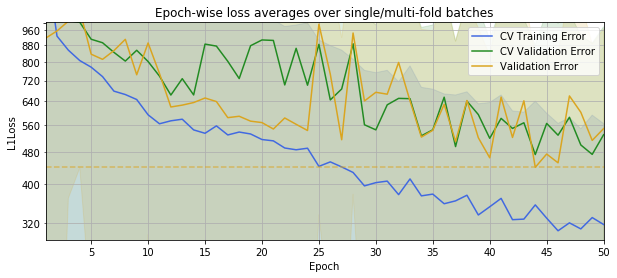

Test MAE: 966.2192743888866

lr=0.01, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_104308416_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_104308416_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 435.23


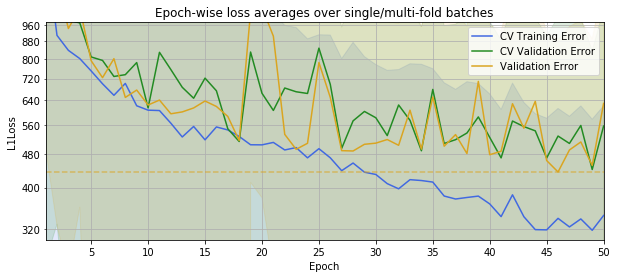

Test MAE: 638.6437862401416

lr=0.01, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_111530402_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_111530402_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 532.16


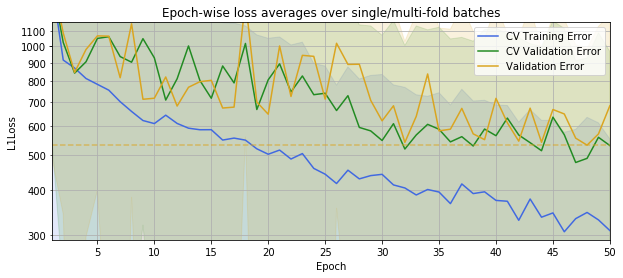

Test MAE: 642.4997697724093

lr=0.01, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_114741645_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_114741645_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 414.04


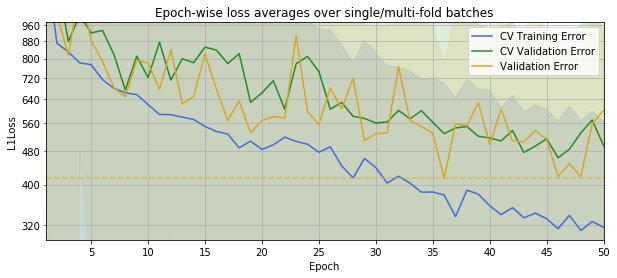

Test MAE: 596.4577378333828

lr=0.01, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_121952309_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_121952309_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 465.47


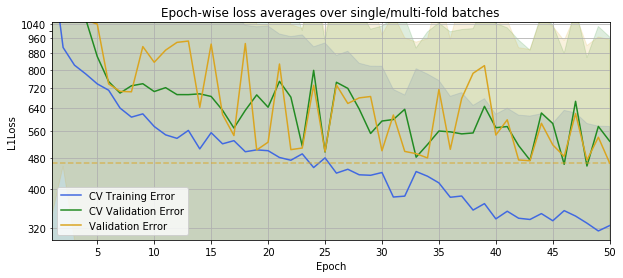

Test MAE: 821.9259438999958

lr=0.1, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_125202003_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_125202003_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 509.35


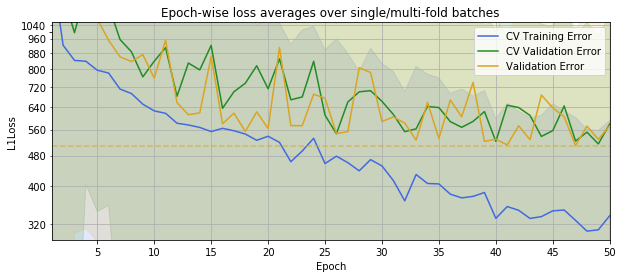

Test MAE: 706.696317551094

lr=0.1, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_132437765_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_132437765_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 480.33


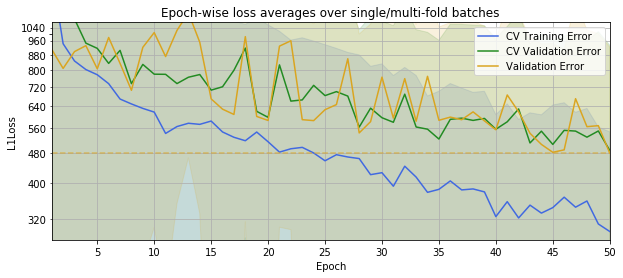

Test MAE: 654.9844164078401

lr=0.1, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_135716314_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_135716314_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 465.41


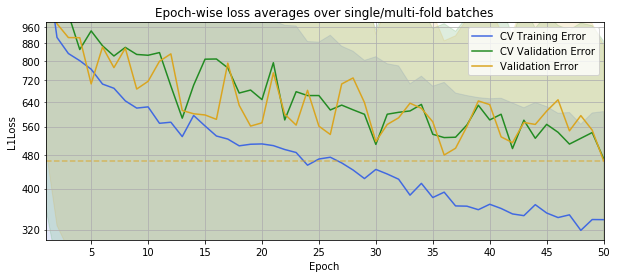

Test MAE: 678.8768494397685

lr=0.1, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_142928818_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_142928818_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 466.65


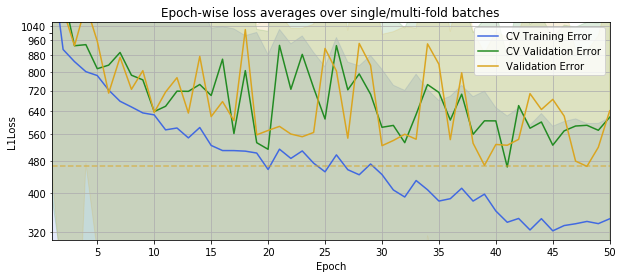

Test MAE: 664.6651944247159

lr=1.0, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_150101739_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_150101739_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 501.31


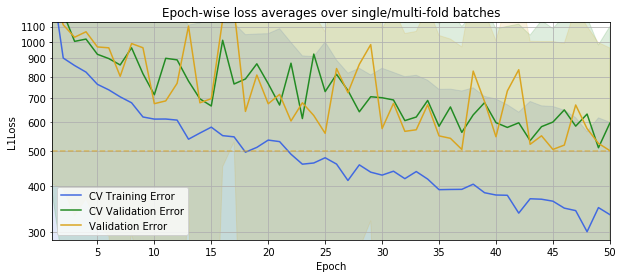

Test MAE: 786.3191739500297

lr=1.0, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_153307834_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_153307834_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 557.92


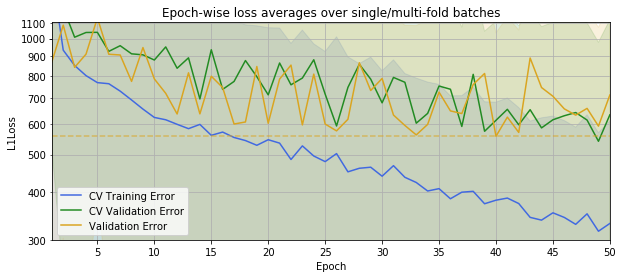

Test MAE: 631.0173094709337

lr=1.0, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_160535842_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_160535842_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 449.98


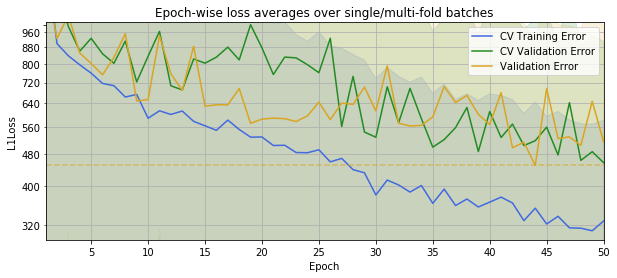

Test MAE: 790.0990737231809

lr=1.0, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190114_163757267_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190114_163757267_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 422.99


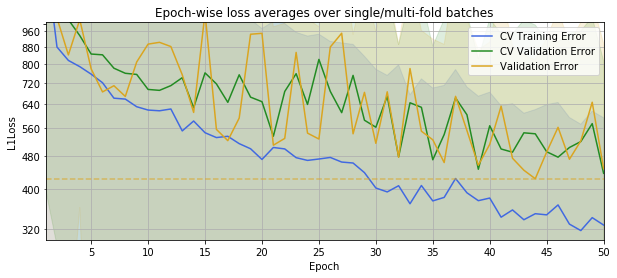

Test MAE: 859.5489410855877



In [2]:
optimizer_earlier = test_optimizer(dp.DroneRGBEarlier, 
                                   [1e-4,1e-3,1e-2,1e-1,1e0], 
                                   [0,0.3,0.6,0.9])

rho,0.0,0.3,0.6,0.9
lr,,,,
0.0001,672.820238,748.738853,868.447293,677.800809
0.0010,672.864803,607.711341,652.001256,966.219274
0.0100,638.643786,642.499770,596.457738,821.925944
0.1000,706.696318,654.984416,678.876849,664.665194
1.0000,786.319174,631.017309,790.099074,859.548941


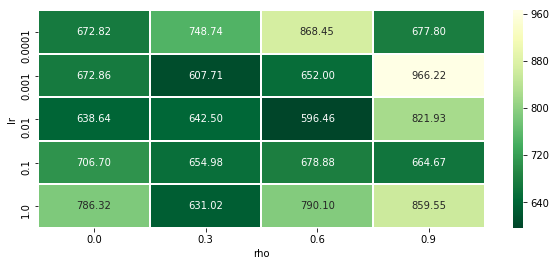

In [4]:
pivot = optimizer_earlier.pivot_table(values='loss_mean',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [5]:
best_row = optimizer_earlier.loc[optimizer_earlier['loss_mean'].idxmin()]
best_optimizer_earlier = (best_row['lr'], best_row['rho'], best_row['loss_mean'])
best_optimizer_earlier

(0.01, 0.6, 596.4577378333828)

In [ ]:
# best_optimizer_earlier = (0.01, 0.6, 596.4577378333828)

#### 4.1.2 RGB Later Dataset

lr=0.0001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_071201374_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_071201374_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 375.65


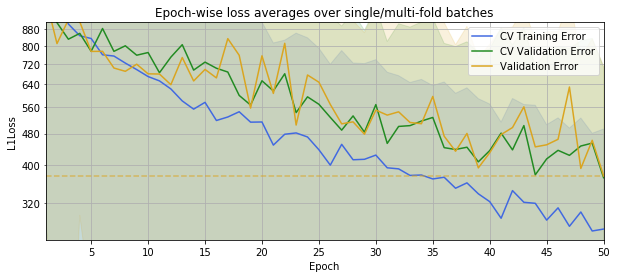

Test MAE: 829.1492397848222

lr=0.0001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_074052595_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_074052595_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 433.43


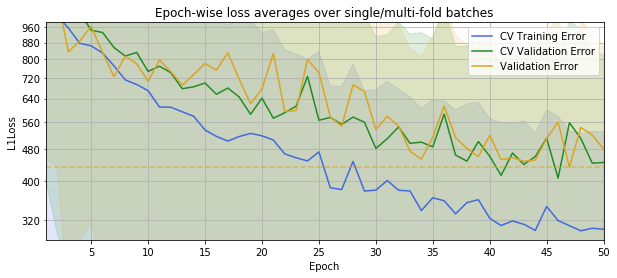

Test MAE: 882.2789251585585

lr=0.0001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_081000589_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_081000589_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 396.46


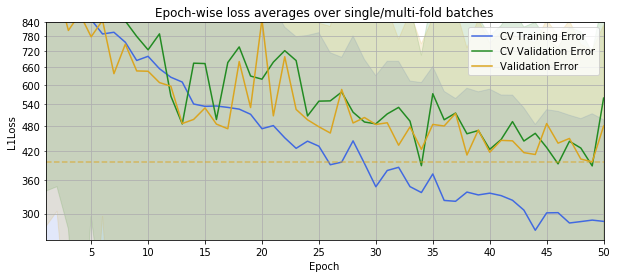

Test MAE: 943.724403203368

lr=0.0001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_083852433_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_083852433_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 474.89


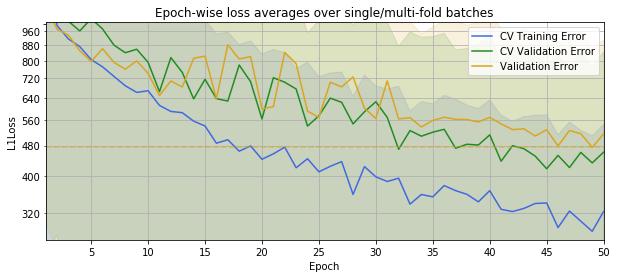

Test MAE: 624.3419062256999

lr=0.001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_090747266_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_090747266_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 495.68


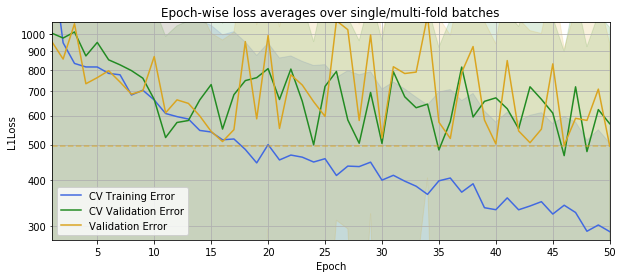

Test MAE: 928.2853814061285

lr=0.001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_093637191_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_093637191_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 413.23


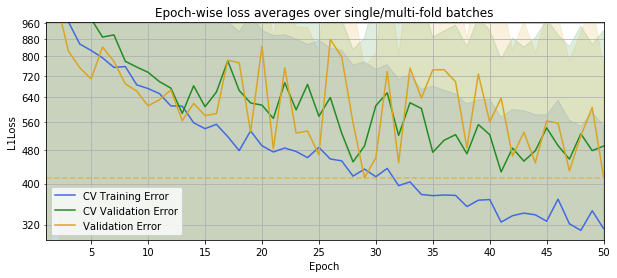

Test MAE: 1076.4011655721472

lr=0.001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_100546761_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_100546761_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 488.04


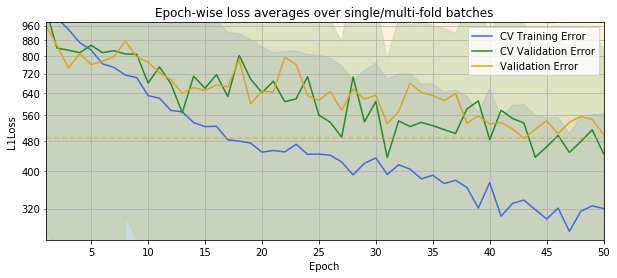

Test MAE: 935.1010928235565

lr=0.001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_103454551_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_103454551_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 487.20


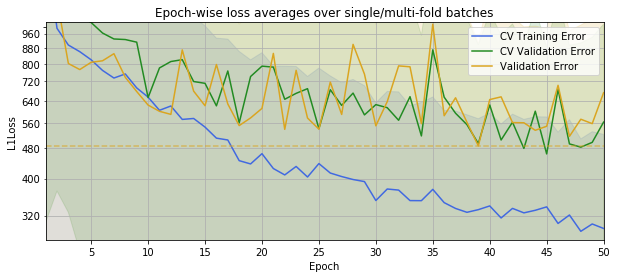

Test MAE: 863.3559847486149

lr=0.01, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_110344514_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_110344514_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 420.45


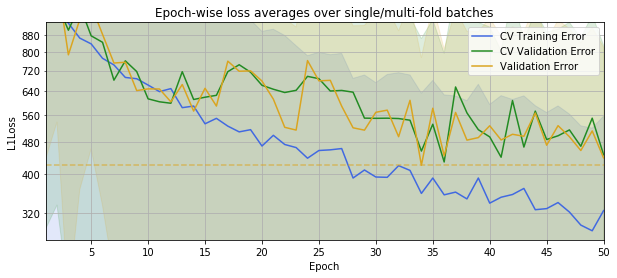

Test MAE: 706.7901366428121

lr=0.01, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_113252372_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_113252372_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 366.58


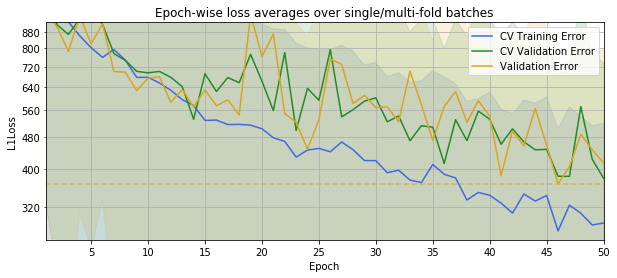

Test MAE: 705.8032017733038

lr=0.01, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_120140104_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_120140104_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 409.92


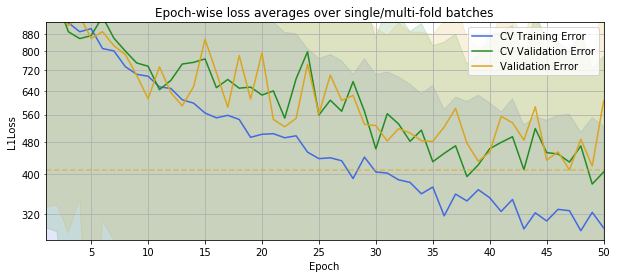

Test MAE: 782.3002356355705

lr=0.01, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_123026132_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_123026132_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 427.62


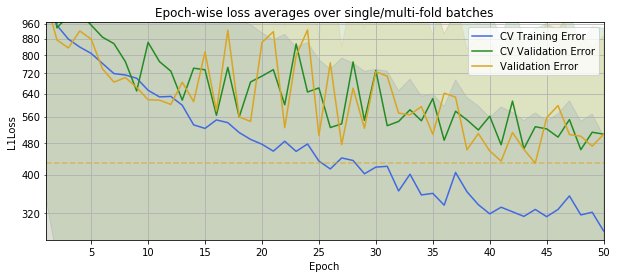

Test MAE: 906.1481907015454

lr=0.1, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_125949541_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_125949541_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 450.41


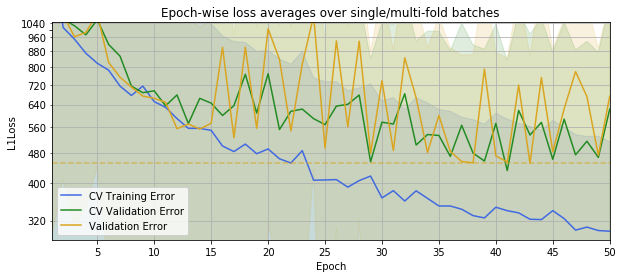

Test MAE: 780.5193972194547

lr=0.1, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_132839068_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_132839068_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 439.20


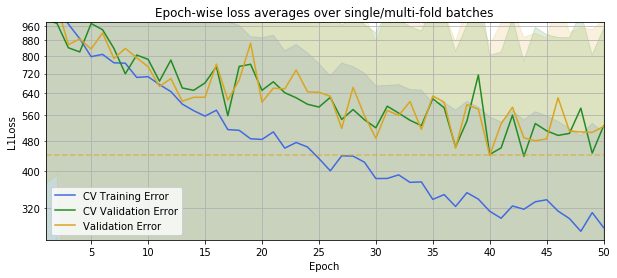

Test MAE: 724.7541769689201

lr=0.1, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_135732898_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_135732898_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 376.50


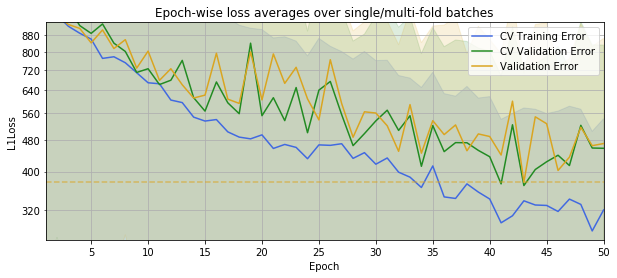

Test MAE: 633.4336639926371

lr=0.1, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_142618653_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_142618653_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 388.77


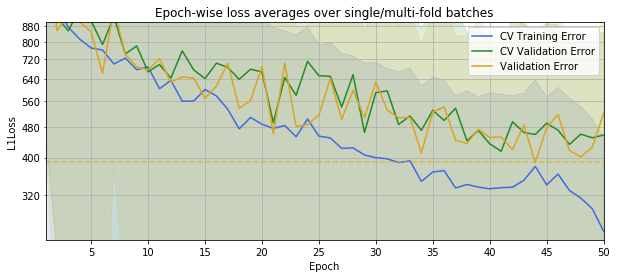

Test MAE: 761.914588370553

lr=1.0, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_145459717_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_145459717_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 394.66


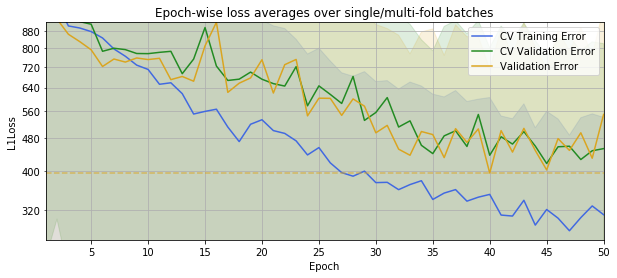

Test MAE: 710.6918341605511

lr=1.0, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_152345800_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_152345800_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 438.57


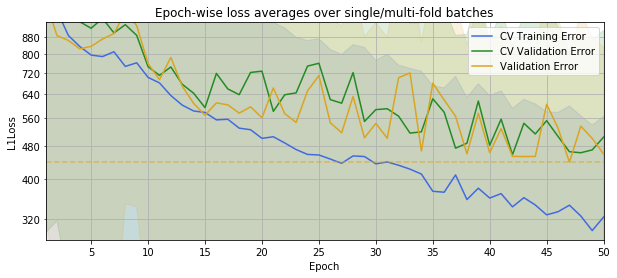

Test MAE: 951.2754023953878

lr=1.0, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_155309375_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_155309375_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 437.86


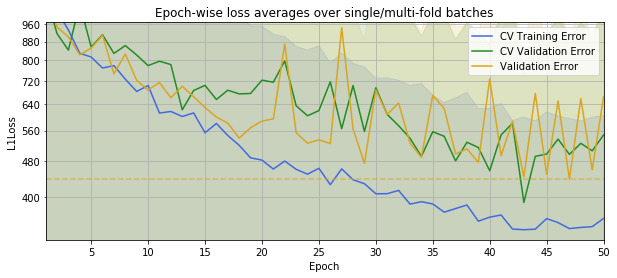

Test MAE: 773.2066215645655

lr=1.0, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_162216512_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_162216512_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 454.52


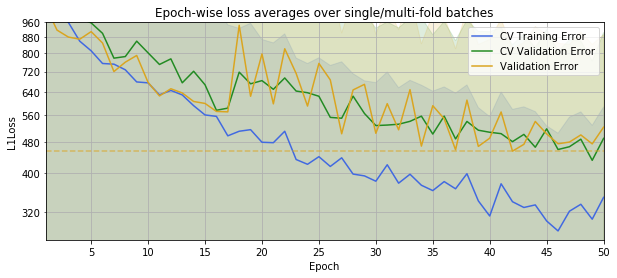

Test MAE: 784.416145858646



In [12]:
optimizer_later = test_optimizer(dp.DroneRGBLater, 
                                   [1e-4,1e-3,1e-2,1e-1,1e0], 
                                   [0,0.3,0.6,0.9])

rho,0.0,0.3,0.6,0.9
lr,,,,
0.0001,829.149240,882.278925,943.724403,624.341906
0.0010,928.285381,1076.401166,935.101093,863.355985
0.0100,706.790137,705.803202,782.300236,906.148191
0.1000,780.519397,724.754177,633.433664,761.914588
1.0000,710.691834,951.275402,773.206622,784.416146


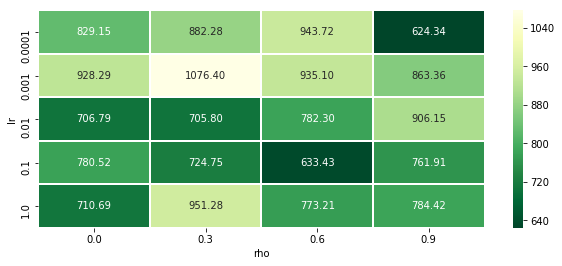

In [13]:
pivot = optimizer_later.pivot_table(values='loss_mean',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [14]:
best_row = optimizer_later.loc[optimizer_later['loss_mean'].idxmin()]
best_optimizer_later = (best_row['lr'], best_row['rho'], best_row['loss_mean'])
best_optimizer_later

(0.0001, 0.9, 624.3419062256999)

In [19]:
# best_optimizer_later = (0.001, 0.0, 640.1019213069839)

#### 4.1.3 Conclusions

From the results it seems that the optimal learning rate is in the ballpark of ``0.01`` for the earlier and ``0.1`` for the later dataset. The coefficient for the squared gradients is however around ``0.3`` for both datasets.

### 4.2 Random Search

Next up the random search with values in the ballpark of the ones concluded in the grid search.

#### 4.2.1 RGB Earlier Dataset

lr=0.013272984704421776, rho=0.5802310128184069
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_030059855_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_030059855_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 453.74


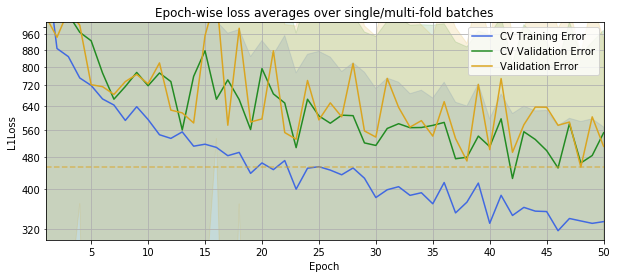

Test MAE: 792.9033948466121

lr=0.013272984704421776, rho=0.6357069016170726
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_033156333_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_033156333_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 480.71


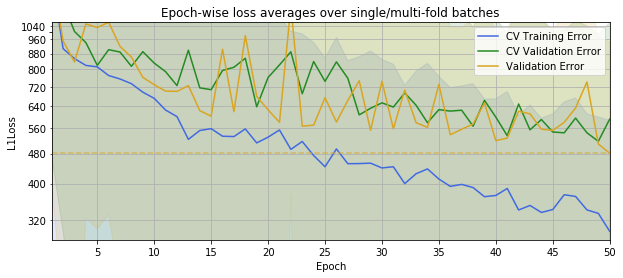

Test MAE: 752.1177950358294

lr=0.013272984704421776, rho=0.6902694843385245
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_040325545_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_040325545_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 473.94


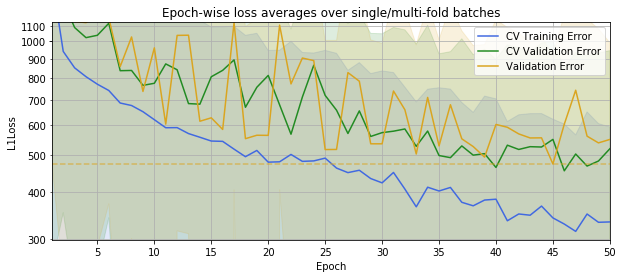

Test MAE: 821.4661956331623

lr=0.013272984704421776, rho=0.6276669104166619
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_043421506_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_043421506_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 597.50


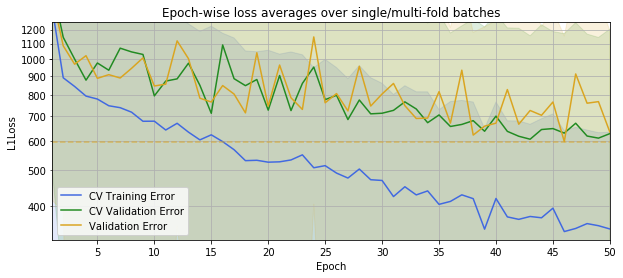

Test MAE: 970.6464350168546

lr=0.010792263520333568, rho=0.5802310128184069
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_050513831_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_050513831_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 459.81


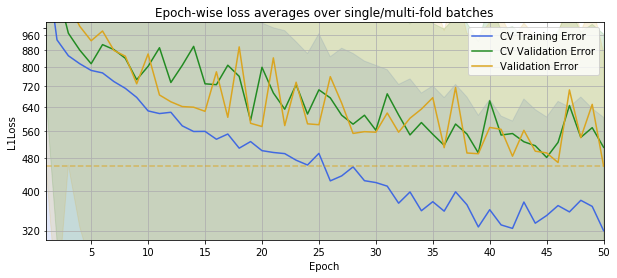

Test MAE: 769.2900851080182

lr=0.010792263520333568, rho=0.6357069016170726
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_053604761_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_053604761_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 454.06


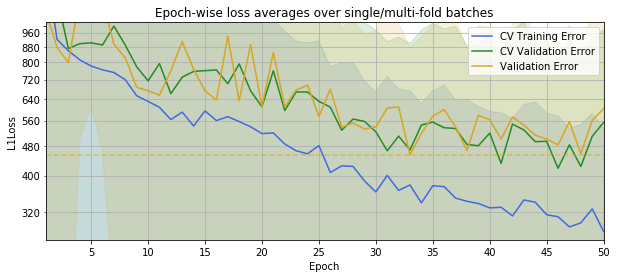

Test MAE: 820.4128649852654

lr=0.010792263520333568, rho=0.6902694843385245
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_060715456_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_060715456_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 438.68


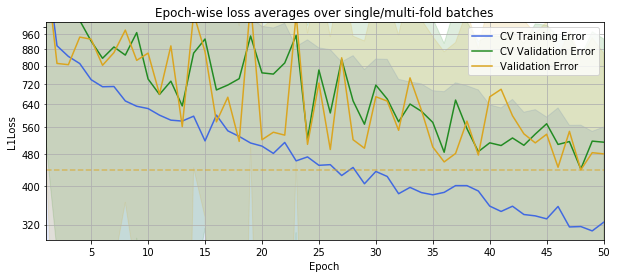

Test MAE: 860.7928597645649

lr=0.010792263520333568, rho=0.6276669104166619
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_063830027_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_063830027_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 492.15


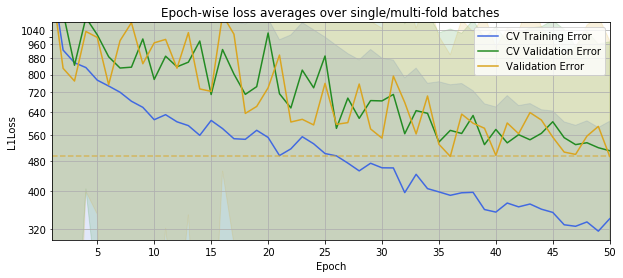

Test MAE: 643.3888451254028

lr=0.007607151199932964, rho=0.5802310128184069
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_070918168_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_070918168_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 466.16


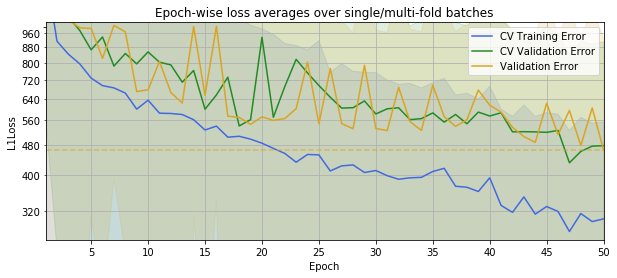

Test MAE: 546.1770678744064

lr=0.007607151199932964, rho=0.6357069016170726
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_074003707_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_074003707_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 548.73


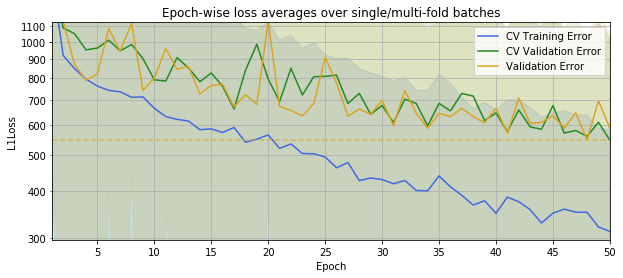

Test MAE: 1004.417018357255

lr=0.007607151199932964, rho=0.6902694843385245
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_081050656_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_081050656_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 517.22


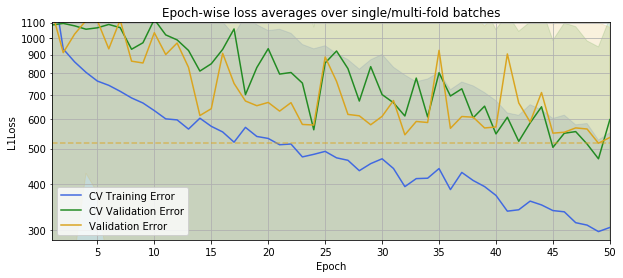

Test MAE: 834.108384193203

lr=0.007607151199932964, rho=0.6276669104166619
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_084135975_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_084135975_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 534.67


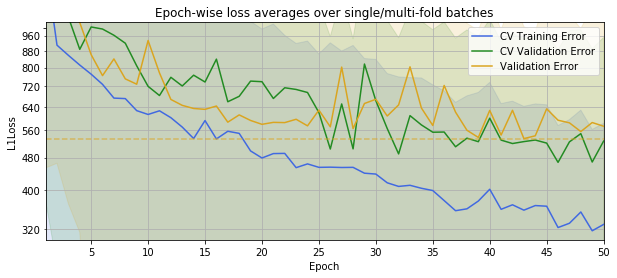

Test MAE: 903.7183057766919

lr=0.007914382996852503, rho=0.5802310128184069
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_091219378_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_091219378_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 433.65


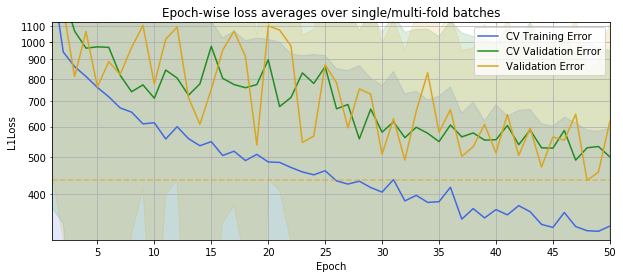

Test MAE: 563.7192200618003

lr=0.007914382996852503, rho=0.6357069016170726
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_094303769_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_094303769_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 456.14


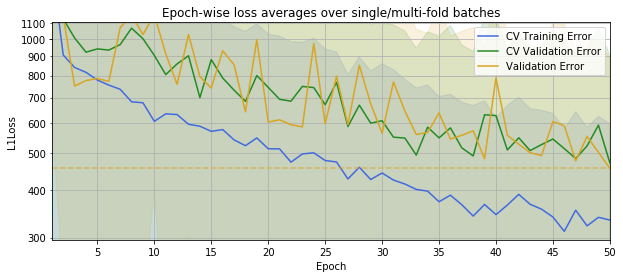

Test MAE: 765.3216319194157

lr=0.007914382996852503, rho=0.6902694843385245
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_101341202_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_101341202_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 505.54


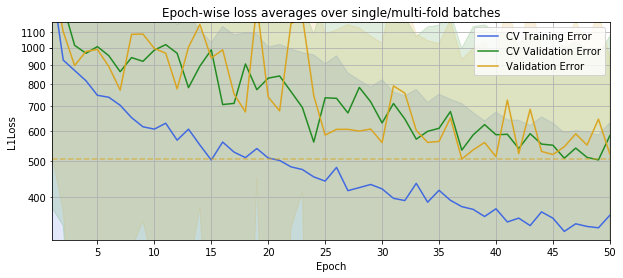

Test MAE: 979.0352718606895

lr=0.007914382996852503, rho=0.6276669104166619
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190115_104451742_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190115_104451742_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 466.59


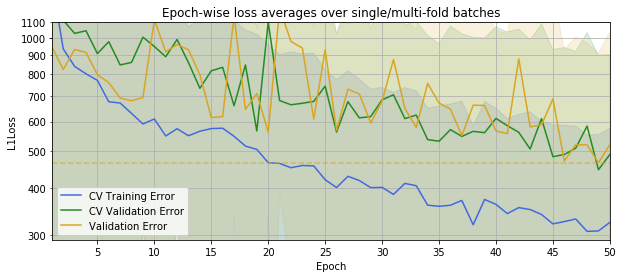

Test MAE: 610.5510989309489



In [9]:
optimizer_earlier = test_optimizer(
    dp.DroneRGBEarlier, 
    np.abs(np.random.normal(loc=best_optimizer_earlier[0],
                            scale=2*best_optimizer_earlier[0]*0.1, 
                            size=4)),
    np.abs(np.random.normal(loc=best_optimizer_earlier[1],
                            scale=2*best_optimizer_earlier[1]*0.1, 
                            size=4)))

rho,0.5802310128184069,0.6276669104166619,0.6357069016170726,0.6902694843385245
lr,,,,
0.007607,546.177068,903.718306,1004.417018,834.108384
0.007914,563.719220,610.551099,765.321632,979.035272
0.010792,769.290085,643.388845,820.412865,860.792860
0.013273,792.903395,970.646435,752.117795,821.466196


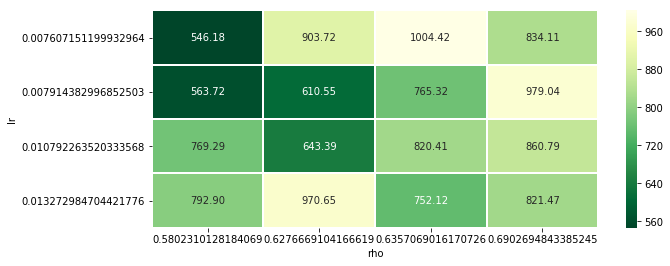

In [10]:
pivot = optimizer_earlier.pivot_table(values='loss_mean',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [11]:
best_row = optimizer_earlier.loc[optimizer_earlier['loss_mean'].idxmin()]
if best_row['loss_mean'] < best_optimizer_earlier[-1]:
    best_optimizer_earlier = (best_row['lr'], best_row['rho'], best_row['loss_mean'])
best_optimizer_earlier

(0.007607151199932964, 0.5802310128184069, 546.1770678744064)

#### 4.2.2 RGB Later Dataset

lr=0.00010765392133786624, rho=1.0419993976568143
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_165135196_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_165135196_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 451.63


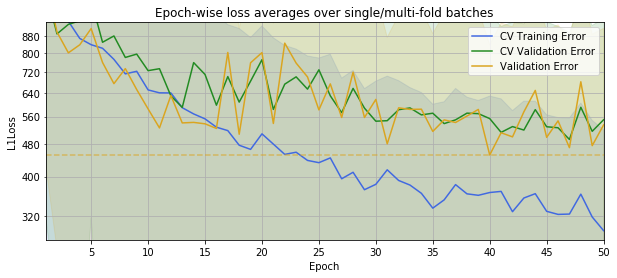

Test MAE: 796.5838404725165

lr=0.00010765392133786624, rho=0.7996391244211004
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_172022068_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_172022068_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 454.29


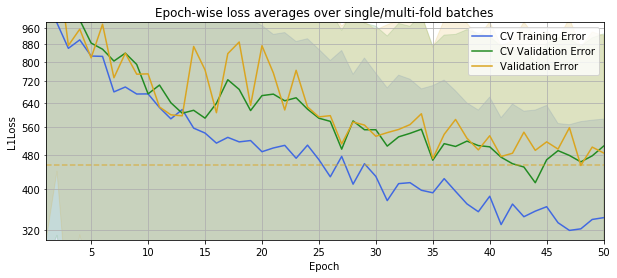

Test MAE: 920.2662473117953

lr=0.00010765392133786624, rho=0.984780697819487
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_174914274_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_174914274_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 402.89


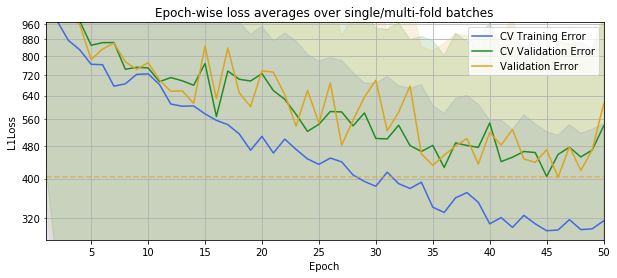

Test MAE: 948.7655228634088

lr=0.00010765392133786624, rho=0.903883697825173
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_181757593_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_181757593_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 432.02


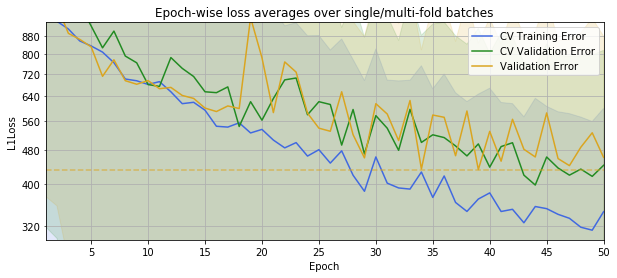

Test MAE: 824.7338590013851

lr=0.00012566796721759965, rho=1.0419993976568143
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_184702826_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_184702826_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 457.46


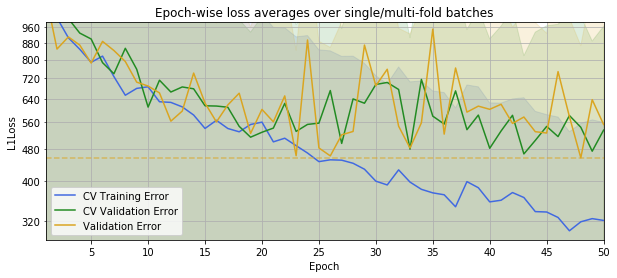

Test MAE: 1238.1917468318672

lr=0.00012566796721759965, rho=0.7996391244211004
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_191544691_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_191544691_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 381.13


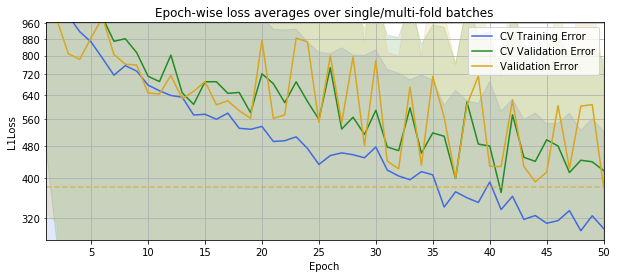

Test MAE: 887.4973493845986

lr=0.00012566796721759965, rho=0.984780697819487
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_194439244_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_194439244_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 403.21


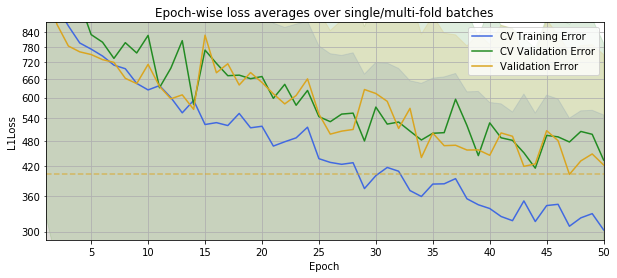

Test MAE: 837.3526267708738

lr=0.00012566796721759965, rho=0.903883697825173
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_201325072_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_201325072_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 425.58


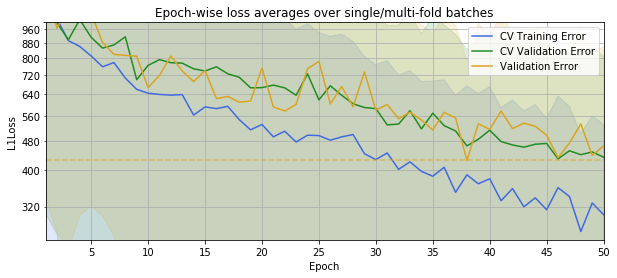

Test MAE: 853.2058500346277

lr=8.922404777592731e-05, rho=1.0419993976568143
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_204229095_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_204229095_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 425.48


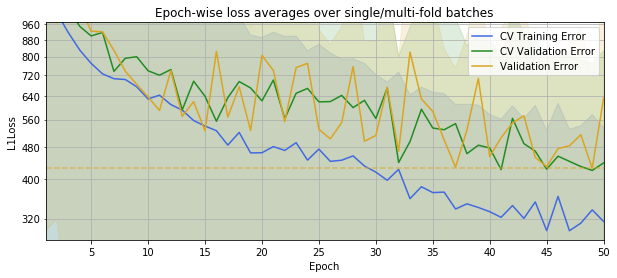

Test MAE: 839.5897362977498

lr=8.922404777592731e-05, rho=0.7996391244211004
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_211146502_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_211146502_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 399.02


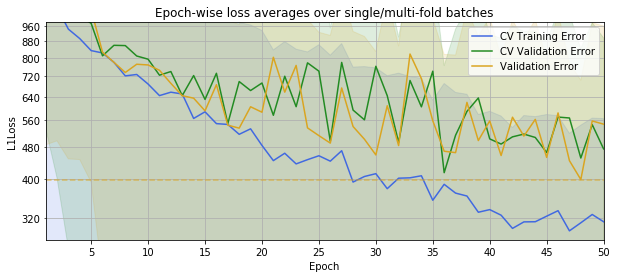

Test MAE: 897.4493034208544

lr=8.922404777592731e-05, rho=0.984780697819487
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_214029796_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_214029796_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 477.53


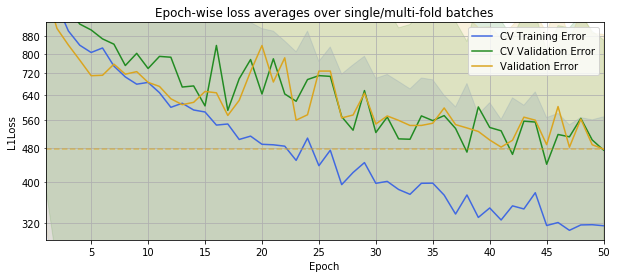

Test MAE: 933.904020081041

lr=8.922404777592731e-05, rho=0.903883697825173
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_220915782_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_220915782_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 393.90


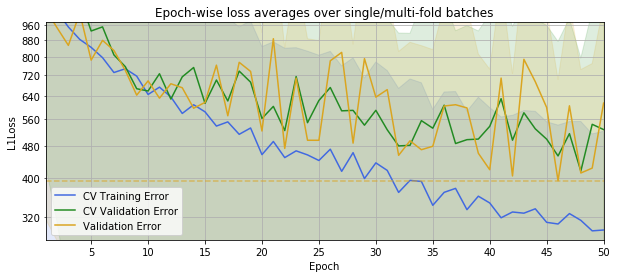

Test MAE: 806.1240629252527

lr=0.00010880254981687063, rho=1.0419993976568143
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_223758735_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_223758735_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 411.22


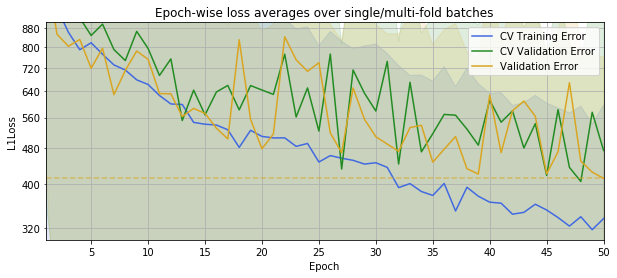

Test MAE: 1075.4996214491398

lr=0.00010880254981687063, rho=0.7996391244211004
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_230641309_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_230641309_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 367.37


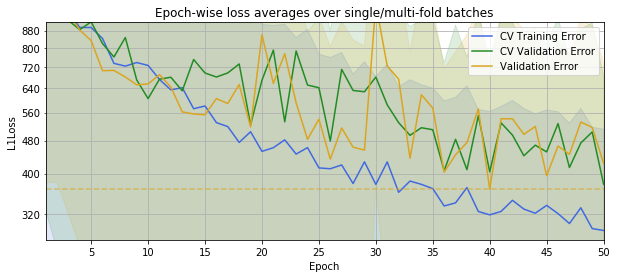

Test MAE: 840.5981388359011

lr=0.00010880254981687063, rho=0.984780697819487
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190118_233539407_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190118_233539407_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 450.30


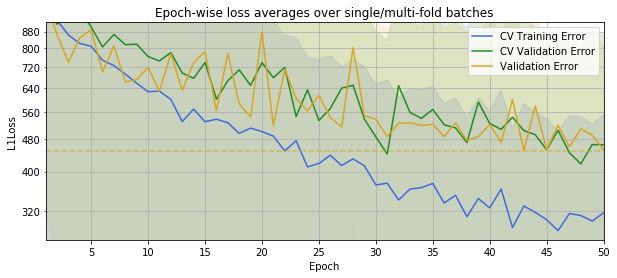

Test MAE: 800.3708868189882

lr=0.00010880254981687063, rho=0.903883697825173
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20190119_000443663_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20190119_000443663_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 431.85


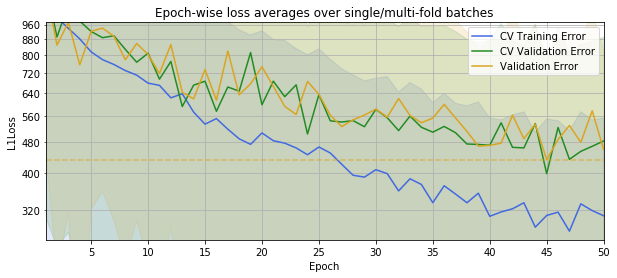

Test MAE: 682.50352618038



In [15]:
optimizer_later = test_optimizer(
    dp.DroneRGBLater, 
    np.abs(np.random.normal(loc=best_optimizer_later[0],
                            scale=2*best_optimizer_later[0]*0.1, 
                            size=4)),
    np.abs(np.random.normal(loc=best_optimizer_later[1]+1e-6,
                            scale=2*(best_optimizer_later[1]+1e-6)*0.1, 
                            size=4)))

rho,0.7996391244211004,0.903883697825173,0.984780697819487,1.0419993976568143
lr,,,,
0.000089,897.449303,806.124063,933.904020,839.589736
0.000108,920.266247,824.733859,948.765523,796.583840
0.000109,840.598139,682.503526,800.370887,1075.499621
0.000126,887.497349,853.205850,837.352627,1238.191747


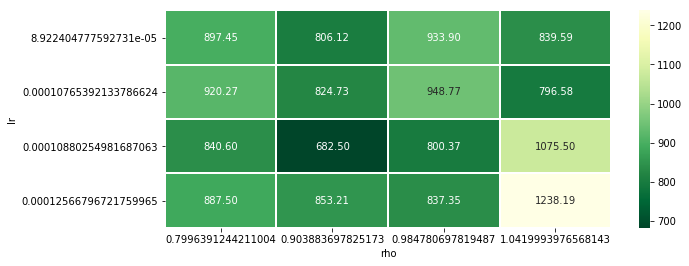

In [16]:
pivot = optimizer_later.pivot_table(values='loss_mean',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [17]:
best_row = optimizer_later.loc[optimizer_later['loss_mean'].idxmin()]
if best_row['loss_mean'] < best_optimizer_later[-1]:
    best_optimizer_later = (best_row['lr'], best_row['rho'], best_row['loss_mean'])
best_optimizer_later

(0.0001, 0.9, 624.3419062256999)

#### 4.2.3 Conclusions


In [18]:
best_optimizer_earlier = (0.007607151199932964, 0.5802310128184069, 546.1770678744064)
#best_optimizer_later = (0.0005743007260451201, 1.1277277481106169e-06, 605.0979505096958)

print("RGB Earlier")
print("\tLearning Rate: {}".format(best_optimizer_earlier[0]))
print("\tMoving Mean Gradient Coefficient: {}".format(best_optimizer_earlier[1]))
print("\tTest MAE: {}".format(best_optimizer_earlier[2]))
print("RGB Later")
print("\tLearning Rate: {}".format(best_optimizer_later[0]))
print("\tMoving Mean Gradient Coefficient: {}".format(best_optimizer_later[1]))
print("\tTest MAE: {}".format(best_optimizer_later[2]))

RGB Earlier
	Learning Rate: 0.007607151199932964
	Moving Mean Gradient Coefficient: 0.5802310128184069
	Test MAE: 546.1770678744064
RGB Later
	Learning Rate: 0.0001
	Moving Mean Gradient Coefficient: 0.9
	Test MAE: 624.3419062256999


## 5. Regularization

We have already concluded that the optimal optimizer to use is the Adadelta and the optimal CNN depth is 8 layers. We have also concluded as a side product of the optimal depth research that minimal test loss is best achieved using 128px RGB datasets. Now it is time to attempt at drivin the test loss down by means of regularization. We have two possibilities, early stopping and weight decay.

The hyperparameter for the early stopping is the number of consecutive non-improving training iterations to perform before terminating the training. We will also implement a second boolean hyperparameter for whether to continue training after first termination. The hyperparameter for the weight decay is the decay coefficient. We will try out several values with random search. Thus we will try out a fixed amount of trainings and see which one of them produces the lowest test error.

We will set the hyperparameter value ranges as follows:

- Early stopping (`patience`): $[10, ... , 50]$
- Weight decay (`weight_decay`): $[0.0, ... , 1.0]$

While this is just a comparison, we'll continue using a limited amount of epochs to see how the overall progression of the training proceeds. We'll also proceed byt first testing the weight decay and only after that the early stopping. This is because the training times grow exceedingly after the number of epochs is in ballpark where early stopping is able to show its effectiveness.

In [19]:
import os
import shutil

import numpy as np
import pandas as pd
import torch
from torch import optim

from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']
EPOCHS = 50
regularized_models_dir = os.path.join(model_settings.MODELS_DIR,'regularization')
os.makedirs(regularized_models_dir,exist_ok=True)


def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."
    cnn.model_path = os.path.join(regularized_models_dir,cnn.model_filename)
    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "initial_model_{}.{}".format(
        DATASET_NAMES[is_later], suffix)
    if save:
        cnn.save_model()
        from_path = cnn.model_path
        to_path = os.path.join(model_settings.MODELS_DIR, model_name)
    else:
        from_path = os.path.join(model_settings.MODELS_DIR, model_name)
        to_path = cnn.model_path
    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))

### 5.1 Weight decay

First we research the optimal weight decay by running series of grid searches. We want to first see if there is a coarse area of better test errors achieved with only a maximum of 50 epochs. After that we'll use this information to perform random searches in this neighborhood of best coarse values drawing random samples from a normal distribution with mean corresponding to the dataset-wise lowest grid search and standard deviation focusing the values around that particular mean value.

In [20]:
def test_weight_decay(dataset, weight_decays, lr, rho):
    is_later = dataset == dp.DroneRGBLater
    best_losses = pd.DataFrame(
        columns=['weight_decay', 'loss_mean'])
    for weight_decay in weight_decays:
        print("weight_decay={}".format(
            weight_decay))
        cnn = DroneYieldMeanCNN(
            source_bands=3,
            source_dim=128,
            cnn_layers=8 if is_later else 6,
            optimizer=optim.Adadelta,
            optimizer_parameters={
                'weight_decay': weight_decay,
                'lr':lr,
                'rho':rho})
        copy_model(cnn=cnn, is_later=is_later, save=False)
        cnn.load_model()
        cnn.train(
            epochs=50,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            suppress_output=True)
        test_errors = cnn.produce_test_errors(dataset(DB_128,test=True))
        print(f"Test MAE: {test_errors['mean_error']}")  
        print()
        best_losses = best_losses.append(
            {'weight_decay': weight_decay,
             'loss_mean': test_errors['mean_error']},
            ignore_index=True)
    return best_losses.sort_values(by='loss_mean').reset_index(drop=True)

#(weight_decay, best_loss)
best_l2_earlier = (None,None)
best_l2_later = (None,None)

#### 5.1.1 Grid Search with Both RGB Datasets

So first we perform a crude grid search with multiple values of powers of ten.

##### 5.1.1.1 RGB Earlier Dataset

weight_decay=0.001
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_023650930_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_023650930_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 476.01


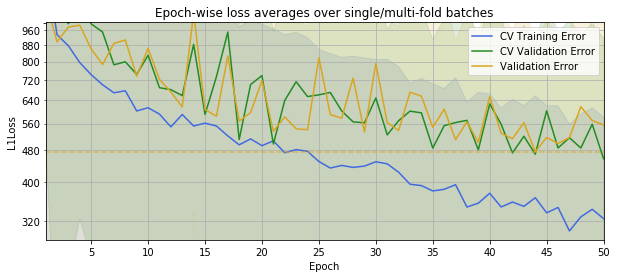

Test MAE: 558.404762630385

weight_decay=0.01
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_030903935_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_030903935_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 463.42


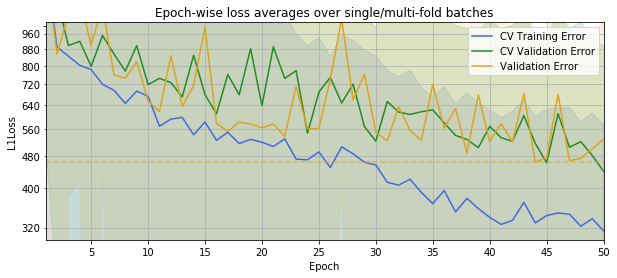

Test MAE: 656.1567306622075

weight_decay=0.1
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_034125033_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_034125033_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 505.47


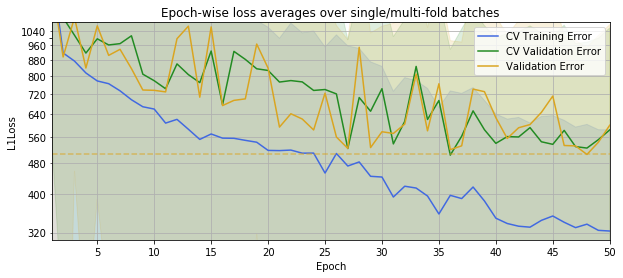

Test MAE: 760.7428397562967

weight_decay=1.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_041341537_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_041341537_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 574.76


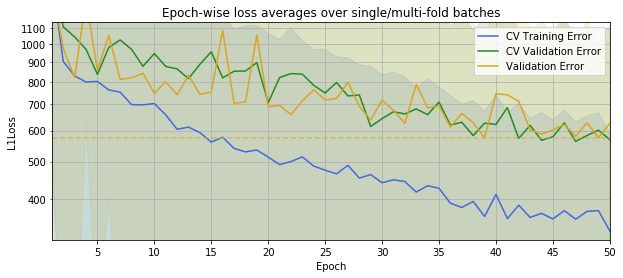

Test MAE: 945.0785586229011

weight_decay=10.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_044546010_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_044546010_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 629.75


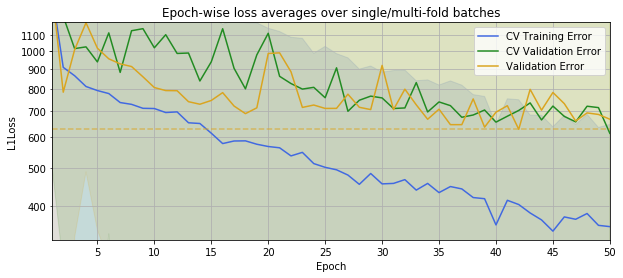

Test MAE: 1180.6621646958743



In [27]:
l2_earlier = test_weight_decay(
    dp.DroneRGBEarlier, 
    [1e-3, 1e-2, 1e-1, 1e0, 1e1],
    best_optimizer_earlier[0],
    best_optimizer_earlier[1]
)

,weight_decay,loss_mean
0,0.001,558.404763
1,0.010,656.156731
2,0.100,760.742840
3,1.000,945.078559
4,10.000,1180.662165


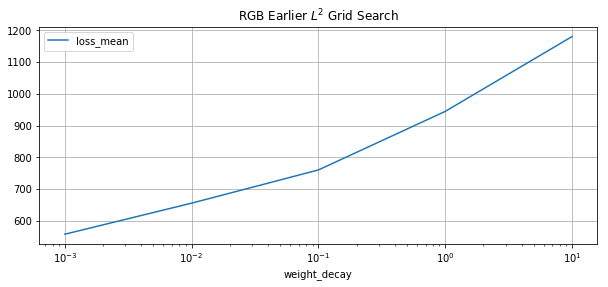

In [28]:
l2_earlier.plot(x='weight_decay', y='loss_mean', logx=True, grid=True, title='RGB Earlier $L^2$ Grid Search')
l2_earlier

In [29]:
best_row = l2_earlier.loc[l2_earlier['loss_mean'].idxmin()]
best_l2_earlier = (best_row['weight_decay'], best_row['loss_mean'])
best_l2_earlier

(0.001, 558.404762630385)

In [ ]:
best_l2_earlier = (0.001, 558.404762630385)

##### 5.1.1.2 RGB Later Dataset

weight_decay=0.001
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_003359699_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_003359699_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 452.75


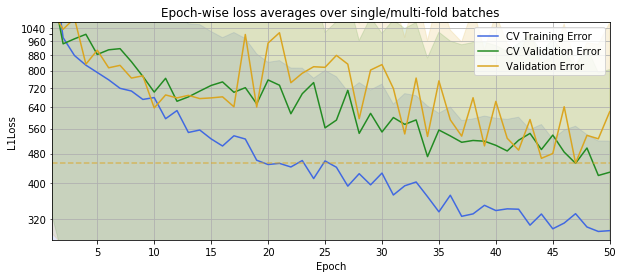

Test MAE: 700.4124173035333

weight_decay=0.01
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_010242708_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_010242708_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 369.66


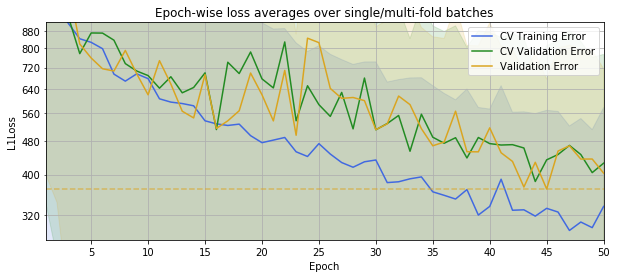

Test MAE: 841.5623409099193

weight_decay=0.1
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_013140655_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_013140655_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 364.27


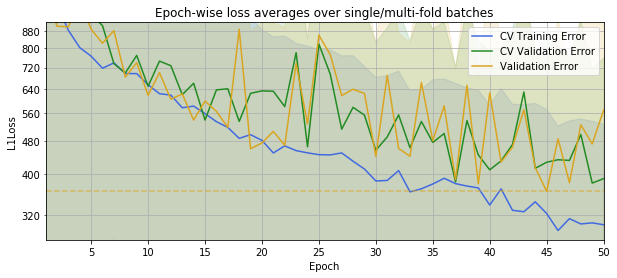

Test MAE: 915.2356093719625

weight_decay=1.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_020039552_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_020039552_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 419.03


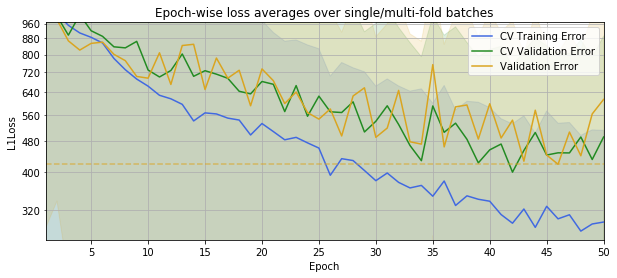

Test MAE: 884.9119259847638

weight_decay=10.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_022953196_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_022953196_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 431.22


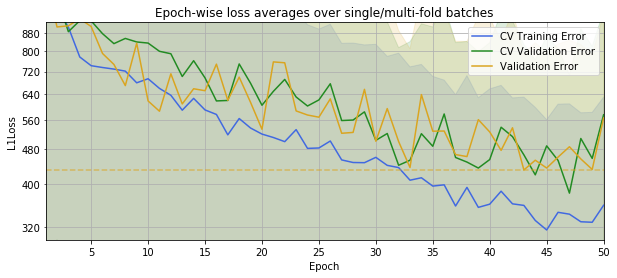

Test MAE: 1099.5986590111052



In [21]:
l2_later = test_weight_decay(
    dp.DroneRGBLater, 
    [1e-3, 1e-2, 1e-1, 1e0, 1e1],
    best_optimizer_later[0],
    best_optimizer_later[1]
)

,weight_decay,loss_mean
0,0.001,700.412417
1,0.010,841.562341
2,1.000,884.911926
3,0.100,915.235609
4,10.000,1099.598659


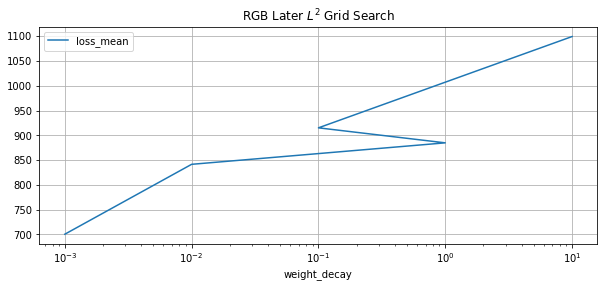

In [22]:
l2_later.plot(x='weight_decay', y='loss_mean', logx=True, grid=True, title='RGB Later $L^2$ Grid Search')
l2_later

In [23]:
best_row = l2_later.loc[l2_later['loss_mean'].idxmin()]
best_l2_later = (best_row['weight_decay'], best_row['loss_mean'])
best_l2_later

(0.001, 700.4124173035333)

#### 5.1.2 Random Search with Both Datasets

Then we perform a zoomed search around the optimal values. 

There is one discussion point however, and that is the lowest test loss produced for RGB Earlier dataset. When comparing the loss progression with graphs, it seems that the lowest loss with ``weight_decay=0.001`` could be attributable to just random fluctuations. To support this notion, the graphs of other regularization values produce more values close to the lowest attained loss more coherently, while the loss of the first regularization test with the first dataset jumps back up to 550ish test loss range. 

Thus it seems that for both datasets we could use similar base ballpark of random search values. One option would to use a normal distribution. Another is to use a limited range uniform distribution. We will go with normal to properly zoom to a range of optimal values.

##### 5.1.2.1 RGB Earlier Dataset

weight_decay=0.0011771985130938746
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_074156827_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_074156827_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 480.92


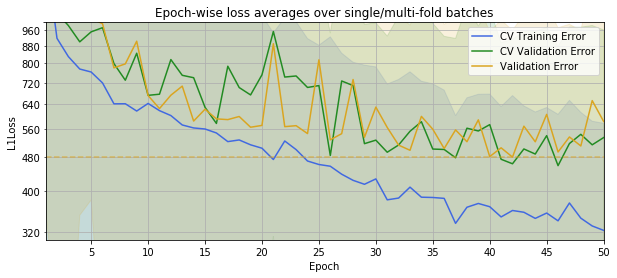

Test MAE: 573.5837084331538

weight_decay=0.000677250765847298
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_081345543_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_081345543_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 441.82


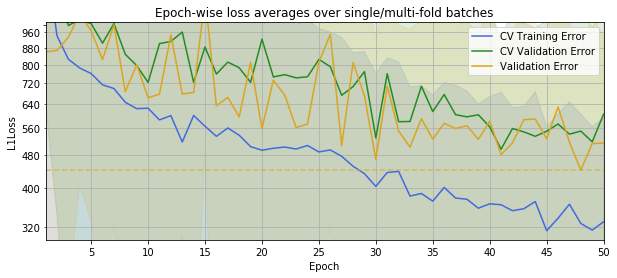

Test MAE: 970.1372974659727

weight_decay=0.0018664710444273966
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_084525322_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_084525322_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 482.98


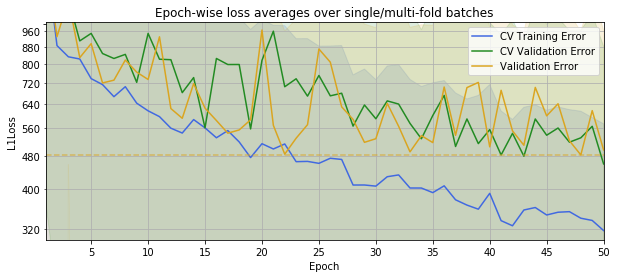

Test MAE: 864.4627889273448

weight_decay=0.00033656489901813687
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_091711000_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_091711000_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 483.77


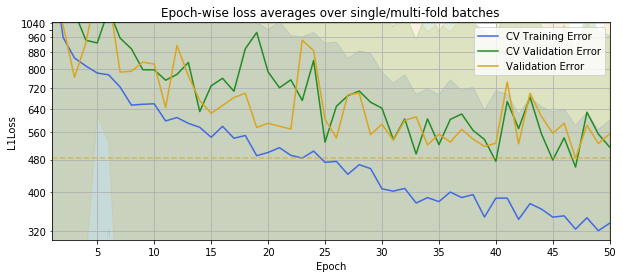

Test MAE: 631.7606650032861

weight_decay=0.0010565714315504393
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_094916245_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_094916245_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 556.39


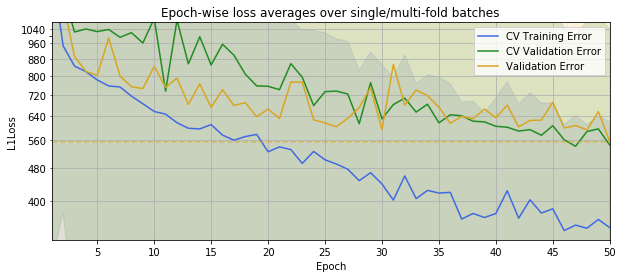

Test MAE: 841.8795419431606

weight_decay=0.0020017304185297458
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_102100382_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_102100382_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 465.28


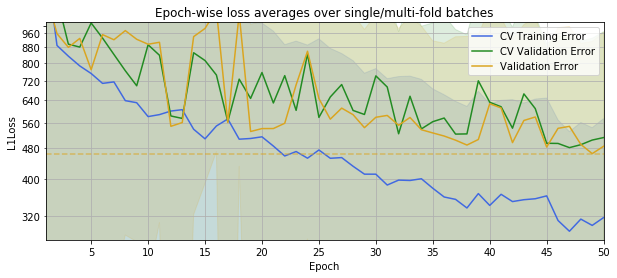

Test MAE: 588.8261397425161

weight_decay=0.0003607143688694679
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_105322423_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_105322423_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 448.07


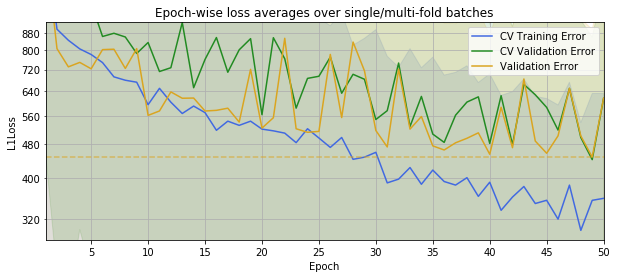

Test MAE: 590.9081325660405

weight_decay=0.0015375879599904213
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_112504913_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_112504913_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 474.79


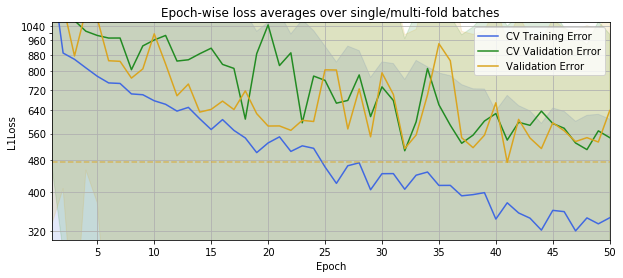

Test MAE: 702.781106563242

weight_decay=0.00136251737139806
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_115642064_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_115642064_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 494.02


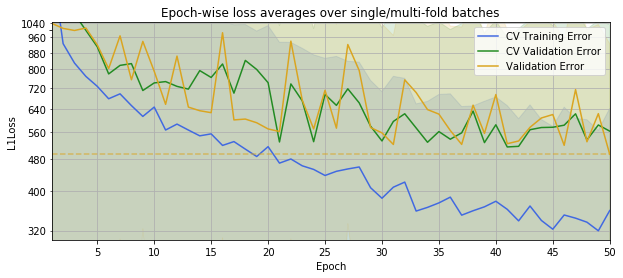

Test MAE: 632.524169921875

weight_decay=0.0012559874138842592
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190116_122909166_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190116_122909166_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 543.78


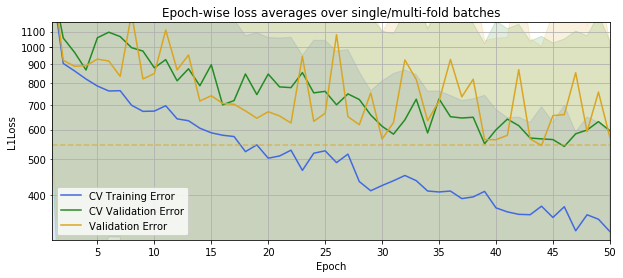

Test MAE: 936.9619084310337



In [33]:
l2_earlier = test_weight_decay(
    dp.DroneRGBEarlier, 
    np.abs(np.random.normal(loc=best_l2_earlier[0], 
                            scale=5*best_l2_earlier[0]*0.1, 
                            size=10)),
    best_optimizer_earlier[0],
    best_optimizer_earlier[1]
)

,weight_decay,loss_mean
0,0.001177,573.583708
1,0.002002,588.826140
2,0.000361,590.908133
3,0.000337,631.760665
4,0.001363,632.524170
5,0.001538,702.781107
6,0.001057,841.879542
7,0.001866,864.462789
8,0.001256,936.961908
9,0.000677,970.137297


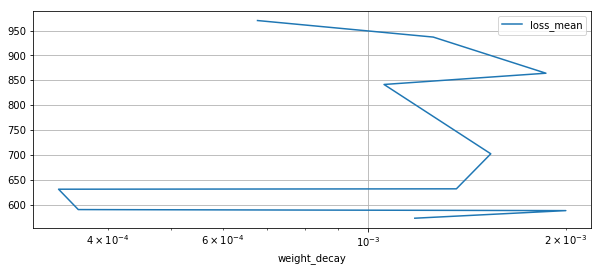

In [34]:
l2_earlier.plot(x='weight_decay', y='loss_mean', logx=True, grid=True)
l2_earlier

In [35]:
best_row = l2_earlier.loc[l2_earlier['loss_mean'].idxmin()]

if best_row['loss_mean'] < best_l2_earlier[-1]:
    best_l2_earlier = (best_row['weight_decay'], best_row['loss_mean'])

best_l2_earlier

(0.001, 558.404762630385)

##### 5.1.2.2 RGB Later Dataset

weight_decay=0.00032505303570999557
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_025849849_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_025849849_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 433.96


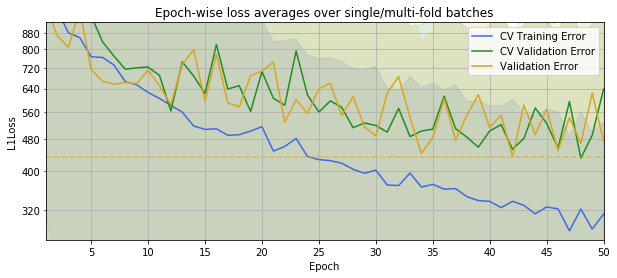

Test MAE: 888.3019472777751

weight_decay=0.001611865284064483
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_032726096_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_032726096_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 405.38


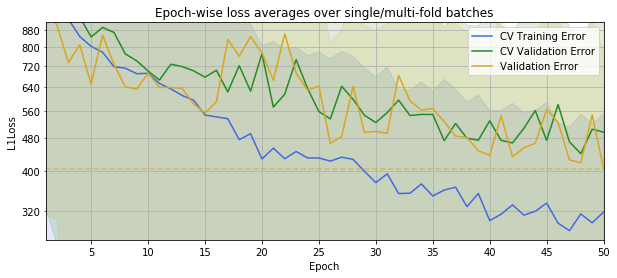

Test MAE: 737.9906235571783

weight_decay=0.00048244021186893407
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_035603232_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_035603232_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 399.65


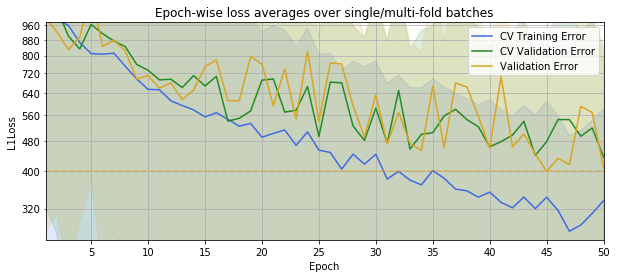

Test MAE: 939.7143778704559

weight_decay=0.0015597720699191038
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_042455107_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_042455107_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 339.11


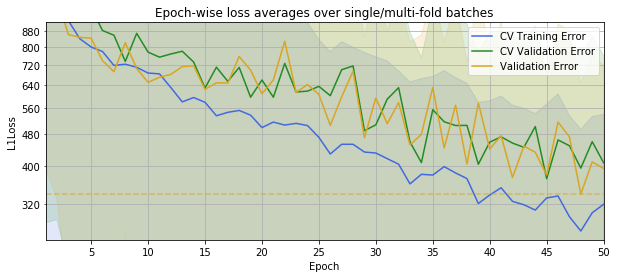

Test MAE: 1007.408659132606

weight_decay=0.0007884385032065886
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_045352623_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_045352623_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 406.23


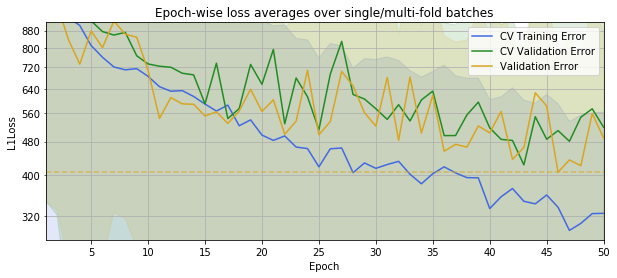

Test MAE: 1112.1415586575379

weight_decay=0.0005433798409545296
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_052234142_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_052234142_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 349.52


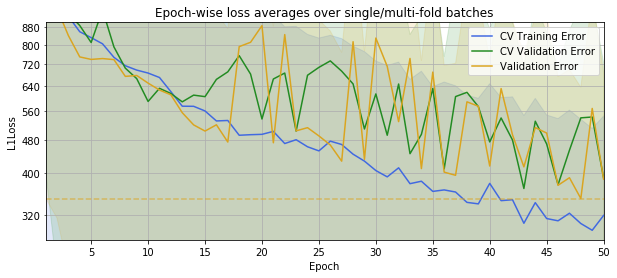

Test MAE: 886.8084787039512

weight_decay=0.001519129670546082
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_055111747_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_055111747_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 423.64


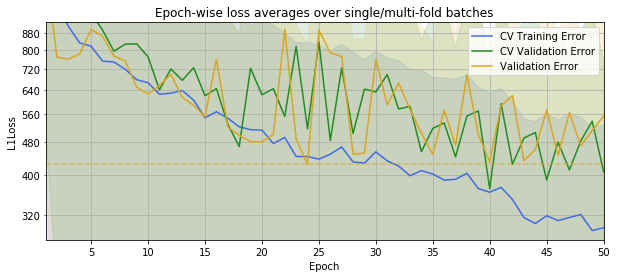

Test MAE: 818.4715638820713

weight_decay=0.001134879025499406
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_062015723_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_062015723_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 467.58


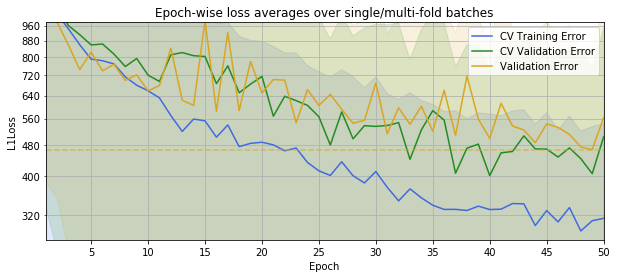

Test MAE: 750.1661488961654

weight_decay=0.0011496382325015284
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_064851151_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_064851151_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 441.72


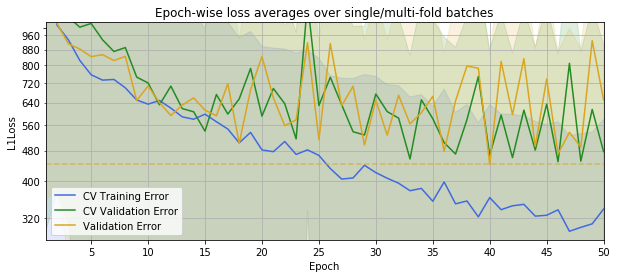

Test MAE: 825.1725238900904

weight_decay=0.0006407050894716345
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_071727128_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_071727128_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 444.72


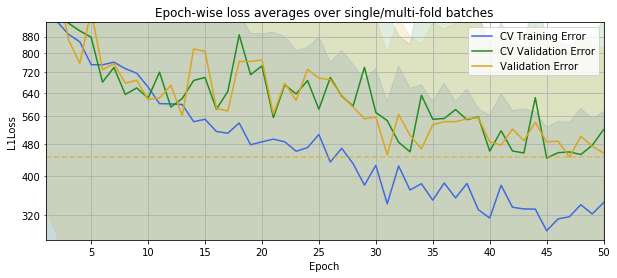

Test MAE: 851.2738866731872



In [24]:
result_later = test_weight_decay(
    dp.DroneRGBLater,
    np.abs(np.random.normal(loc=best_l2_later[0], 
                            scale=5*best_l2_later[0]*0.1, 
                            size=10)),
    best_optimizer_later[0],
    best_optimizer_later[1]
)

,weight_decay,loss_mean
0,0.001612,737.990624
1,0.001135,750.166149
2,0.001519,818.471564
3,0.001150,825.172524
4,0.000641,851.273887
5,0.000543,886.808479
6,0.000325,888.301947
7,0.000482,939.714378
8,0.001560,1007.408659
9,0.000788,1112.141559


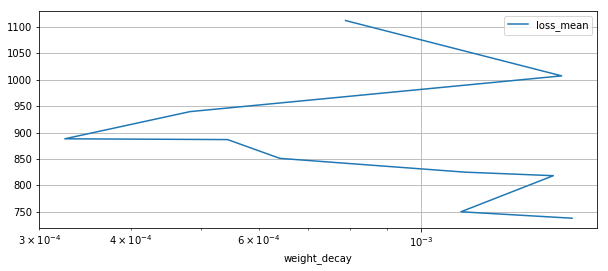

In [25]:
result_later.plot(x='weight_decay', y='loss_mean', logx=True, grid=True)
result_later

In [26]:
best_row = l2_later.loc[l2_later['loss_mean'].idxmin()]
if best_row['loss_mean'] < best_l2_later[-1]:
    best_l2_later = (best_row['weight_decay'], best_row['loss_mean'])
best_l2_later

(0.001, 700.4124173035333)

#### 5.1.3 Conclusions

In [27]:
#best_l2_earlier = (0.001, 558.404762630385)
#best_l2_later = (0.001, 700.4124173035333)

print("RGB Earlier")
print("\tWeight Decay: {}".format(best_l2_earlier[0]))
print("\tTest MAE: {}".format(best_l2_earlier[1]))
print("RGB Later")
print("\tWeight Decay: {}".format(best_l2_later[0]))
print("\tTest MAE: {}".format(best_l2_later[1]))

RGB Earlier
	Weight Decay: 0.001
	Test MAE: 558.404762630385
RGB Later
	Weight Decay: 0.001
	Test MAE: 700.4124173035333


### 5.2. Early Stopping

Next we test out multiple setting of early stopping. With early stopping it is adives by Goodfellow et al. (2016) to perform sequential training after the training has been terminated early using the same termination setting. We will thus try out several values for the early stopping patience, which is a number determining how many non-improving epochs we allow the training to pass before terminating it. We try with patiences 10, 20, 30, 40 and 50.

In [28]:
def test_early_stopping(dataset, patiences, weight_decay, lr, rho):
    is_later = dataset == dp.DroneRGBLater
    best_losses = pd.DataFrame(
        columns=['patience', 'epochs', 'loss_mean'])
    for patience in patiences:
        print("patience={}".format(
            patience))
        cnn = DroneYieldMeanCNN(
            source_bands=3,
            source_dim=128,
            cnn_layers=8 if is_later else 6,
            optimizer=optim.Adadelta,
            optimizer_parameters={'weight_decay': weight_decay})
        copy_model(cnn=cnn, is_later=is_later, save=False)
        cnn.load_model()
        losses = []
        losses_dict = cnn.train(
            epochs=400,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            early_stopping_patience=patience)
        epochs = list(np.array(losses_dict['test_losses_mean_std'])[:, 0])
        losses_dict = cnn.train(
            epochs=400,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            early_stopping_patience=patience)
        epochs += list(np.array(losses_dict['test_losses_mean_std'])[:, 0])
        test_errors = cnn.produce_test_errors(dataset(DB_128,test=True))
        print(f"Test MAE: {test_errors['mean_error']}")  
        print()
        best_losses = best_losses.append(
            {'patience': patience,
             'epochs': np.array(epochs).flatten().size,
             'loss_mean': test_errors['mean_error']},
            ignore_index=True)
        
    return best_losses.sort_values(by='patience').reset_index(drop=True)

#### 5.2.1 RGB Earlier Dataset

patience=10
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_074610417_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_074610417_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (12m 24s) 	Mean Loss:	Train=510.64 +-522.53	Test=578.54 +-546.48
[  40/ 400] (24m 22s) 	Mean Loss:	Train=354.83 +-278.69	Test=597.69 +-546.39
[  54/ 400] (32m 43s) 	Mean Loss:	Train=320.88 +-244.98	Test=499.58 +-471.83
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_074610417_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 496.03


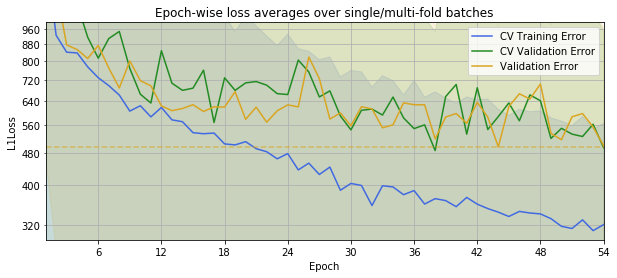

Starting the training with GPU:
[  16/ 400] (10m  7s) 	Mean Loss:	Train=274.69 +-225.98	Test=491.39 +-431.47
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_074610417_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 433.64


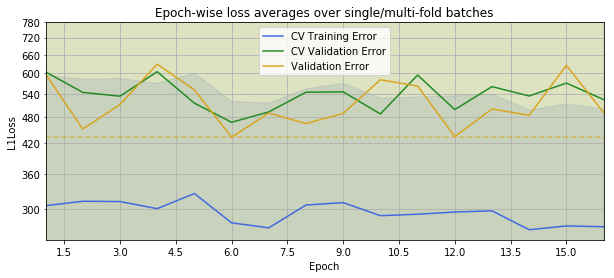

Test MAE: 593.8963091370208

patience=20
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_082914875_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_082914875_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (12m 22s) 	Mean Loss:	Train=524.39 +-539.11	Test=662.08 +-682.28
[  40/ 400] (24m 17s) 	Mean Loss:	Train=371.38 +-308.61	Test=604.02 +-480.30
[  60/ 400] (36m 13s) 	Mean Loss:	Train=306.61 +-227.62	Test=599.21 +-440.53
[  80/ 400] (48m  9s) 	Mean Loss:	Train=238.07 +-183.85	Test=464.32 +-450.62
[ 100/ 400] (60m  4s) 	Mean Loss:	Train=223.07 +-178.00	Test=403.82 +-426.95
[ 120/ 400] (71m 59s) 	Mean Loss:	Train=194.29 +-146.44	Test=412.93 +-400.41
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_082

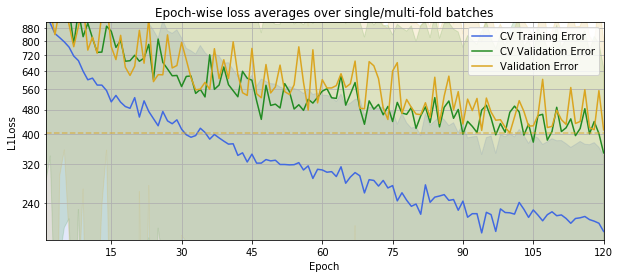

Starting the training with GPU:
[  20/ 400] (12m 22s) 	Mean Loss:	Train=191.12 +-149.58	Test=401.53 +-357.26
[  29/ 400] (17m 44s) 	Mean Loss:	Train=181.65 +-144.81	Test=386.40 +-334.51
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_082914875_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 343.26


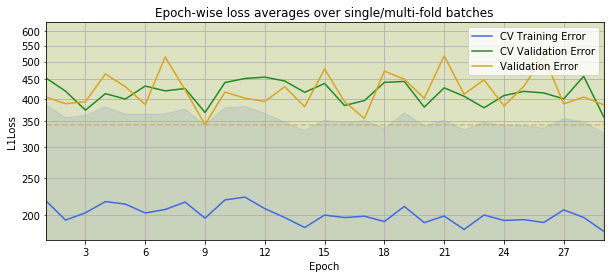

Test MAE: 651.6248751139544

patience=30
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_095911588_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_095911588_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (12m 36s) 	Mean Loss:	Train=550.71 +-530.82	Test=606.21 +-583.78
[  40/ 400] (24m 43s) 	Mean Loss:	Train=368.44 +-302.65	Test=674.93 +-590.70
[  60/ 400] (36m 50s) 	Mean Loss:	Train=284.30 +-232.42	Test=563.20 +-516.58
[  80/ 400] (48m 56s) 	Mean Loss:	Train=277.46 +-213.64	Test=466.19 +-418.28
[ 100/ 400] (61m  3s) 	Mean Loss:	Train=225.09 +-189.12	Test=460.92 +-450.00
[ 116/ 400] (70m 45s) 	Mean Loss:	Train=199.50 +-173.13	Test=443.14 +-411.64
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_095

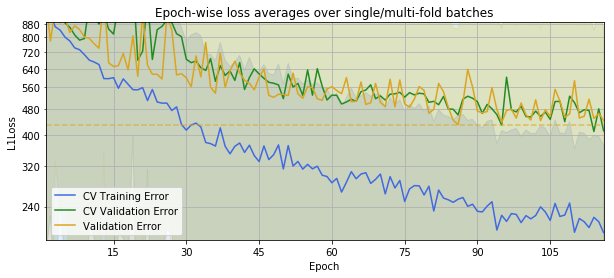

Starting the training with GPU:
[  20/ 400] (12m 21s) 	Mean Loss:	Train=206.49 +-164.93	Test=387.94 +-363.41
[  40/ 400] (24m 14s) 	Mean Loss:	Train=192.92 +-140.63	Test=520.43 +-485.20
[  48/ 400] (28m 59s) 	Mean Loss:	Train=191.48 +-154.93	Test=398.97 +-416.29
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_095911588_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 374.85


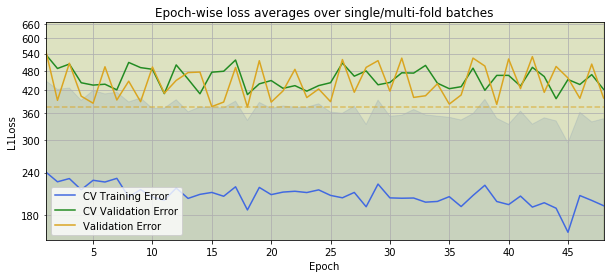

Test MAE: 679.7358468002672

patience=40
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_113909370_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_113909370_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (12m 21s) 	Mean Loss:	Train=534.94 +-548.82	Test=609.30 +-574.09
[  40/ 400] (24m 15s) 	Mean Loss:	Train=356.12 +-314.99	Test=561.34 +-497.32
[  60/ 400] (36m  8s) 	Mean Loss:	Train=298.79 +-238.21	Test=537.45 +-489.83
[  80/ 400] (48m  0s) 	Mean Loss:	Train=265.37 +-202.40	Test=597.52 +-563.20
[ 100/ 400] (59m 53s) 	Mean Loss:	Train=239.41 +-192.44	Test=488.87 +-487.16
[ 120/ 400] (71m 46s) 	Mean Loss:	Train=212.97 +-169.12	Test=524.28 +-492.86
[ 140/ 400] (83m 39s) 	Mean Loss:	Train=191.65 +-147.99	Test=461.35 +-422.13
[ 160/ 400] (95m 32s) 	Mean Loss:	Train=191.50 +-145.84	Tes

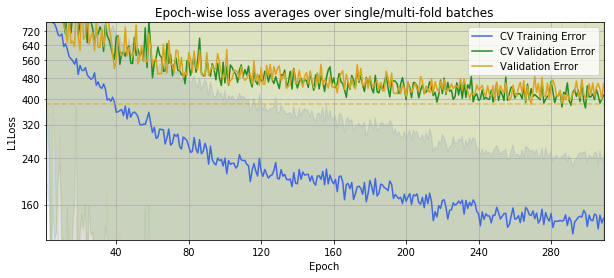

Starting the training with GPU:
[  20/ 400] (12m 22s) 	Mean Loss:	Train=132.72 +-101.40	Test=373.92 +-397.58
[  40/ 400] (24m 17s) 	Mean Loss:	Train=132.22 +-96.78	Test=434.75 +-435.89
[  60/ 400] (36m 12s) 	Mean Loss:	Train=123.00 +-98.79	Test=386.29 +-360.33
[  80/ 400] (48m  6s) 	Mean Loss:	Train=128.12 +-89.85	Test=382.51 +-372.90
[ 100/ 400] (59m 58s) 	Mean Loss:	Train=124.97 +-93.79	Test=389.34 +-395.80
[ 120/ 400] (71m 52s) 	Mean Loss:	Train=115.21 +-86.13	Test=422.71 +-438.16
[ 126/ 400] (75m 25s) 	Mean Loss:	Train=118.66 +-89.05	Test=399.40 +-398.25
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_113909370_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 360.16


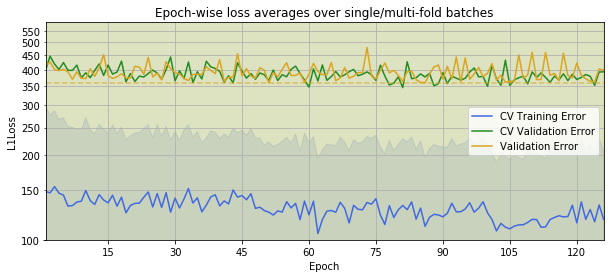

Test MAE: 695.0653472030826

patience=50
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_155856949_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_155856949_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (12m 40s) 	Mean Loss:	Train=526.06 +-515.71	Test=539.71 +-493.76
[  40/ 400] (24m 50s) 	Mean Loss:	Train=372.39 +-283.68	Test=697.73 +-554.66
[  60/ 400] (36m 59s) 	Mean Loss:	Train=257.87 +-215.01	Test=466.33 +-421.26
[  80/ 400] (49m  7s) 	Mean Loss:	Train=256.57 +-184.36	Test=477.35 +-419.86
[ 100/ 400] (61m 15s) 	Mean Loss:	Train=236.87 +-176.61	Test=436.59 +-388.92
[ 120/ 400] (73m 22s) 	Mean Loss:	Train=193.84 +-152.25	Test=400.68 +-416.39
[ 140/ 400] (85m 31s) 	Mean Loss:	Train=187.42 +-141.65	Test=419.39 +-436.39
[ 160/ 400] (97m 39s) 	Mean Loss:	Train=177.72 +-131.23	Tes

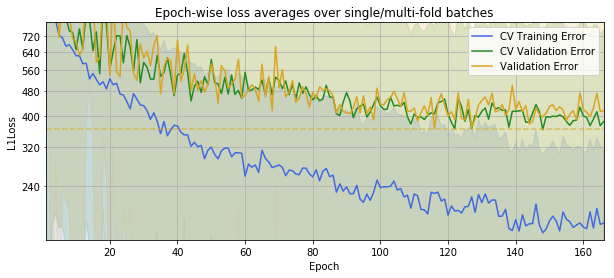

Starting the training with GPU:
[  20/ 400] (12m 18s) 	Mean Loss:	Train=174.49 +-126.92	Test=382.72 +-369.67
[  40/ 400] (24m  9s) 	Mean Loss:	Train=168.19 +-129.03	Test=370.23 +-391.01
[  60/ 400] (35m 60s) 	Mean Loss:	Train=168.15 +-123.19	Test=355.52 +-378.90
[  80/ 400] (47m 50s) 	Mean Loss:	Train=148.03 +-114.93	Test=381.87 +-387.74
[  95/ 400] (56m 42s) 	Mean Loss:	Train=145.28 +-104.91	Test=365.83 +-403.68
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_155856949_Adadelta_3x128x128_6cnn_2fc.pkl
Best Validation Loss: 333.01


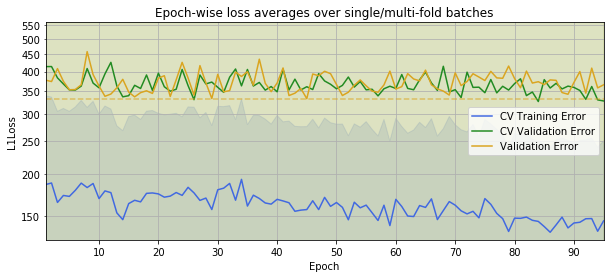

Test MAE: 484.34491173836074



In [29]:
patience_earlier = test_early_stopping(
    dataset=dp.DroneRGBEarlier, 
    weight_decay=best_l2_earlier[0], 
    lr=best_optimizer_earlier[0], 
    rho=best_optimizer_earlier[1], 
    patiences=[10,20,30,40,50])

#### 5.2.2 RGB Later Dataset

patience=10
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_183709715_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_183709715_Adadelta_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (11m 52s) 	Mean Loss:	Train=486.30 +-442.62	Test=888.10 +-666.46
[  40/ 400] (23m 15s) 	Mean Loss:	Train=363.93 +-271.02	Test=558.09 +-454.07
[  44/ 400] (25m 32s) 	Mean Loss:	Train=314.89 +-244.82	Test=605.87 +-483.97
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_183709715_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 498.06


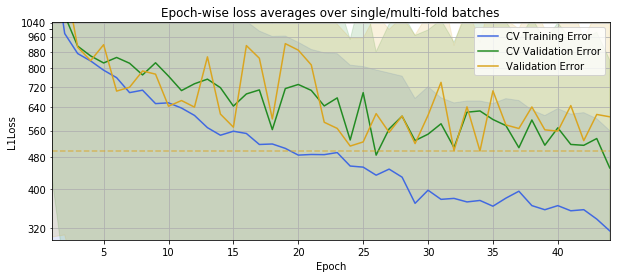

Starting the training with GPU:
[  20/ 400] (11m 32s) 	Mean Loss:	Train=272.58 +-204.21	Test=441.11 +-328.47
[  22/ 400] (12m 39s) 	Mean Loss:	Train=256.12 +-209.39	Test=421.05 +-377.22
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_183709715_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 367.13


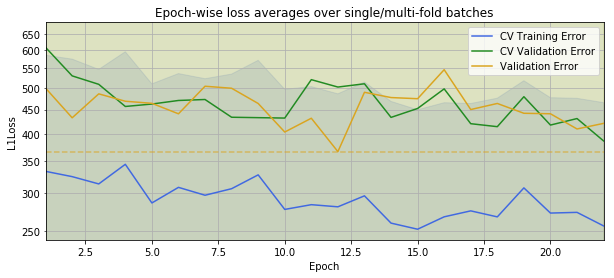

Test MAE: 761.1432573902848

patience=20
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_191533614_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_191533614_Adadelta_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (11m 42s) 	Mean Loss:	Train=488.28 +-395.06	Test=1046.54 +-737.67
[  40/ 400] (22m 55s) 	Mean Loss:	Train=356.47 +-255.17	Test=646.75 +-522.35
[  60/ 400] (34m  7s) 	Mean Loss:	Train=278.53 +-210.26	Test=721.23 +-586.00
[  63/ 400] (35m 47s) 	Mean Loss:	Train=260.63 +-191.38	Test=557.62 +-457.24
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_191533614_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 420.29


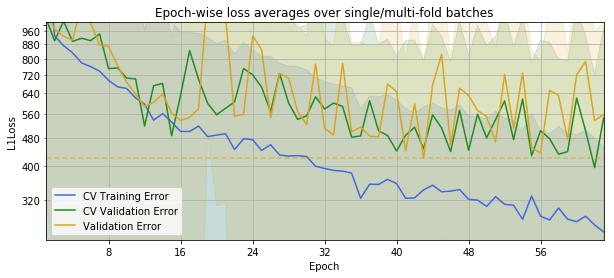

Starting the training with GPU:
[  20/ 400] (11m 31s) 	Mean Loss:	Train=253.55 +-185.90	Test=607.00 +-478.46
[  23/ 400] (13m 11s) 	Mean Loss:	Train=220.82 +-164.17	Test=687.74 +-543.19
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_191533614_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 346.43


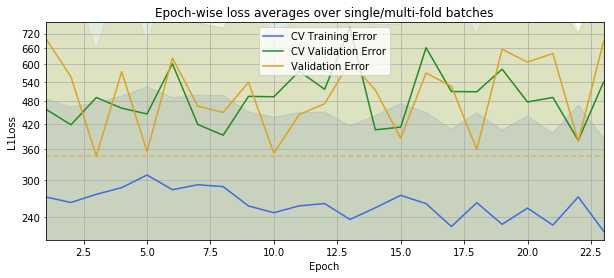

Test MAE: 793.4934613597152

patience=30
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_200445477_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_200445477_Adadelta_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (11m 37s) 	Mean Loss:	Train=475.97 +-434.72	Test=813.33 +-607.83
[  40/ 400] (22m 44s) 	Mean Loss:	Train=345.28 +-264.34	Test=483.45 +-412.24
[  60/ 400] (33m 50s) 	Mean Loss:	Train=274.62 +-203.11	Test=447.38 +-328.29
[  80/ 400] (44m 57s) 	Mean Loss:	Train=251.13 +-188.06	Test=407.51 +-346.18
[  99/ 400] (55m 30s) 	Mean Loss:	Train=227.94 +-167.88	Test=441.74 +-378.67
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_200445477_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 378.27


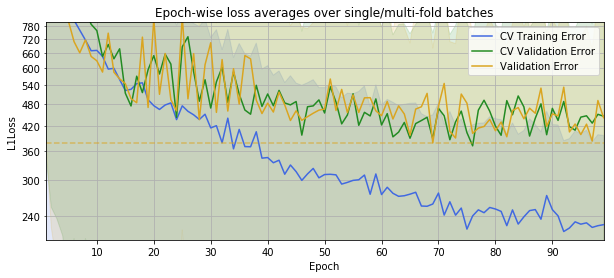

Starting the training with GPU:
[  20/ 400] (11m 31s) 	Mean Loss:	Train=235.34 +-166.04	Test=296.80 +-250.96
[  40/ 400] (22m 36s) 	Mean Loss:	Train=188.56 +-136.85	Test=425.15 +-380.04
[  48/ 400] (27m  1s) 	Mean Loss:	Train=164.32 +-126.45	Test=301.63 +-268.73
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_200445477_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 282.34


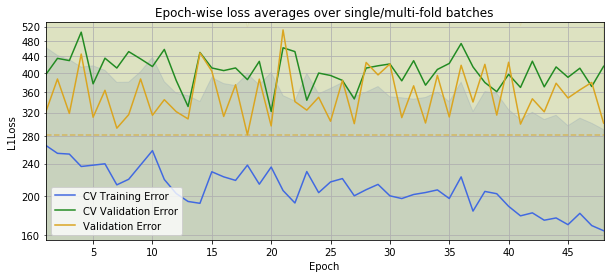

Test MAE: 754.0618974320811

patience=40
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_212730205_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_212730205_Adadelta_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (11m 34s) 	Mean Loss:	Train=471.41 +-403.53	Test=495.91 +-414.84
[  40/ 400] (22m 40s) 	Mean Loss:	Train=350.86 +-266.22	Test=510.28 +-427.12
[  60/ 400] (33m 45s) 	Mean Loss:	Train=286.88 +-210.88	Test=477.26 +-400.18
[  80/ 400] (44m 50s) 	Mean Loss:	Train=221.42 +-164.78	Test=378.80 +-307.22
[ 100/ 400] (55m 54s) 	Mean Loss:	Train=210.39 +-170.76	Test=376.62 +-331.01
[ 119/ 400] (66m 25s) 	Mean Loss:	Train=215.78 +-159.80	Test=485.41 +-403.63
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_21273

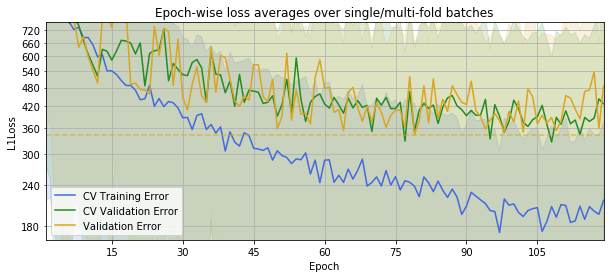

Starting the training with GPU:
[  20/ 400] (11m 41s) 	Mean Loss:	Train=194.10 +-148.85	Test=335.88 +-281.71
[  40/ 400] (22m 55s) 	Mean Loss:	Train=176.72 +-133.39	Test=404.50 +-327.70
[  60/ 400] (34m  9s) 	Mean Loss:	Train=178.41 +-130.05	Test=304.19 +-253.92
[  80/ 400] (45m 22s) 	Mean Loss:	Train=150.06 +-119.73	Test=280.17 +-252.01
[ 100/ 400] (56m 35s) 	Mean Loss:	Train=149.92 +-109.64	Test=386.79 +-340.42
[ 106/ 400] (59m 58s) 	Mean Loss:	Train=159.40 +-115.44	Test=380.49 +-310.16
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_212730205_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 271.09


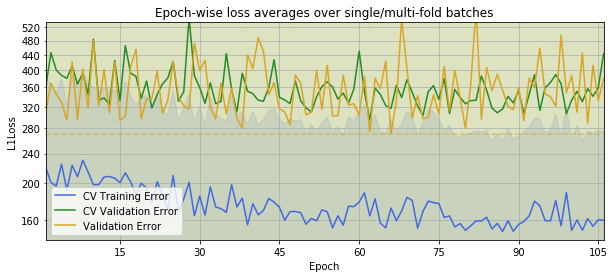

Test MAE: 705.4331362236343

patience=50
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20190119_233406151_Adadelta_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20190119_233406151_Adadelta_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  20/ 400] (11m 34s) 	Mean Loss:	Train=492.57 +-389.18	Test=820.90 +-583.84
[  40/ 400] (22m 39s) 	Mean Loss:	Train=327.25 +-243.21	Test=538.62 +-438.19
[  60/ 400] (33m 45s) 	Mean Loss:	Train=282.03 +-202.07	Test=587.33 +-435.00
[  80/ 400] (44m 50s) 	Mean Loss:	Train=232.19 +-168.67	Test=471.70 +-385.08
[ 100/ 400] (55m 53s) 	Mean Loss:	Train=219.62 +-153.40	Test=365.98 +-306.24
[ 120/ 400] (66m 56s) 	Mean Loss:	Train=194.89 +-146.28	Test=485.44 +-377.55
[ 140/ 400] (78m  0s) 	Mean Loss:	Train=191.41 +-136.00	Test=404.27 +-402.66
[ 160/ 400] (89m  5s) 	Mean Loss:	Train=159.27 +-120.22	Test=

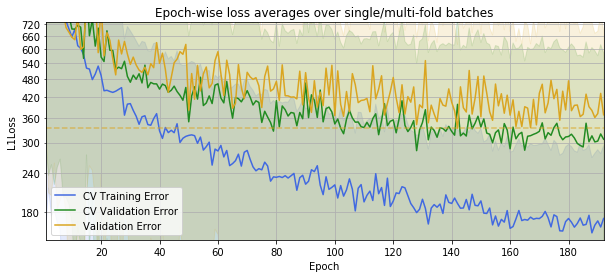

Starting the training with GPU:
[  20/ 400] (11m 52s) 	Mean Loss:	Train=158.76 +-118.45	Test=287.14 +-255.68
[  40/ 400] (23m 17s) 	Mean Loss:	Train=144.59 +-106.46	Test=295.23 +-283.59
[  60/ 400] (34m 40s) 	Mean Loss:	Train=134.14 +-102.21	Test=284.97 +-264.92
[  71/ 400] (40m 56s) 	Mean Loss:	Train=138.59 +-99.02	Test=380.55 +-310.68
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20190119_233406151_Adadelta_3x128x128_8cnn_2fc.pkl
Best Validation Loss: 255.30


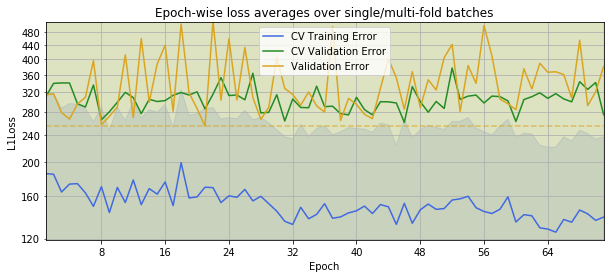

Test MAE: 680.3665560756464



In [30]:
patience_later = test_early_stopping(
    dataset=dp.DroneRGBLater, 
    weight_decay=best_l2_later[0], 
    lr=best_optimizer_later[0], 
    rho=best_optimizer_later[1], 
    patiences=[10,20,30,40,50])

#### 5.2.3 Conclusions

The results of early stopping are given for both datasets in the following tables:

In [31]:
print("RGB Earlier")
patience_earlier

RGB Earlier


,patience,epochs,loss_mean
0,10.0,70.0,593.896309
1,20.0,149.0,651.624875
2,30.0,164.0,679.735847
3,40.0,435.0,695.065347
4,50.0,261.0,484.344912


In [32]:
print("RGB Later")
patience_later

RGB Later


,patience,epochs,loss_mean
0,10.0,66.0,761.143257
1,20.0,86.0,793.493461
2,30.0,147.0,754.061897
3,40.0,225.0,705.433136
4,50.0,263.0,680.366556


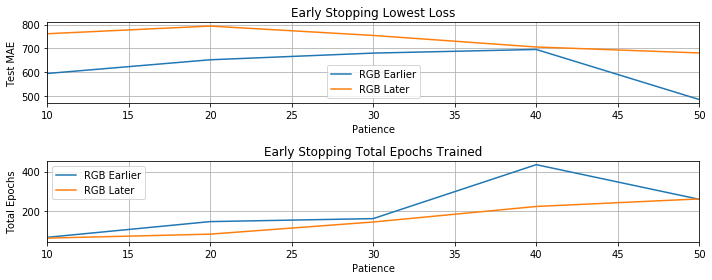

In [33]:
import matplotlib.pyplot as plt
plt.subplot(211)
plt.plot(patience_earlier['patience'],patience_earlier['loss_mean'],label='RGB Earlier')
plt.plot(patience_later['patience'],patience_later['loss_mean'],label='RGB Later')
plt.title("Early Stopping Lowest Loss")
plt.xlabel("Patience")
plt.ylabel("Test MAE")
plt.xlim(10,50)
plt.grid()
plt.legend()
plt.subplot(212)
plt.plot(patience_earlier['patience'],patience_earlier['epochs'],label='RGB Earlier')
plt.plot(patience_later['patience'],patience_later['epochs'],label='RGB Later')
plt.title("Early Stopping Total Epochs Trained")
plt.xlabel("Patience")
plt.ylabel("Total Epochs")
plt.xlim(10,50)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()